In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import mygene

import anndata
import networkx as nx
import matplotlib.pyplot as plt

from itertools import count
import itertools
from scipy.spatial import distance_matrix

import seaborn as sns
import math
from slingshot import Slingshot

from itertools import combinations
import bottleneck as bn
from scipy import interpolate
from collections import defaultdict
import statsmodels.api as sm
import statsmodels as sm

import scipy.stats
from itertools import combinations_with_replacement

import statsmodels.api as sm
import statsmodels as sm

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
#sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.5 scipy==1.8.0 pandas==1.4.2 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.10 pynndescent==0.5.6


In [100]:
data = sc.read_text("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/filtered_matrix.tsv")

adata = data.transpose()
print(adata.obs_names)
print(adata.var_names)

Index(['1x17x20', '1x17x21', '1x17x22', '1x18x18', '1x18x19', '1x18x20',
       '1x18x21', '1x18x22', '1x18x23', '1x19x17',
       ...
       '19x23x17', '19x23x18', '19x8x11', '19x8x12', '19x9x10', '19x9x11',
       '19x9x12', '19x9x13', '19x9x8', '19x9x9'],
      dtype='object', length=3111)
Index(['ENSG00000000003.14', 'ENSG00000000005.5', 'ENSG00000000419.12',
       'ENSG00000000457.13', 'ENSG00000000460.16', 'ENSG00000000938.12',
       'ENSG00000000971.15', 'ENSG00000001036.13', 'ENSG00000001084.10',
       'ENSG00000001167.14',
       ...
       'ENSG00000283667.1', 'ENSG00000283669.1', 'ENSG00000283674.1',
       'ENSG00000283675.1', 'ENSG00000283683.1', 'ENSG00000283684.1',
       'ENSG00000283689.1', 'ENSG00000283692.1', 'ENSG00000283696.1',
       'ENSG00000283698.1'],
      dtype='object', length=39739)


In [101]:
# CHANGE GENE NAMES: DUPLICATES? 
mg = mygene.MyGeneInfo()
#fixed_names = [i.split(".")[0] for i in adata.var_names]
#print(fixed_names)
#out = mg.querymany(fixed_names, scopes="ensemblgene", fields="symbol", species='human')
#print(len(out))

normalizing counts per cell
    finished (0:00:02)


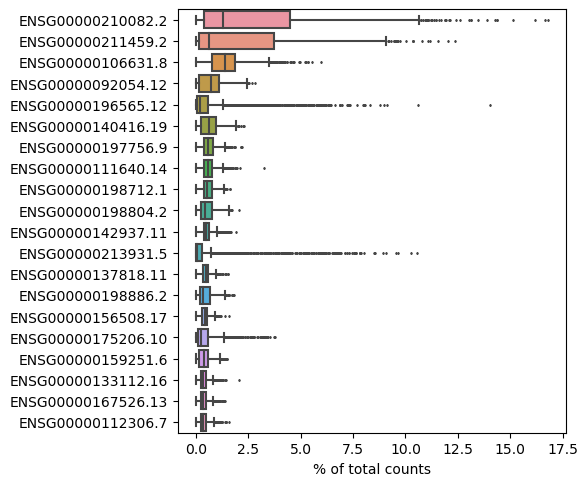

In [102]:
# genes with the highest fraction of counts in each single cell, across all cells.
sc.pl.highest_expr_genes(adata, n_top=20, )

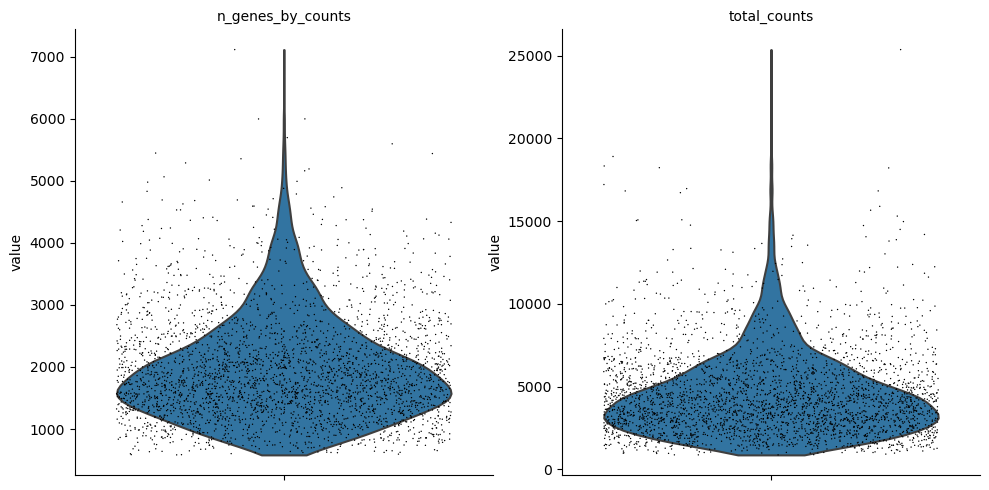

In [103]:
# compute metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


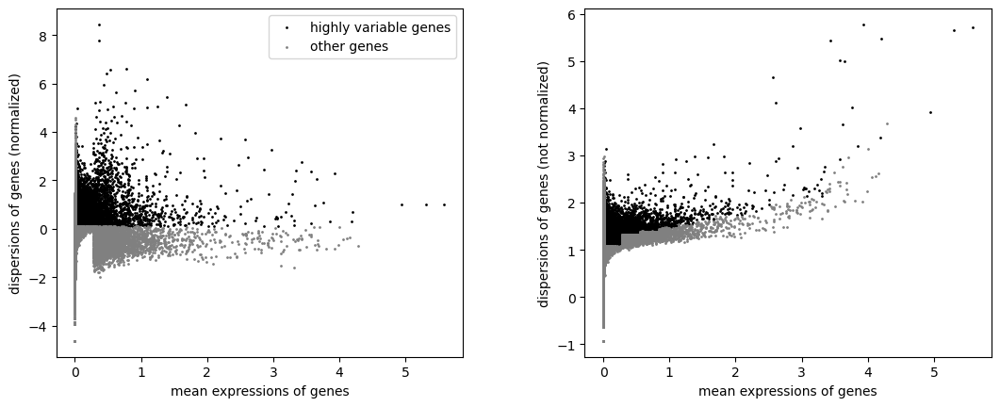

In [104]:
# total-count normalize 
sc.pp.normalize_total(adata, target_sum=1e4)
# logarithmize
sc.pp.log1p(adata)
# identify highly variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.01, max_mean=10, min_disp=0.1)  #min_mean=0.01 and min_disp=0.1 or less
sc.pl.highly_variable_genes(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:09)


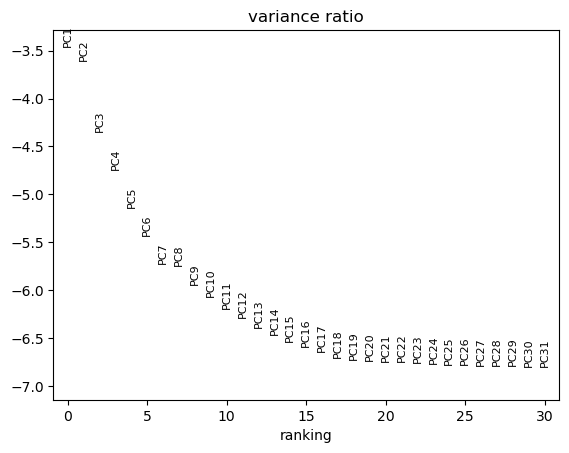

In [105]:
adata.raw = adata
# filtering
adata = adata[:, adata.var.highly_variable]
#sc.pp.regress_out(adata, ['total_counts']  # regress out effects
#sc.pp.scale(adata, max_value=10)  # scale to unit variance

# pca
sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


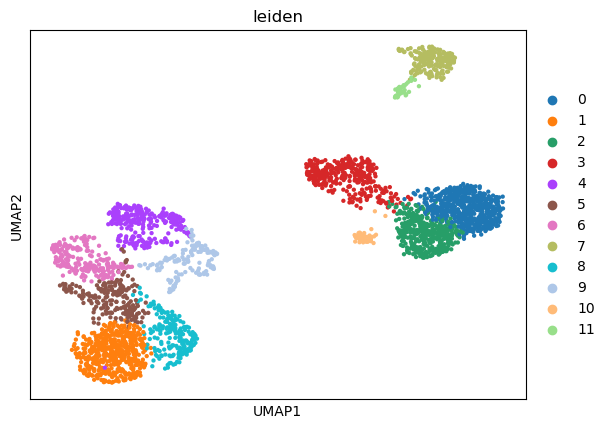

In [106]:
# neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.leiden(adata)
# embedding using UMAP
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)
sc.tl.umap(adata, init_pos='paga')
# cluster
sc.pl.umap(adata, color=['leiden'])

ranking genes
    finished (0:00:36)


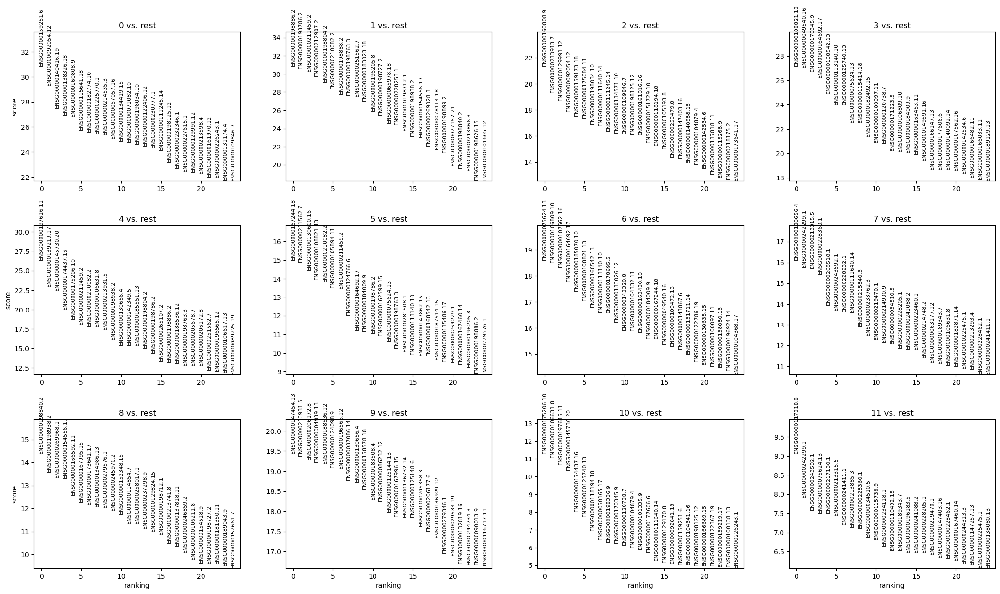

querying 1-100...done.
Finished.
                  _id     _score symbol      ensemblgene
query                                                   
ENSG00000159251    70  25.553060  ACTC1  ENSG00000159251
ENSG00000092054  4625  24.746815   MYH7  ENSG00000092054
ENSG00000140416  7168  25.553060   TPM1  ENSG00000140416
ENSG00000138326  6229  25.553060  RPS24  ENSG00000138326
ENSG00000160808  4634  25.553060   MYL3  ENSG00000160808
querying 1-100...done.
Finished.
4 input query terms found no hit:
	['ENSG00000269028', 'ENSG00000279576', 'ENSG00000255823', 'ENSG00000256618']
Pass "returnall=True" to return complete lists of duplicate or missing query terms.
                  _id    _score symbol notfound      ensemblgene
query                                                           
ENSG00000198886  4538  25.55306    ND4      NaN  ENSG00000198886
ENSG00000198786  4540  25.55306    ND5      NaN  ENSG00000198786
ENSG00000211459  4549  25.55306   RNR1      NaN  ENSG00000211459
ENSG0000021290

In [107]:
sc.settings.verbosity = 2  # reduce the verbosity
# find marker genes
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
# write results
results_file = "/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/rank_results.h5ad"
adata.write(results_file)
# get top 100 ranked genes per cluster
top_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(100)

# convert gene names
def fix(name):
    return name.split(".")[0]
fixed_markers = top_markers.apply(np.vectorize(fix))

for column in fixed_markers:
    out = mg.querymany(fixed_markers[column], scopes="ensemblgene", fields="symbol", species='human', as_dataframe=True)
    out["ensemblgene"] = out.index.to_series()
    #out["symbol"].fillna(out["ensemblgene"], inplace=True)
    print(out.head(5))
    fixed_markers[column+"_symbol"] = out["symbol"].values
    
# output
fixed_markers.to_csv("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/markers.csv")

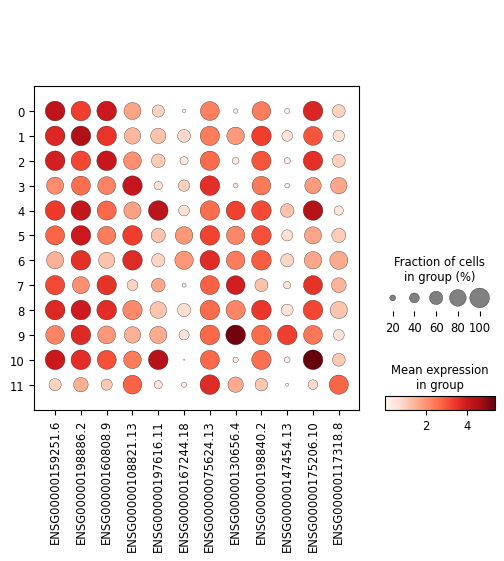

In [108]:
# visualize gene markers
marker_genes = top_markers.iloc[0].tolist()

result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(100)

sc.pl.dotplot(adata, marker_genes, groupby='leiden')

In [109]:
# add x and y coordinates
metadata = pd.read_csv("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/meta_data.tsv", 
                       sep="\t")
#print(metadata)
#adata.obs["new_x"] = metadata["new_x"]
#adata.obs["new_y"] = metadata["new_y"]
adata.obsm["spatial_coord"] = metadata.loc[:, ["new_x", "new_y"]]
print(adata.obsm["spatial_coord"])

         new_x  new_y
1x17x20  16.92  19.99
1x17x21  17.06  20.95
1x17x22  17.02  22.02
1x18x18  17.99  18.00
1x18x19  17.95  18.99
...        ...    ...
19x9x11   8.92  11.08
19x9x12   8.98  12.01
19x9x13   8.88  13.01
19x9x8    8.95   8.02
19x9x9    8.93   9.04

[3111 rows x 2 columns]


In [110]:
# split according to time points
pcw4 = adata[:"4x18x16", :]
print(pcw4.obs_names)
pcw6 = adata["5x10x21":"13x29x13", :]
print(pcw6.obs_names)
pcw9 = adata["14x11x10":, :]
print(pcw9.obs_names)

Index(['1x17x20', '1x17x21', '1x17x22', '1x18x18', '1x18x19', '1x18x20',
       '1x18x21', '1x18x22', '1x18x23', '1x19x17',
       ...
       '4x17x13', '4x17x14', '4x17x15', '4x17x16', '4x17x17', '4x17x8',
       '4x17x9', '4x18x13', '4x18x15', '4x18x16'],
      dtype='object', length=238)
Index(['5x10x21', '5x11x18', '5x11x19', '5x11x20', '5x11x21', '5x11x22',
       '5x11x23', '5x11x24', '5x12x17', '5x12x18',
       ...
       '13x26x16', '13x26x7', '13x26x8', '13x26x9', '13x27x14', '13x27x15',
       '13x27x7', '13x27x9', '13x28x12', '13x29x13'],
      dtype='object', length=1515)
Index(['14x11x10', '14x11x11', '14x11x7', '14x11x8', '14x11x9', '14x12x10',
       '14x12x11', '14x12x12', '14x12x13', '14x12x5',
       ...
       '19x23x17', '19x23x18', '19x8x11', '19x8x12', '19x9x10', '19x9x11',
       '19x9x12', '19x9x13', '19x9x8', '19x9x9'],
      dtype='object', length=1358)


In [111]:
from sklearn.neighbors import kneighbors_graph

# merge replicate spots
pcw4 = adata[:"4x18x16", :]
pcw6 = adata["5x10x21":"13x29x13", :]
pcw9 = adata["14x11x10":, :]

coord_pcw4 = pcw4.obsm["spatial_coord"].to_numpy()
coord_pcw6 = pcw6.obsm["spatial_coord"].to_numpy()
coord_pcw9 = pcw9.obsm["spatial_coord"].to_numpy()

from sklearn.neighbors import radius_neighbors_graph
r = 0.5
R4 = radius_neighbors_graph(coord_pcw4, r, mode='connectivity', include_self=False).toarray()
R6 = radius_neighbors_graph(coord_pcw6, r, mode='connectivity', include_self=False).toarray()
R9 = radius_neighbors_graph(coord_pcw9, r, mode='connectivity', include_self=False).toarray()

pcw4.obsp["rnn_connectivity"] = R4
pcw6.obsp["rnn_connectivity"] = R6
pcw9.obsp["rnn_connectivity"] = R9

# group duplicate spots together
group = 1
pcw4.obs["spot_group"] = ["0"]*(pcw4.n_obs)
for gene_ind in range(len(R4)):
    if pcw4.obs["spot_group"][gene_ind] == "0":
        pcw4.obs["spot_group"].iat[gene_ind] = str(group)
        for connected_ind in range(len(R4[gene_ind])):
            if R4[gene_ind][connected_ind] == 1:
                pcw4.obs["spot_group"].iat[connected_ind] = str(group)
        group += 1
        
group = 1
pcw6.obs["spot_group"] = ["0"]*(pcw6.n_obs)
for gene_ind in range(len(R6)):
    if pcw6.obs["spot_group"][gene_ind] == "0":
        pcw6.obs["spot_group"].iat[gene_ind] = str(group)
        for connected_ind in range(len(R6[gene_ind])):
            if R6[gene_ind][connected_ind] == 1:
                pcw6.obs["spot_group"].iat[connected_ind] = str(group)
        group += 1
        
group = 1
pcw9.obs["spot_group"] = ["0"]*(pcw9.n_obs)
for gene_ind in range(len(R9)):
    if pcw9.obs["spot_group"][gene_ind] == "0":
        pcw9.obs["spot_group"].iat[gene_ind] = str(group)
        for connected_ind in range(len(R9[gene_ind])):
            if R9[gene_ind][connected_ind] == 1:
                pcw9.obs["spot_group"].iat[connected_ind] = str(group)
        group += 1        

# merge 
import anndata
import networkx as nx
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (50,50)


# knn graphs
k = 10

# PCW 4
df4 = sc.get.obs_df(pcw4, keys=["spot_group", *pcw4.var_names], obsm_keys=[("spatial_coord", "new_x"), ("spatial_coord", "new_y")])
group_df4 = df4.groupby("spot_group").mean()
grouped_pcw4 = anndata.AnnData(X=group_df4.iloc[:, :-2], obsm=group_df4.loc[:, ["spatial_coord-new_x","spatial_coord-new_y"]])
grouped_pcw4.obsm["spatial_coord"] = group_df4.loc[:, ["spatial_coord-new_x","spatial_coord-new_y"]]

#coord_pcw4 = grouped_pcw4.obsm["spatial_coord"].to_numpy()
#B4 = kneighbors_graph(coord_pcw4, k, mode='connectivity', include_self=False).toarray()
#grouped_pcw4.obsp["knn_connectivity"] = B4

# PCW 6
df6 = sc.get.obs_df(pcw6, keys=["spot_group", *pcw6.var_names], obsm_keys=[("spatial_coord", "new_x"), ("spatial_coord", "new_y")])
group_df6 = df6.groupby("spot_group").mean()
grouped_pcw6 = anndata.AnnData(X=group_df6.iloc[:, :-2], obsm=group_df6.loc[:, ["spatial_coord-new_x","spatial_coord-new_y"]])
grouped_pcw6.obsm["spatial_coord"] = group_df6.loc[:, ["spatial_coord-new_x","spatial_coord-new_y"]]

#coord_pcw6 = grouped_pcw6.obsm["spatial_coord"].to_numpy()
#B6 = kneighbors_graph(coord_pcw6, k, mode='connectivity', include_self=False).toarray()
#grouped_pcw6.obsp["knn_connectivity"] = B6

# PCW 9
df9 = sc.get.obs_df(pcw9, keys=["spot_group", *pcw9.var_names], obsm_keys=[("spatial_coord", "new_x"), ("spatial_coord", "new_y")])
group_df9 = df9.groupby("spot_group").mean()
grouped_pcw9 = anndata.AnnData(X=group_df9.iloc[:, :-2], obsm=group_df9.loc[:, ["spatial_coord-new_x","spatial_coord-new_y"]])
grouped_pcw9.obsm["spatial_coord"] = group_df9.loc[:, ["spatial_coord-new_x","spatial_coord-new_y"]]

#coord_pcw9 = grouped_pcw9.obsm["spatial_coord"].to_numpy()
#B9 = kneighbors_graph(coord_pcw9, k, mode='connectivity', include_self=False).toarray()
#grouped_pcw9.obsp["knn_connectivity"] = B9
'''
del grouped_pcw4.obsm['spatial_coord-new_x']
del grouped_pcw4.obsm['spatial_coord-new_y']

# plot graphs
# PCW 4
plt.figure(1)
xy = grouped_pcw4.obsm["spatial_coord"].to_numpy()
graph4 = nx.Graph()
# add nodes to graph
for node in range(len(xy)):
    graph4.add_node(node)
    
# add edges to graph        
#graph4.add_edges_from(B4)
adj_matrix = grouped_pcw4.obsp["knn_connectivity"]
for u in range(len(xy)):
    for v in range(len(adj_matrix[u])):
        if adj_matrix[u][v] == 1:
            graph4.add_edge(u,v)
nx.draw(graph4, [(x,y) for x,y in xy], node_size=10)

# PCW 6
plt.figure(2)
xy = grouped_pcw6.obsm["spatial_coord"].to_numpy()
graph6 = nx.Graph()
# add nodes to graph
for node in range(len(xy)):
    graph6.add_node(node)
    
# add edges to graph        
adj_matrix = grouped_pcw6.obsp["knn_connectivity"]
for u in range(len(xy)):
    for v in range(len(adj_matrix[u])):
        if adj_matrix[u][v] == 1:
            graph6.add_edge(u,v)
nx.draw(graph6, [(x,y) for x,y in xy], node_size=10)

# PCW 9
plt.figure(3)
xy = grouped_pcw9.obsm["spatial_coord"].to_numpy()
graph9 = nx.Graph()
# add nodes to graph
for node in range(len(xy)):
    graph9.add_node(node)
    
# add edges to graph        
adj_matrix = grouped_pcw9.obsp["knn_connectivity"]
for u in range(len(xy)):
    for v in range(len(adj_matrix[u])):
        if adj_matrix[u][v] == 1:
            graph9.add_edge(u,v)
nx.draw(graph9, [(x,y) for x,y in xy], node_size=10)
'''

'\ndel grouped_pcw4.obsm[\'spatial_coord-new_x\']\ndel grouped_pcw4.obsm[\'spatial_coord-new_y\']\n\n# plot graphs\n# PCW 4\nplt.figure(1)\nxy = grouped_pcw4.obsm["spatial_coord"].to_numpy()\ngraph4 = nx.Graph()\n# add nodes to graph\nfor node in range(len(xy)):\n    graph4.add_node(node)\n    \n# add edges to graph        \n#graph4.add_edges_from(B4)\nadj_matrix = grouped_pcw4.obsp["knn_connectivity"]\nfor u in range(len(xy)):\n    for v in range(len(adj_matrix[u])):\n        if adj_matrix[u][v] == 1:\n            graph4.add_edge(u,v)\nnx.draw(graph4, [(x,y) for x,y in xy], node_size=10)\n\n# PCW 6\nplt.figure(2)\nxy = grouped_pcw6.obsm["spatial_coord"].to_numpy()\ngraph6 = nx.Graph()\n# add nodes to graph\nfor node in range(len(xy)):\n    graph6.add_node(node)\n    \n# add edges to graph        \nadj_matrix = grouped_pcw6.obsp["knn_connectivity"]\nfor u in range(len(xy)):\n    for v in range(len(adj_matrix[u])):\n        if adj_matrix[u][v] == 1:\n            graph6.add_edge(u,v)\nnx

In [112]:
# add gene expression
from scipy.spatial import distance_matrix
from sklearn.neighbors import NearestNeighbors

def PCA(adata):
    sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)
    # total-count normalize 
    sc.pp.normalize_total(adata, target_sum=1e4)
    # logarithmize
    sc.pp.log1p(adata)
    # identify highly variable genes
    #sc.pp.highly_variable_genes(adata, min_mean=0.1, max_mean=10, min_disp=0.5)
    #adata.raw = adata
    # filtering
    #adata = adata[:, adata.var.highly_variable]
    # pca
    #print(adata)
    sc.tl.pca(adata, n_comps=50, svd_solver='arpack')
    return adata


def weighted_distance_matrix(adata, k):  # computes the spatial distance matrix
    # euclidian distance matrix
    adata.obsp["spa_distances"] = distance_matrix(adata.obsm['spatial_coord'].to_numpy(), adata.obsm['spatial_coord'].to_numpy())
    #print(adata.obsp["spa_distances"])
    # find kth nearest neighbour
    nbrs = NearestNeighbors(n_neighbors=k).fit(adata.obsm['spatial_coord'].to_numpy())
    distances, indices = nbrs.kneighbors(adata.obsm['spatial_coord'].to_numpy())
    #print(distances[0])
    #print(indices[0])
    # compute affinity matrix
    aff = np.zeros((adata.n_obs, adata.n_obs))
    for i in range(len(aff)):
        #mu = np.mean(distances[i])
        for j in range(len(aff[i])):
            # find distance of kth nearest neighbour
            sigma = distances[i][k-1]
            # compute affinity with gaussian kernel
            kernel = np.exp(-(adata.obsp["spa_distances"][i][j]) ** 2 / (sigma ** 2))
            # sigma = ??
            #kernel = np.exp(-(adata_pca.obsp["gene_distances"][i][j]-mu) ** 2 / (sigma ** 2))
            #print(kernel)
            aff[i][j] = kernel
    #print(aff)
    # symmetrize
    aff = (aff + np.transpose(aff))/2
    #print(aff)
    
    return aff


def affinity_matrix(adata, k):  # computes the gene distance matrix
    # PCA
    #adata_pca = PCA(adata)
    # euclidian distance matrix
    adata.obsp["gene_distances"] = distance_matrix(adata.obsm['X_pca'], adata.obsm['X_pca'])  #len(adata)xlen(adata)
    #print(adata_pca.obsp["gene_distances"])
    # find kth nearest neighbour
    nbrs = NearestNeighbors(n_neighbors=k).fit(adata.obsm["X_pca"])
    distances, indices = nbrs.kneighbors(adata.obsm["X_pca"])
    #print(distances)
    #print(indices)
    # compute affinity matrix
    aff = np.zeros((adata.n_obs, adata.n_obs))
    for i in range(len(aff)):
        #mu = np.mean(distances[i])
        for j in range(len(aff[i])):
            # find distance of kth nearest neighbour
            sigma = distances[i][k-1]
            # compute affinity with gaussian kernel
            kernel = np.exp(-(adata.obsp["gene_distances"][i][j]) ** 2 / (sigma ** 2))
            # sigma = ??
            #kernel = np.exp(-(adata_pca.obsp["gene_distances"][i][j]-mu) ** 2 / (sigma ** 2))
            #print(kernel)
            aff[i][j] = kernel
    #print(aff)
    # symmetrize
    aff = (aff + np.transpose(aff))/2
    #print(aff)
    
    return aff
            

alpha = 0.5
grouped_pcw4 = PCA(grouped_pcw4)
# compute distance matrix
#grouped_pcw4.obsp["spa_distances"] = distance_matrix(grouped_pcw4.obsm['spatial_coord'].to_numpy(), grouped_pcw4.obsm['spatial_coord'].to_numpy())
# compute distance matrix w/ gaussian kernel
grouped_pcw4.obsp["gau_spa_distances"] = weighted_distance_matrix(grouped_pcw4, k=10)
# compute affinity matrix of gene expression
grouped_pcw4.obsp["aff_matrix"] = affinity_matrix(grouped_pcw4, k=10)
# aggregate using element-wise multiplication
#grouped_pcw4.obsp["agg_matrix"] = np.multiply(grouped_pcw4.obsp["gau_spa_distances"], grouped_pcw4.obsp["aff_matrix"])
grouped_pcw4.obsp["agg_matrix"] = np.add(alpha/2*grouped_pcw4.obsp["gau_spa_distances"], (1-alpha)/2*grouped_pcw4.obsp["aff_matrix"])
#print(grouped_pcw4.obsp["agg_matrix"])

grouped_pcw6 = PCA(grouped_pcw6)
# compute distance matrix
#grouped_pcw6.obsp["spa_distances"] = distance_matrix(grouped_pcw6.obsm['spatial_coord'].to_numpy(), grouped_pcw6.obsm['spatial_coord'].to_numpy())
# compute distance matrix w/ gaussian kernel
grouped_pcw6.obsp["gau_spa_distances"] = weighted_distance_matrix(grouped_pcw6, k=10)
# compute affinity matrix
grouped_pcw6.obsp["aff_matrix"] = affinity_matrix(grouped_pcw6, k=10)
# aggregate using element-wise multiplication
#grouped_pcw6.obsp["agg_matrix"] = np.multiply(grouped_pcw6.obsp["gau_spa_distances"], grouped_pcw6.obsp["aff_matrix"])
grouped_pcw6.obsp["agg_matrix"] = np.add(alpha/2*grouped_pcw6.obsp["gau_spa_distances"], (1-alpha)/2*grouped_pcw6.obsp["aff_matrix"])
#print(grouped_pcw6.obsp["agg_matrix"])

grouped_pcw9 = PCA(grouped_pcw9)
# compute distance matrix
#grouped_pcw9.obsp["spa_distances"] = distance_matrix(grouped_pcw9.obsm['spatial_coord'].to_numpy(), grouped_pcw9.obsm['spatial_coord'].to_numpy())
# compute distance matrix w/ gaussian kernel
grouped_pcw9.obsp["gau_spa_distances"] = weighted_distance_matrix(grouped_pcw9, k=10)
#print(grouped_pcw9.obsp["gau_spa_distances"])
#print("-----------")
# compute affinity matrix
grouped_pcw9.obsp["aff_matrix"] = affinity_matrix(grouped_pcw9, k=10)
#print(grouped_pcw9.obsp["aff_matrix"] )
# aggregate using element-wise multiplication
# affinity matrix on spatial distances
#grouped_pcw9.obsp["agg_matrix"] = np.multiply(grouped_pcw9.obsp["gau_spa_distances"], grouped_pcw9.obsp["aff_matrix"])
grouped_pcw9.obsp["agg_matrix"] = np.add(alpha/2*grouped_pcw9.obsp["gau_spa_distances"], (1-alpha)/2*grouped_pcw9.obsp["aff_matrix"])
#print("-----------")
#print(grouped_pcw9.obsp["agg_matrix"])

#w1^(a)*w2^(1-a)
# weighted average 


normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:01)
normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:01)


Affinity using Gaussian kernel according to paper
$$ A(i, j) = e^{-\frac{Dist(i,j)^2}{\sigma^2}} $$
Only based on gene expression\
Or should it be
$$ A(i, j) = e^{-\frac{(x-\mu)^2}{\sigma^2}} $$
what's $\sigma$ tho


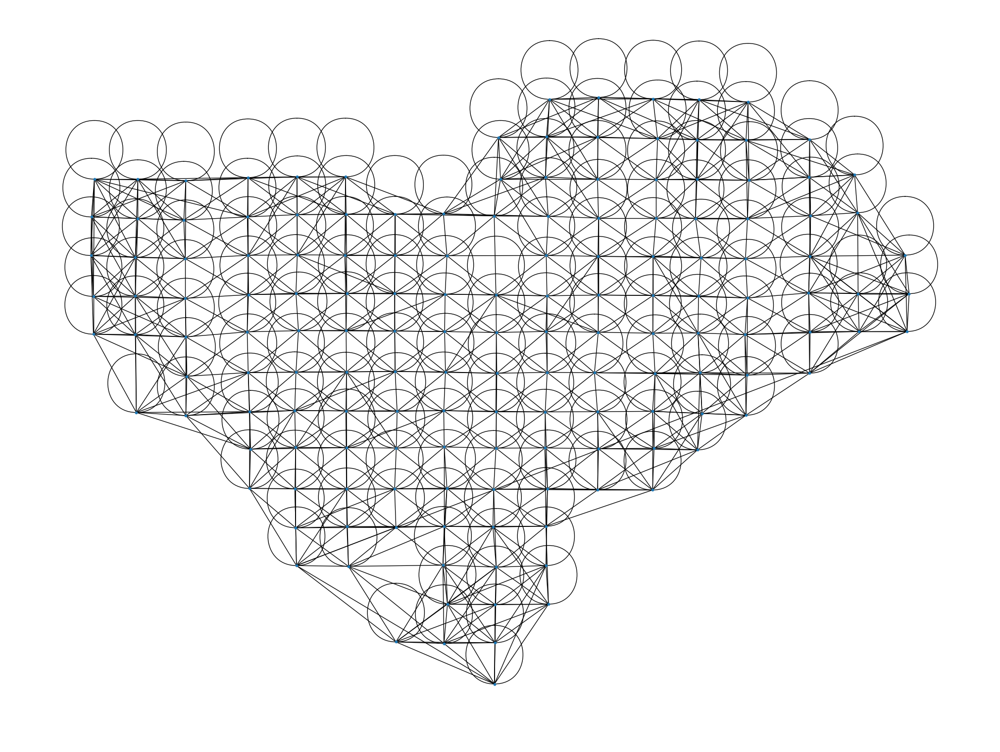

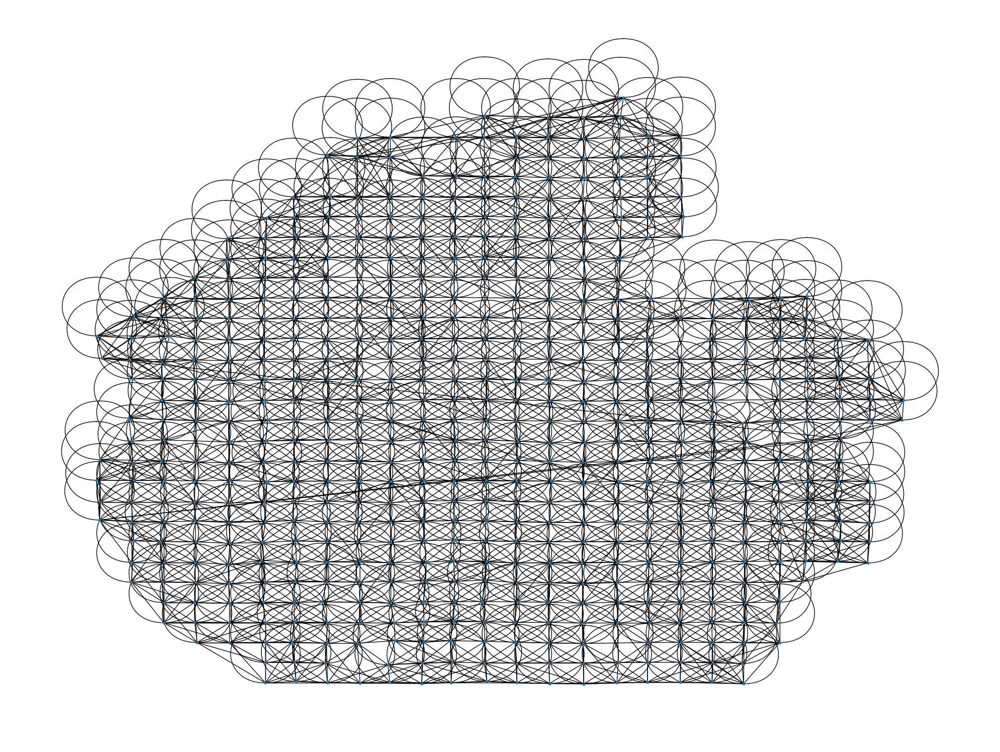

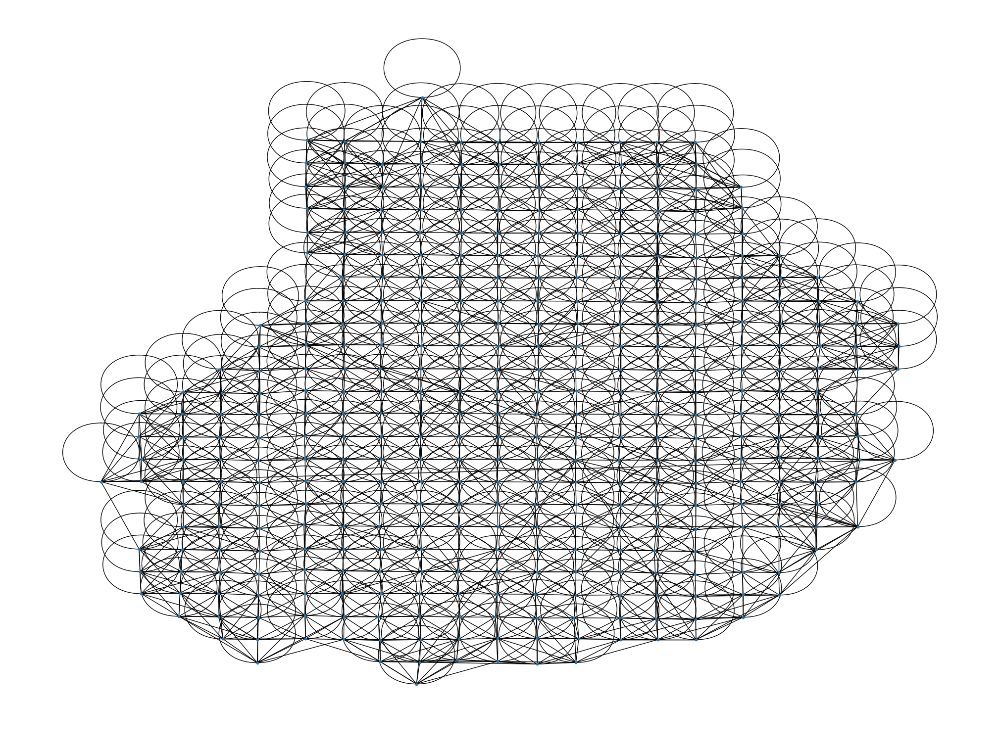

In [114]:
# knn on aggregated distance matrix
from sklearn.neighbors import NearestNeighbors
plt.rcParams["figure.figsize"] = (20, 15)

def knn_graph(adata):
    neigh = NearestNeighbors(n_neighbors=10, metric="precomputed")
    neigh.fit(1/adata.obsp["agg_matrix"])
    C = neigh.kneighbors_graph(1/adata.obsp["agg_matrix"], mode='connectivity').toarray()
    plt.figure()
    xy = adata.obsm["spatial_coord"].to_numpy()
    graph = nx.Graph()
    # add nodes to graph
    for node in range(len(xy)):
        graph.add_node(node)

    # add edges to graph        
    #graph4.add_edges_from(B4)
    adj_matrix = C
    for u in range(len(xy)):
        for v in range(len(adj_matrix[u])):
            if adj_matrix[u][v] == 1:
                graph.add_edge(u,v)
    nx.draw(graph, [(x,y) for x,y in xy], node_size=10)
    
    return C
    
grouped_pcw4.obsp["agg_knn_connectivity"] = knn_graph(grouped_pcw4)
#print(grouped_pcw4.obsp["agg_knn_connectivity"])
grouped_pcw6.obsp["agg_knn_connectivity"] = knn_graph(grouped_pcw6)
grouped_pcw9.obsp["agg_knn_connectivity"] = knn_graph(grouped_pcw9)

Every neural network layer can then be written as a non-linear function
$$ H(l+1)=f(H(l),A) $$

$$ f(H^{(l)},A)=σ(D^{−1/2}(A+I) D^{−1/2}H^{(l)}W^{(l)}) $$

with adjacency matrix $A$ (or some function thereof) <br>
symmetric normalization $D^{−1/2}(A+I) D^{−1/2}$ <br>
$W(l)$ is a weight matrix for the l-th neural network layer <br>
$σ(⋅)$ is a non-linear activation function like the ReLU

In [ ]:
#### grouped_pcw4
#len(grouped_pcw4.obsp["agg_matrix"])
#len(grouped_pcw4.obsp["agg_matrix"])
#len(grouped_pcw4.obsm['X_pca'])  # 154x50

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running PAGA
    finished (0:00:00)
computing UMAP
    finished (0:00:01)


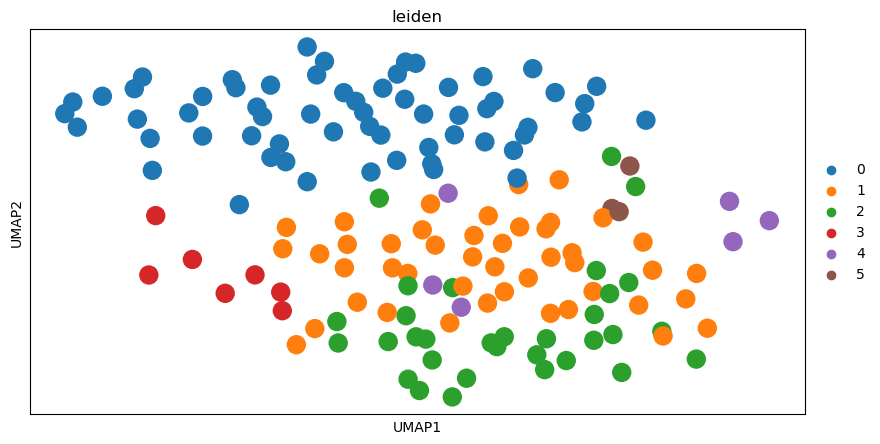

In [115]:
plt.rcParams["figure.figsize"] = (10,5)
# neighborhood graph
sc.pp.neighbors(grouped_pcw4, n_neighbors=10, n_pcs=50)
sc.tl.leiden(grouped_pcw4)
# embedding using UMAP
sc.tl.paga(grouped_pcw4)
sc.pl.paga(grouped_pcw4, plot=False)
sc.tl.umap(grouped_pcw4, init_pos='paga')
#sc.tl.umap(grouped_pcw4)
# cluster
sc.pl.umap(grouped_pcw4, color=['leiden'])

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running PAGA
    finished (0:00:00)
computing UMAP
    finished (0:00:01)


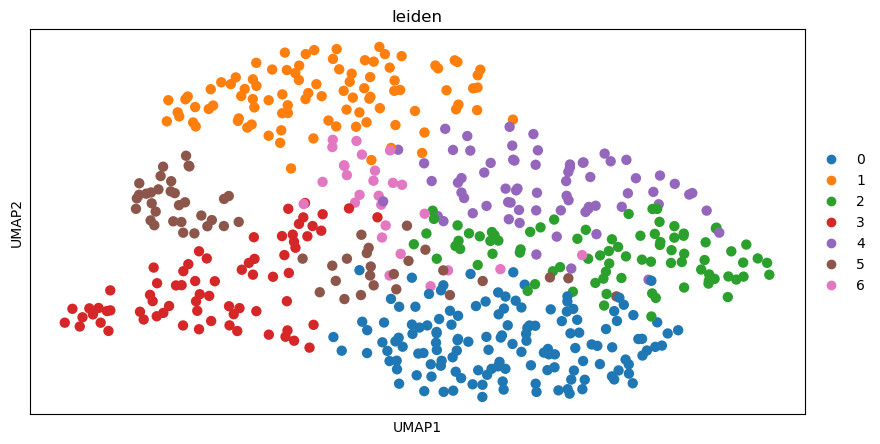

In [116]:
plt.rcParams["figure.figsize"] = (10,5)
# neighborhood graph
sc.pp.neighbors(grouped_pcw6, n_neighbors=10, n_pcs=50)
sc.tl.leiden(grouped_pcw6)
# embedding using UMAP
sc.tl.paga(grouped_pcw6)
sc.pl.paga(grouped_pcw6, plot=False)
sc.tl.umap(grouped_pcw6, init_pos='paga')
# cluster
sc.pl.umap(grouped_pcw6, color=['leiden'])

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running PAGA
    finished (0:00:00)
computing UMAP
    finished (0:00:02)


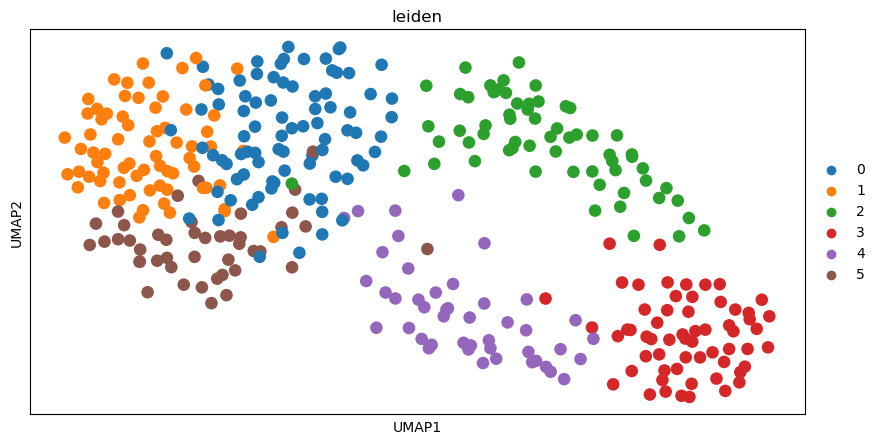

In [117]:
plt.rcParams["figure.figsize"] = (10,5)
# neighborhood graph
sc.pp.neighbors(grouped_pcw9, n_neighbors=10, n_pcs=50)
sc.tl.leiden(grouped_pcw9)
# embedding using UMAP
sc.tl.paga(grouped_pcw9)
sc.pl.paga(grouped_pcw9, plot=False)
sc.tl.umap(grouped_pcw9, init_pos='paga')
# cluster
sc.pl.umap(grouped_pcw9, color=['leiden'])

In [118]:
# plot clusters
def plot_clusters(adata, grouped_pcw, modality):
    plt.figure()
    xy = grouped_pcw.obsm["spatial_coord"].to_numpy()
    graph = nx.Graph()
    # add nodes to graph
    for node in range(len(xy)):
        graph.add_node(node, cluster=adata.obs[modality][node])
    
    color_state_map = {'0': 'red', '1': 'blue', '2': 'darkorange', '3':'green', '4':'black', '5':'purple', 
                       '6':'brown', '7':'pink', '8':'yellow', '9':'cyan', np.nan:'grey'}
    nx.draw(graph, [(x,y) for x,y in xy], node_size=20, node_color=[color_state_map[node[1]['cluster']] 
                    for node in graph.nodes(data=True)])


In [119]:
from itertools import count

# plot gene intensity map
def plot_genemap(grouped_pcw, gene):
    plt.figure()
    xy = grouped_pcw.obsm["spatial_coord"].to_numpy()
    graph = nx.Graph()
    # add nodes to graph
    for node in range(len(xy)):
        graph.add_node(node, expression=grouped_pcw[node, gene].X[0][0])
    
    # get unique groups
    groups = set(nx.get_node_attributes(graph,'expression').values())
    mapping = dict(zip(sorted(groups),count()))
    nodes = graph.nodes()
    colors = [mapping[graph.nodes[n]['expression']] for n in nodes]

    #nc = nx.draw(graph, [(x,y) for x,y in xy], node_size=20, node_color=colors, cmap=plt.cm.jet)
    nc = nx.draw_networkx_nodes(graph, [(x,y) for x,y in xy], nodelist=nodes, node_color=colors, 
                                node_size=100, cmap=plt.cm.jet)
    plt.colorbar(nc)
    ensembl_id = gene.split(".")[0]
    gene_name = mg.query(q="ensembl.gene:"+ensembl_id, fields="symbol", species='human')['hits'][0].get("symbol", "")
    print(gene_name)
    plt.title(gene + "/" + gene_name)
    plt.show()


In [120]:
# quantify spatial gene expression patterns
import itertools
from scipy.spatial import distance_matrix

def score_spatial(grouped_pcw):
    print(grouped_pcw.var)
    score_list = []
    for gene in grouped_pcw.var_names:
        #total_count = grouped_pcw[:,gene].obs['total_counts'].sum()
        #flat = [item for items in grouped_pcw[:,gene].X for item in items if item!=0.0]
        #print(flat)
        spot_list = []
        coord_list = []
        #print(grouped_pcw.obsm['spatial_coord'])
        for spot in grouped_pcw.obs_names:
            if grouped_pcw[spot,gene].X[0][0] != 0.0:
                spot_list.append(spot)
                coord_list.append((grouped_pcw.obsm['spatial_coord-new_x'][spot], grouped_pcw.obsm['spatial_coord-new_y'][spot]))
            
        #print(coord_list)
        if coord_list:
            dist_matrix = distance_matrix(coord_list, coord_list)
            score = np.mean(dist_matrix)
        else:
            score = None
        score_list.append(score)

    return score_list
    #pd.DataFrame(score_list)


In [121]:
#grouped_pcw4.var["spatial_score"] = score_spatial(grouped_pcw4)
#grouped_pcw6.var["spatial_score"] = score_spatial(grouped_pcw6)
#grouped_pcw9.var["spatial_score"] = score_spatial(grouped_pcw9)
#print(grouped_pcw4)
#print(grouped_pcw4.var["spatial_score"])
#print(grouped_pcw6.var["spatial_score"])
#print(grouped_pcw9.var["spatial_score"])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0, 0.5, 'Frequency')

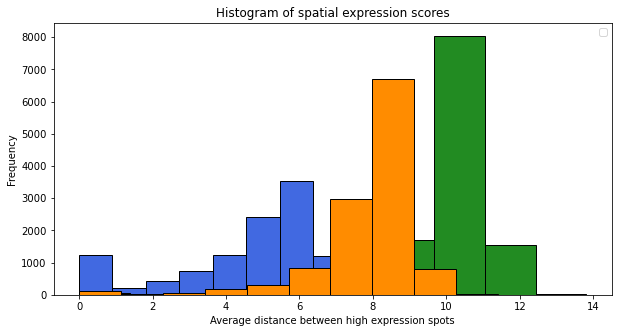

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

# matplotlib histogram
#plt.hist(grouped_pcw4.var["spatial_score"], color = 'royalblue', edgecolor = 'black')
#plt.hist(grouped_pcw6.var["spatial_score"], color = 'forestgreen', edgecolor = 'black')
#plt.hist(grouped_pcw9.var["spatial_score"], color = 'darkorange', edgecolor = 'black')

# Add labels
#plt.title('Histogram of spatial expression scores')
#plt.legend()
#plt.xlabel('Average distance between high expression spots')
#plt.ylabel('Frequency')

In [122]:
import gc
import numpy as np
import pandas as pd
import math
import scanpy.plotting
import torch
import torch.nn as nn
from torch.nn.parameter import Parameter
from torch.nn.modules.module import Module
import torch.nn.functional as F
import anndata
import pyro
import pyro.distributions as dist
from scipy.sparse import csc_matrix
from scvi.module.base import PyroBaseModuleClass
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from umap import UMAP
from pyro.infer import SVI, Trace_ELBO
from pyro.optim import ClippedAdam,AdagradRMSProp
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score,normalized_mutual_info_score
import os

os.environ["CUDA_VISIBLE_DEVICES"] = '1'
pyro.distributions.enable_validation(False)
pyro.set_rng_seed(0)

class GraphConvolution(Module):
    """
    Simple GCN layer, similar to https://arxiv.org/abs/1609.02907
    """

    def __init__(self, in_features, out_features, bias=True):
        super(GraphConvolution, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.weight = Parameter(torch.FloatTensor(in_features, out_features))
        if bias:
            self.bias = Parameter(torch.FloatTensor(out_features))  # bias?
        else:
            self.register_parameter('bias', None)
        self.reset_parameters()

    def reset_parameters(self):
        stdv = 1. / math.sqrt(self.weight.size(1))
        self.weight.data.uniform_(-stdv, stdv)
        if self.bias is not None:
            self.bias.data.uniform_(-stdv, stdv)

    def forward(self, input, adj):
        support = torch.mm(input, self.weight)
        output = torch.spmm(adj, support)
        if self.bias is not None:
            return output + self.bias
        else:
            return output

    def __repr__(self):
        return self.__class__.__name__ + ' (' \
               + str(self.in_features) + ' -> ' \
               + str(self.out_features) + ')'

class Encoder(nn.Module):
    def __init__(self, in_dim, z_dim, nhid, hidden_dim, dropout):
        super().__init__()
        self.gc1 = GraphConvolution(in_dim, nhid)
        self.dropout = dropout
        #self.fc1 = nn.Sequential(nn.Linear(nhid, hidden_dim), nn.BatchNorm1d(hidden_dim), nn.Softplus())
        self.fc1 = nn.Linear(nhid, hidden_dim)
        self.fc21 = nn.Linear(hidden_dim, z_dim)
        self.fc22 = nn.Linear(hidden_dim, z_dim)
        self.softplus = nn.Softplus()

    def forward(self, x,adj):
        ###
        x = F.relu(self.gc1(x, adj))  # ReLU(AXW)
        x = F.dropout(x, self.dropout, training=self.training)
        hidden = self.softplus(self.fc1(x))
        z_loc = self.softplus(self.fc21(hidden))
        z_scale = torch.exp(self.softplus(self.fc22(hidden)))
        # latent z
        return z_loc, z_scale

    
class Decoder(nn.Module):
    def __init__(self, in_dim, z_dim, hidden_dim):
        super().__init__()

        #self.fc1 = nn.Sequential(nn.Linear(z_dim, hidden_dim), nn.BatchNorm1d(hidden_dim), nn.Softplus())
        self.fc1 = nn.Linear(z_dim, hidden_dim)
        self.fc21 = nn.Linear(hidden_dim, in_dim)
        self.fc22 = nn.Linear(hidden_dim, in_dim)

        self.softplus = nn.Softplus()

    def forward(self, z):
        ###
        hidden = self.softplus(self.fc1(z))
        count = self.softplus(self.fc21(hidden))
        prob = self.softplus(self.fc22(hidden))
        
        ######
        return count, prob



class VAE(PyroBaseModuleClass):
    def __init__(self, n_input, n_latent, nhid, n_clusters, dropout):
        super().__init__()
        self.n_latent = n_latent
        self.n_input = n_input
        self.n_clusters = n_clusters

        self.decoder = Decoder(n_input, n_latent, 400)
        self.log_theta = torch.nn.Parameter(torch.randn(n_input))
        self.gate_logits = torch.nn.Parameter(torch.randn(n_input),requires_grad=True)
        self.embeddings = nn.Parameter(torch.randn(self.n_clusters, n_latent) * 0.05, requires_grad=True)
        self.encoder = Encoder(n_input, n_latent,  nhid, 128,  dropout)

    def model(self, x,adj):
        pyro.module("decoder", self)
        with pyro.plate("data", x.shape[0]):
            z_loc = x.new_zeros(torch.Size((x.shape[0], self.n_latent)))
            z_scale = x.new_ones(torch.Size((x.shape[0], self.n_latent)))
            z = pyro.sample("latent", dist.Normal(z_loc, z_scale).to_event(1))  # loss
            count, prob = self.decoder(z)
            ######
            x_dist = dist.ZeroInflatedNegativeBinomial(total_count=count+1,probs=prob, gate_logits=self.gate_logits)
            pyro.sample("obs1", x_dist.to_event(1), obs=x)  # loss function calculated added tgt


    def guide(self, x,adj):
        pyro.module("encoder", self)
        with pyro.plate("data", x.shape[0]):
            x_ = torch.log(1+x)
            [qz_m, qz_v] = self.encoder(x_,adj)
            pyro.sample("latent", dist.Normal(qz_m,qz_v).to_event(1))  # loss nearest to std norm dist in vae(can be other dist)


    def getZ(self, x, adj):
        z_loc, z_scale = self.encoder(x,adj)
        z = dist.Normal(z_loc, z_scale).sample()
        return z




def train(svi, train_loader,adj, use_cuda=True):
    epoch_loss = 0
    for x in train_loader:
        if use_cuda:
            x = x.cuda()
            adj = adj.cuda()
        epoch_loss += svi.step(x,adj)

    normalizer_train = len(train_loader.dataset)
    total_epoch_loss_train = epoch_loss / normalizer_train
    return total_epoch_loss_train



In [7]:
print(grouped_pcw4.n_vars)

12088


[epoch 000] average training loss: 78496930.1356
[epoch 001] average training loss: 1934128.0150
[epoch 002] average training loss: 339913.7396
[epoch 003] average training loss: 72217.9267
[epoch 004] average training loss: 53832.2697
[epoch 005] average training loss: 31963.9962
[epoch 006] average training loss: 27293.6147
[epoch 007] average training loss: 19816.9295
[epoch 008] average training loss: 18597.6712
[epoch 009] average training loss: 16343.6563
[epoch 010] average training loss: 15347.3492
[epoch 011] average training loss: 14665.7206
[epoch 012] average training loss: 13163.7575
[epoch 013] average training loss: 12091.3977
[epoch 014] average training loss: 11539.5316
[epoch 015] average training loss: 10793.8798
[epoch 016] average training loss: 10346.7546
[epoch 017] average training loss: 9819.0002
[epoch 018] average training loss: 9448.4146
[epoch 019] average training loss: 9098.1478
[epoch 020] average training loss: 8748.6004
[epoch 021] average training los

/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_1675/1867297754.py:75: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_z4 = anndata.AnnData(TZ)
/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


    finished (0:00:01)


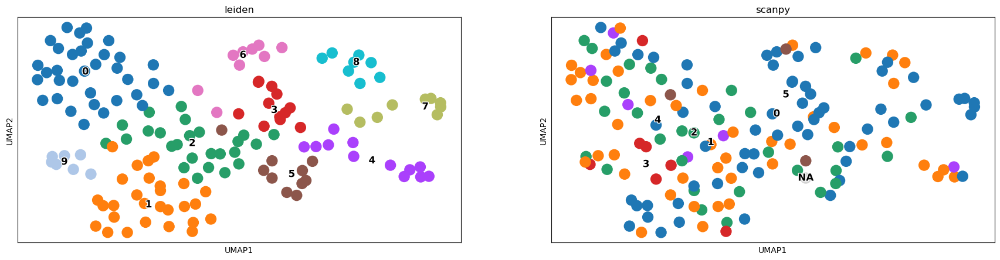

ARI: 0.20678875307374048  NMI: 0.3026569980218545


In [123]:
class H5ADataSet(Dataset):
    def __init__(self, adata):
        self.data = adata

    def __len__(self):
        return self.data.X.shape[0]

    def __getitem__(self, idx):
        x = csc_matrix(self.data.X[idx])[0].toarray()[0]
        x_tensor = x.astype(np.float32)
        return x_tensor

    
def load_data(adata):
    adj = adata.obsp["agg_knn_connectivity"]  # 154x154 for pcw4
    features = grouped_pcw4.obs.copy() #154x50
    return adj, features

dataset = grouped_pcw4
adj, features = load_data(dataset)

celldata = H5ADataSet(dataset)
print(celldata)
adata = grouped_pcw4

NUMGENS = grouped_pcw4.n_vars
#NUMGENS = 50
dimZ = 72
dimG = 128  # dim latent
BATCHSIZE = 154
LEARN_RATE = 1.0e-4
USE_CUDA = False
NUM_EPOCHS = 1000
nclusters = 10
cell_loader = DataLoader(celldata, batch_size=BATCHSIZE)
#cell_loader = DataLoader(features, batch_size=BATCHSIZE)

pyro.clear_param_store()

vae = VAE(NUMGENS, dimZ, dimG, nclusters, 0.5)
if USE_CUDA:
    vae.cuda()
adam_args ={"lr":LEARN_RATE}
optimizer = ClippedAdam(adam_args)

elbo = Trace_ELBO(strict_enumeration_warning=False)
svi = SVI(vae.model, vae.guide, optimizer, loss=elbo)

gc.collect()
torch.cuda.empty_cache()

train_elbo = []
test_elbo = []

adj = torch.FloatTensor(adj)


for epoch in range(NUM_EPOCHS):
    total_epoch_loss_train = train(svi, cell_loader, adj, use_cuda=USE_CUDA)
    train_elbo.append(-total_epoch_loss_train)
    print("[epoch %03d] average training loss: %.4f" % (epoch, total_epoch_loss_train))

torch.save(vae,'./vae.pkl')

TZ = []
for x in cell_loader:
    if USE_CUDA:
        x = x.cuda()
        adj = adj.cuda()
    z = vae.getZ(x,adj)
    zz = z.cpu().detach().numpy().tolist()
    TZ+=zz
TZ = np.array(TZ)
TZ = pd.DataFrame(TZ)
adata_z4 = anndata.AnnData(TZ)
#scanpy.pp.neighbors(adata_z)
sc.pp.neighbors(adata_z4, n_neighbors=10, n_pcs=50)
scanpy.tl.leiden(adata_z4,resolution=1)
sc.tl.paga(adata_z4)
sc.pl.paga(adata_z4, plot=False)
#scanpy.tl.umap(adata_z)
sc.tl.umap(adata_z4, init_pos='paga')

plt.rcParams["figure.figsize"] = (10,5)
adata_z4.obs['scanpy'] = adata.obs['leiden']
scanpy.pl.umap(adata_z4,color=['leiden','scanpy'], palette=scanpy.pl.palettes.default_20,  legend_loc = 'on data',legend_fontsize = 12,legend_fontoutline=2)
ARI = adjusted_rand_score(adata.obs['leiden'], adata_z4.obs['leiden'])
NMI = normalized_mutual_info_score(adata.obs['leiden'],adata_z4.obs['leiden'])
print("ARI: "+str(ARI)+"  "+"NMI: "+str(NMI))

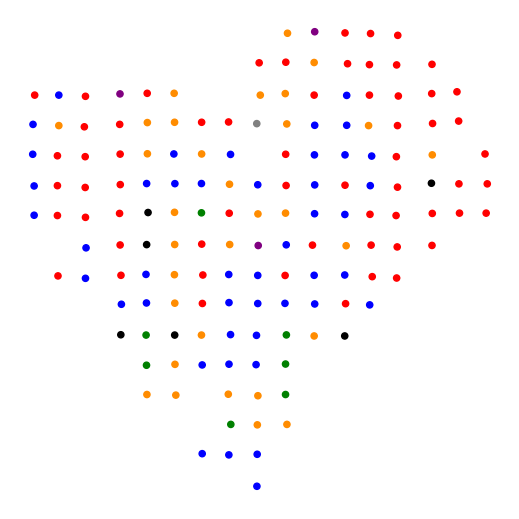

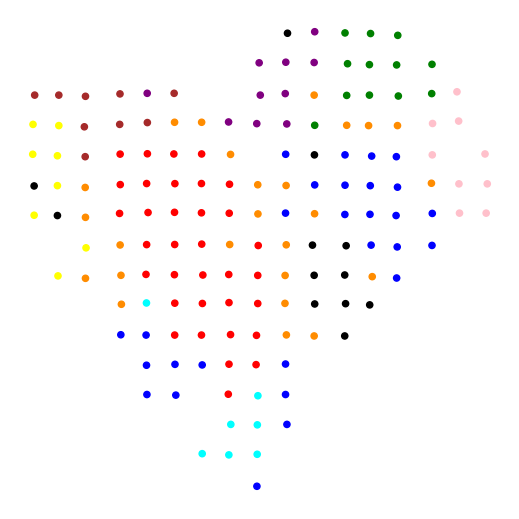

In [124]:
plt.rcParams["figure.figsize"] = (5,5)
#print(grouped_pcw4[1, 'ENSG00000000003.14'].X[0][0])
plot_clusters(adata_z4, grouped_pcw4, 'scanpy')
plot_clusters(adata_z4, grouped_pcw4, 'leiden')

In [125]:
#sc.settings.verbosity = 2  # reduce the verbosity
sc.pp.normalize_total(grouped_pcw4)
# find marker genes
sc.tl.rank_genes_groups(grouped_pcw4, 'leiden', method='wilcoxon', key_added='rank_genes_groups_scanpy')
#sc.pl.rank_genes_groups(grouped_pcw4, n_genes=25, sharey=False)

grouped_pcw4.obs["vae"] = adata_z4.obs['leiden']
sc.tl.rank_genes_groups(grouped_pcw4, 'vae', method='wilcoxon', key_added='rank_genes_groups_vae')
#sc.pl.rank_genes_groups(grouped_pcw4, n_genes=25, sharey=False)

# get top 100 ranked genes per cluster
top_markers_scanpy4 = pd.DataFrame(grouped_pcw4.uns['rank_genes_groups_scanpy']['names']).head(100)
top_markers_vae4 = pd.DataFrame(grouped_pcw4.uns['rank_genes_groups_vae']['names']).head(100)

# convert gene names
def fix(name):
    return name.split(".")[0]
fixed_markers_scanpy = top_markers_scanpy4.apply(np.vectorize(fix))
fixed_markers_vae = top_markers_vae4.apply(np.vectorize(fix))

# scanpy markers
for column in fixed_markers_scanpy:
    out = mg.querymany(fixed_markers_scanpy[column], scopes="ensemblgene", fields="symbol", species='human', as_dataframe=True)
    out["ensemblgene"] = out.index.to_series()
    #out["symbol"].fillna(out["ensemblgene"], inplace=True)
    print(out.head(5))
    top_markers_scanpy4[column+"_symbol"] = out["symbol"].values
    #top_markers_scanpy4[column+"_spatial score"] = grouped_pcw4.var["spatial_score"].loc[top_markers_scanpy4[column]].values
    
# vae markers
for column in fixed_markers_vae:
    out = mg.querymany(fixed_markers_vae[column], scopes="ensemblgene", fields="symbol", species='human', as_dataframe=True)
    out["ensemblgene"] = out.index.to_series()
    #out["symbol"].fillna(out["ensemblgene"], inplace=True)
    print(out.head(5))
    top_markers_vae4[column+"_symbol"] = out["symbol"].values
    #top_markers_vae4[column+"_spatial score"] = grouped_pcw4.var["spatial_score"].loc[top_markers_vae4[column]].values

    
# output
top_markers_scanpy4.to_csv("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/pcw4_scanpy_markers.csv")
top_markers_vae4.to_csv("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/pcw4_vae_markers.csv")

normalizing counts per cell
    finished (0:00:00)
ranking genes
    finished (0:00:00)
ranking genes
    finished (0:00:00)
querying 1-100...done.
Finished.
                             _id     _score    symbol      ensemblgene
query                                                                 
ENSG00000213750           286150   8.242923   RPS2P33  ENSG00000213750
ENSG00000234080           343184   8.242923   RPS2P11  ENSG00000234080
ENSG00000227437           646119   8.242923    RPS8P4  ENSG00000227437
ENSG00000213058  ENSG00000213058  25.553060       NaN  ENSG00000213058
ENSG00000233287           442723   8.242923  RPL27P11  ENSG00000233287
querying 1-100...done.
Finished.
                  _id     _score  symbol      ensemblgene
query                                                    
ENSG00000140416  7168  25.553060    TPM1  ENSG00000140416
ENSG00000127184  1350  25.553060   COX7C  ENSG00000127184
ENSG00000105372  6223  25.553060   RPS19  ENSG00000105372
ENSG00000134571  4607 

                    0                   1                   2  \
0  ENSG00000140264.19  ENSG00000125503.12  ENSG00000104332.11   
1  ENSG00000065978.18  ENSG00000105223.19  ENSG00000167088.10   
2  ENSG00000164919.10  ENSG00000121022.13  ENSG00000129292.20   
3   ENSG00000219133.2  ENSG00000125734.14  ENSG00000103197.16   
4  ENSG00000134825.14  ENSG00000143374.15  ENSG00000107262.17   

                    3                   4                   5  \
0   ENSG00000227437.1  ENSG00000054148.17  ENSG00000104960.15   
1   ENSG00000236762.1  ENSG00000068137.14  ENSG00000173915.13   
2  ENSG00000107796.13   ENSG00000135940.6  ENSG00000006015.17   
3  ENSG00000120963.11  ENSG00000132463.13  ENSG00000152082.13   
4  ENSG00000168887.10  ENSG00000124006.14  ENSG00000125835.18   

                    6                   7                   8  \
0  ENSG00000205629.11  ENSG00000101346.12  ENSG00000167995.15   
1   ENSG00000213058.3  ENSG00000157927.16  ENSG00000178741.11   
2  ENSG00000135316.17  

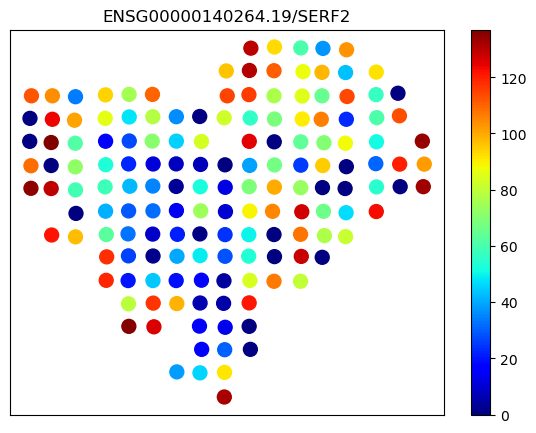

YBX1


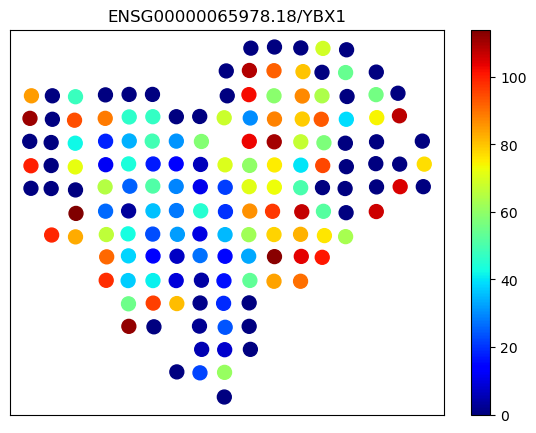

COX6C


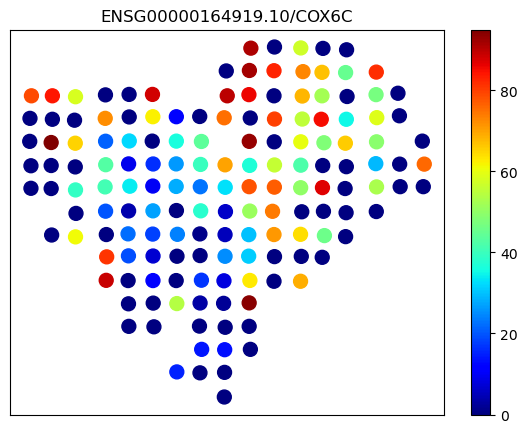

RPL21P19


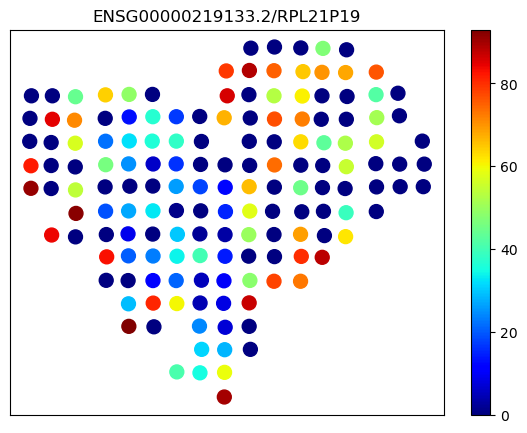

TMEM258


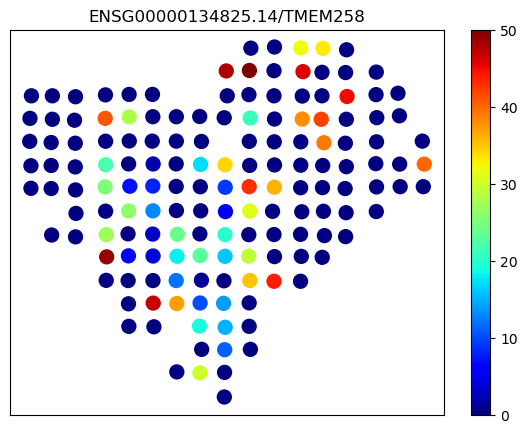

cluster 1
PPP1R12C


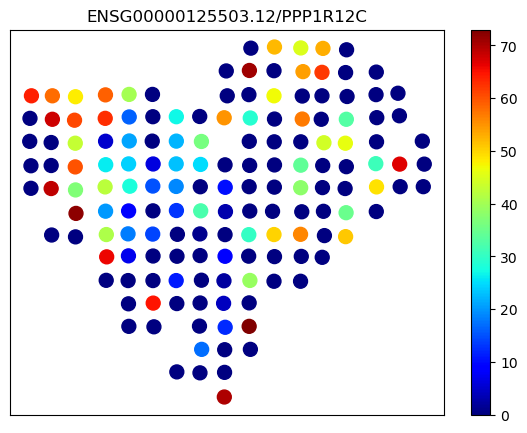

PLD3


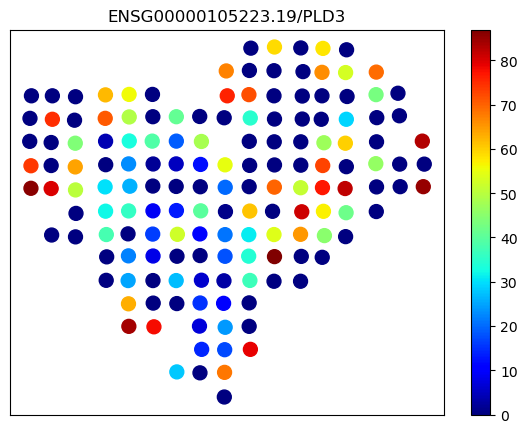

COPS5


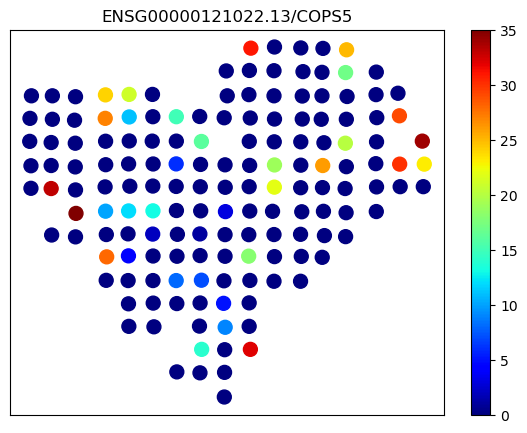

GPR108


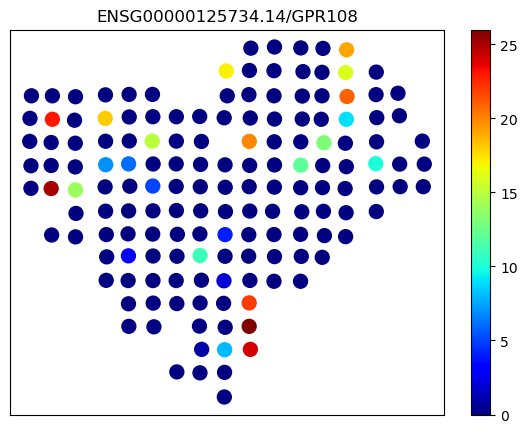

TARS2


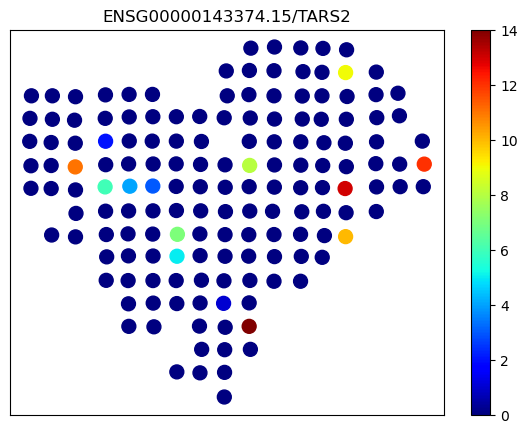

cluster 2
SFRP1


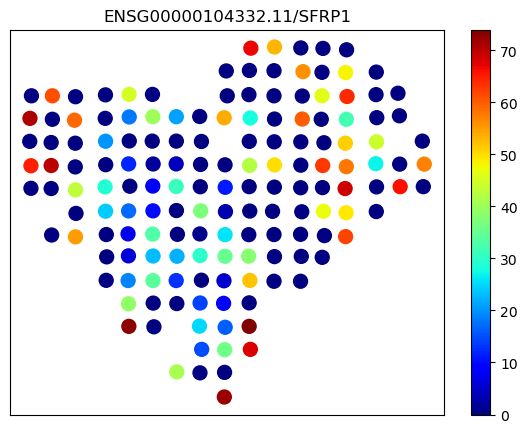

SNRPD1


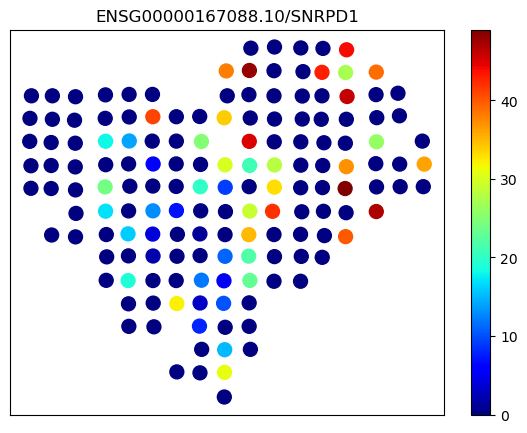

PHF20L1


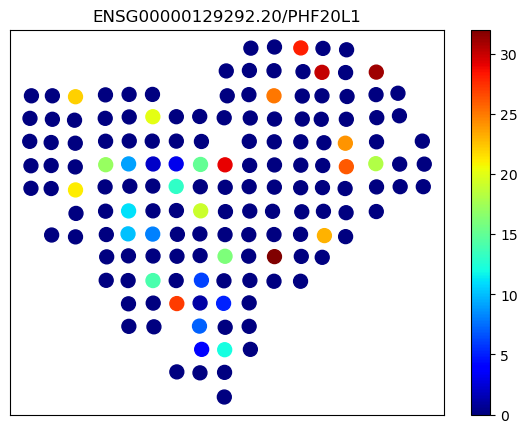

TSC2


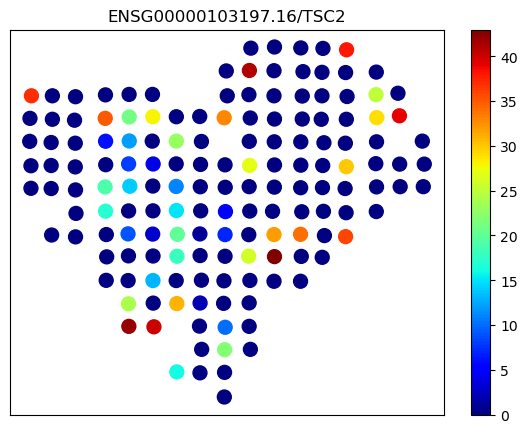

BAG1


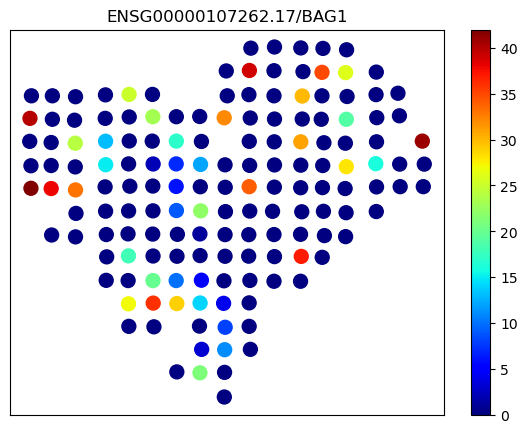

cluster 3
RPS8P4


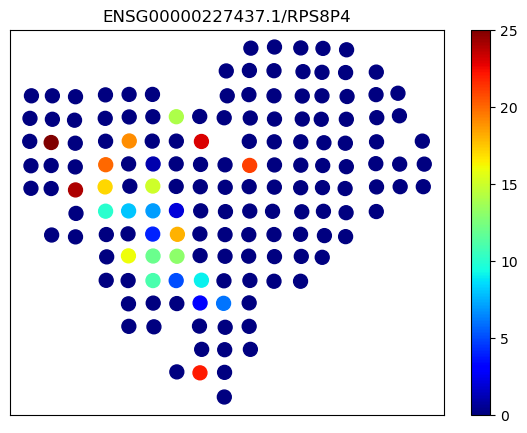

RPL19P16


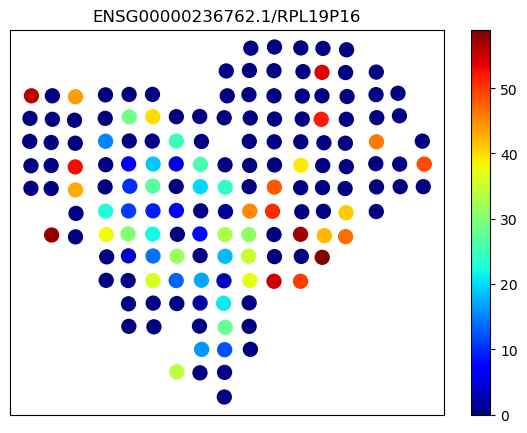

ACTA2


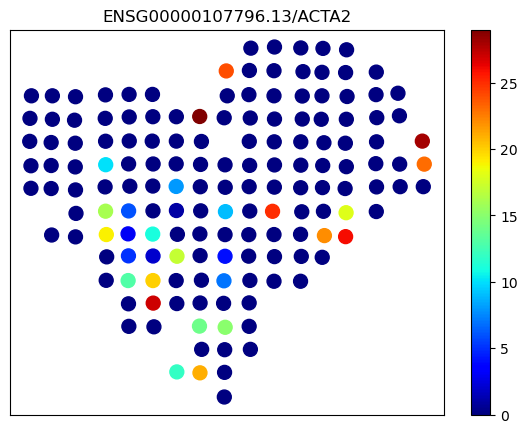

ZNF706


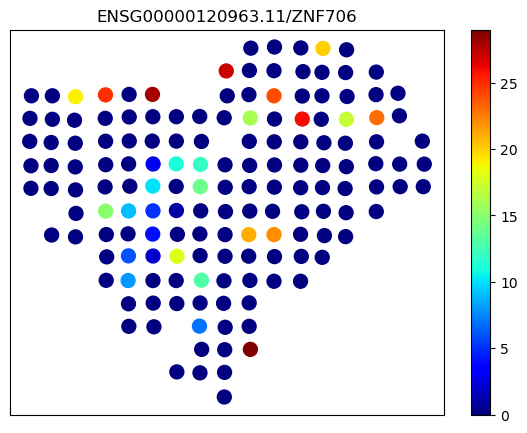

C2orf68


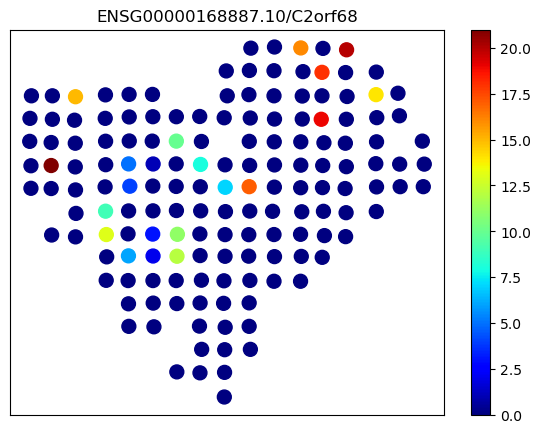

cluster 4
PHPT1


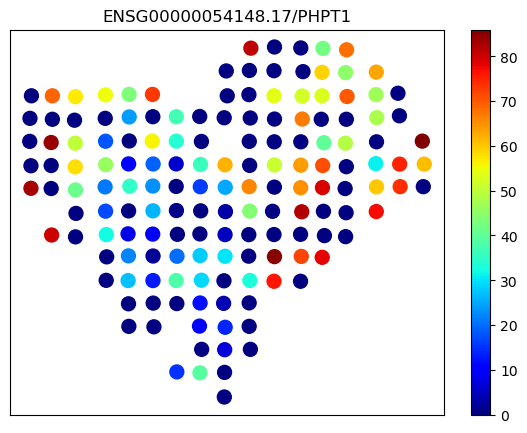

PLEKHH3


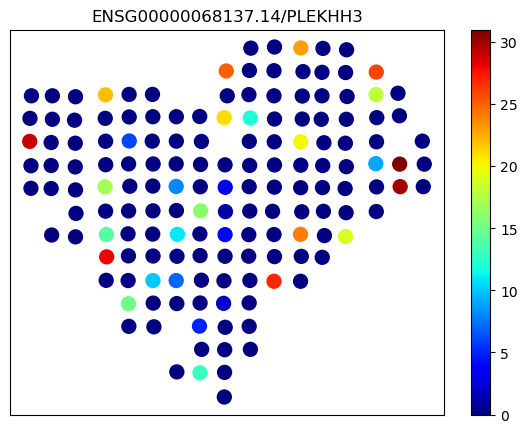

COX5B


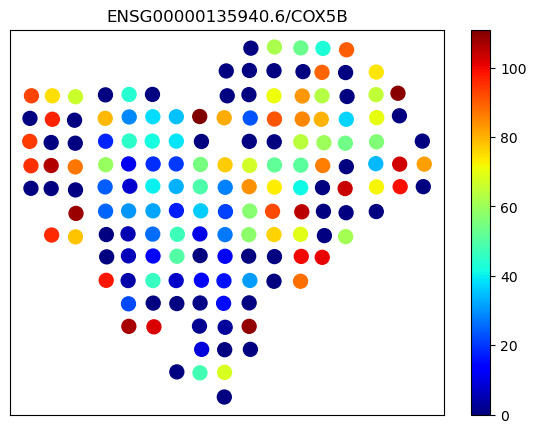

GRSF1


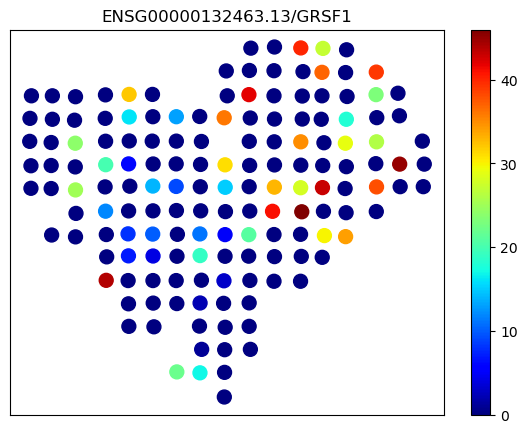

OBSL1


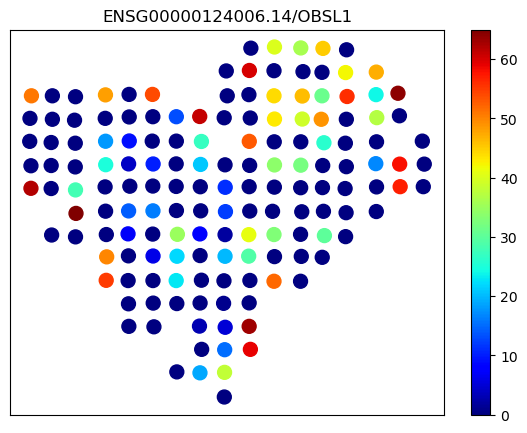

cluster 5
PTOV1


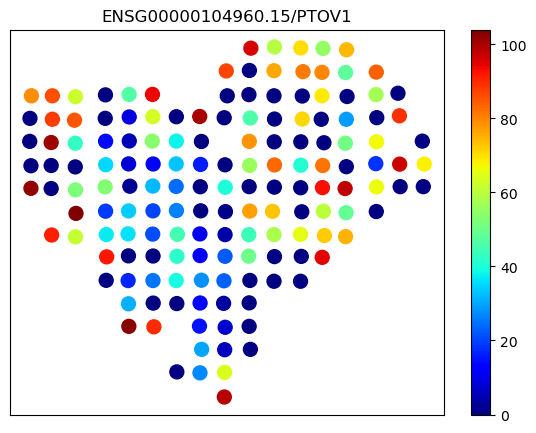

ATP5MK


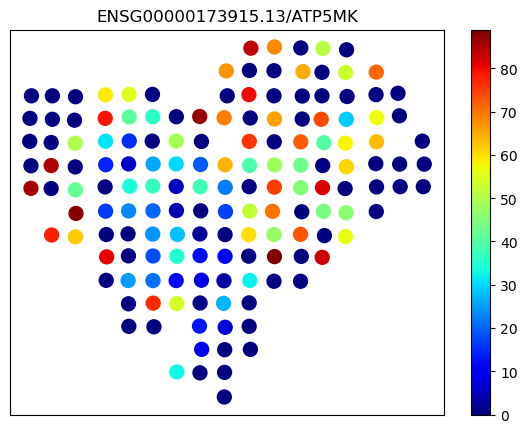

REX1BD


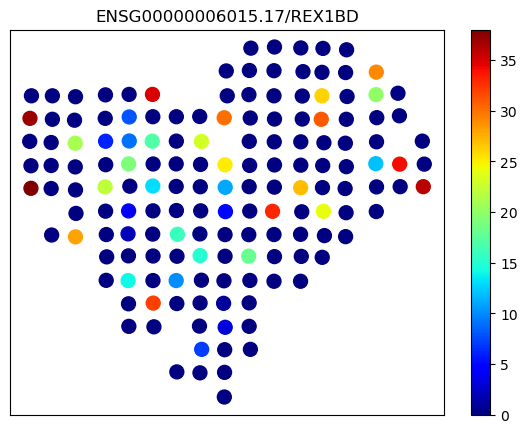

MZT2B


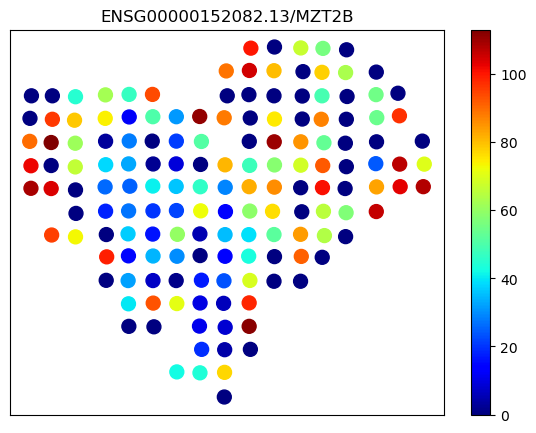

SNRPB


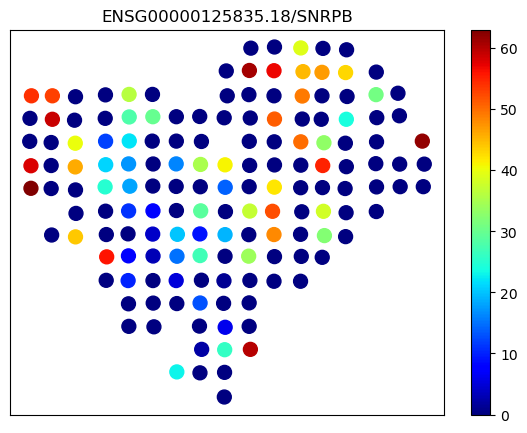

In [126]:
plt.rcParams["figure.figsize"] = (7,5)
print(top_markers_vae4.head(5))

for cluster in top_markers_vae4.iloc[:, :6]:
    print("cluster " + cluster)
    for num in range(5):
        plot_genemap(grouped_pcw4, top_markers_vae4.iloc[num, int(cluster)])


[epoch 000] average training loss: 7576439806271.0742
[epoch 001] average training loss: 30155954442467.8789
[epoch 002] average training loss: 19666314139.0957
[epoch 003] average training loss: 23831933521.2498
[epoch 004] average training loss: 855497283.3492
[epoch 005] average training loss: 144022430.1288
[epoch 006] average training loss: 12454022.2843
[epoch 007] average training loss: 2774117.1478
[epoch 008] average training loss: 2881379.5529
[epoch 009] average training loss: 529704.9737
[epoch 010] average training loss: 925063.6337
[epoch 011] average training loss: 130126.5279
[epoch 012] average training loss: 56440.8530
[epoch 013] average training loss: 43410.6495
[epoch 014] average training loss: 35509.7025
[epoch 015] average training loss: 31688.7474
[epoch 016] average training loss: 28365.3544
[epoch 017] average training loss: 26017.0958
[epoch 018] average training loss: 23786.7108
[epoch 019] average training loss: 21689.5279
[epoch 020] average training loss

/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_1675/3849850183.py:73: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_z6 = anndata.AnnData(TZ)
/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


    finished (0:00:00)
computing UMAP
    finished (0:00:02)


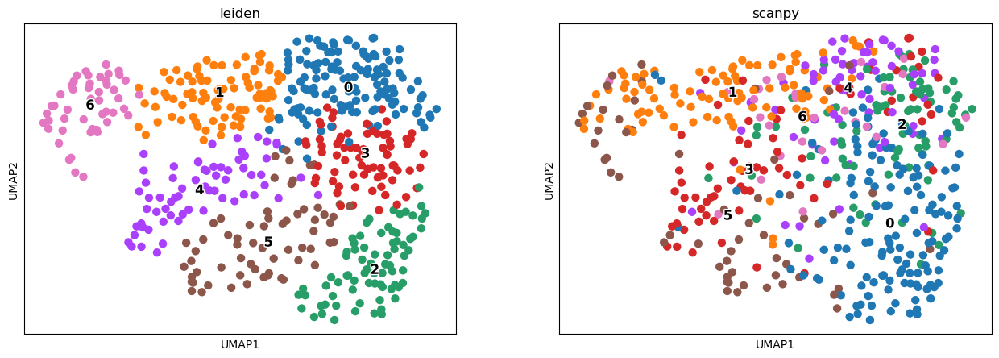

ARI: 0.24581724978949426  NMI: 0.33247453893457907


In [127]:
class H5ADataSet(Dataset):
    def __init__(self, adata):
        self.data = adata

    def __len__(self):
        return self.data.X.shape[0]

    def __getitem__(self, idx):
        x = csc_matrix(self.data.X[idx])[0].toarray()[0]
        x_tensor = x.astype(np.float32)
        return x_tensor

    
def load_data(adata):
    adj = adata.obsp["agg_knn_connectivity"]  # 154x154 for pcw4
    features = grouped_pcw4.obsm['X_pca'].copy() #154x50
    return adj, features

dataset = grouped_pcw6
adj, features = load_data(dataset)

celldata = H5ADataSet(dataset)
adata = grouped_pcw6

NUMGENS = grouped_pcw6.n_vars
dimZ = 72
dimG = 128
BATCHSIZE = 539
LEARN_RATE = 1.0e-4
USE_CUDA = False
NUM_EPOCHS = 1000
nclusters = 20
cell_loader = DataLoader(celldata, batch_size=BATCHSIZE)


pyro.clear_param_store()

vae = VAE(NUMGENS, dimZ, dimG, nclusters, 0.5)
if USE_CUDA:
    vae.cuda()
adam_args ={"lr":LEARN_RATE}
optimizer = ClippedAdam(adam_args)

elbo = Trace_ELBO(strict_enumeration_warning=False)
svi = SVI(vae.model, vae.guide, optimizer, loss=elbo)

gc.collect()
torch.cuda.empty_cache()

train_elbo = []
test_elbo = []

adj = torch.FloatTensor(adj)


for epoch in range(NUM_EPOCHS):
    total_epoch_loss_train = train(svi, cell_loader,adj, use_cuda=USE_CUDA)
    train_elbo.append(-total_epoch_loss_train)
    print("[epoch %03d] average training loss: %.4f" % (epoch, total_epoch_loss_train))

torch.save(vae,'./vae.pkl')

TZ = []
for x in cell_loader:
    if USE_CUDA:
        x = x.cuda()
        adj = adj.cuda()
    z = vae.getZ(x,adj)
    zz = z.cpu().detach().numpy().tolist()
    TZ+=zz
TZ = np.array(TZ)
TZ = pd.DataFrame(TZ)
adata_z6 = anndata.AnnData(TZ)
#scanpy.pp.neighbors(adata_z)
sc.pp.neighbors(adata_z6, n_neighbors=10, n_pcs=50)
scanpy.tl.leiden(adata_z6,resolution=1)
#sc.tl.paga(adata_z)
#sc.pl.paga(adata_z, plot=False)
scanpy.tl.umap(adata_z6)
#sc.tl.umap(adata_z, init_pos='paga')

adata_z6.obs['scanpy'] = list(adata.obs['leiden'])
scanpy.pl.umap(adata_z6,color=['leiden','scanpy'], palette=scanpy.pl.palettes.default_20,  legend_loc = 'on data',legend_fontsize = 12,legend_fontoutline=2)
ARI = adjusted_rand_score(adata.obs['leiden'], adata_z6.obs['leiden'])
NMI = normalized_mutual_info_score(adata.obs['leiden'],adata_z6.obs['leiden'])
print("ARI: "+str(ARI)+"  "+"NMI: "+str(NMI))

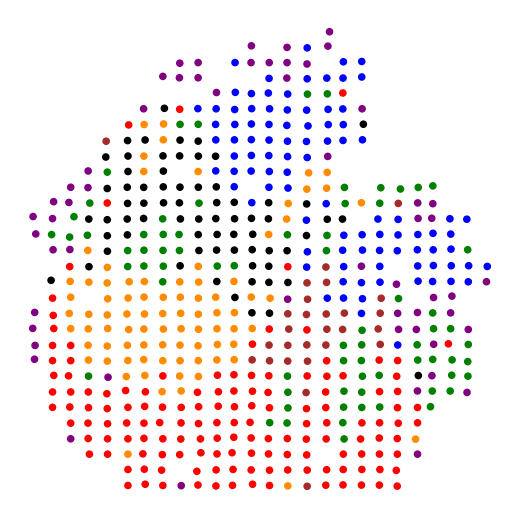

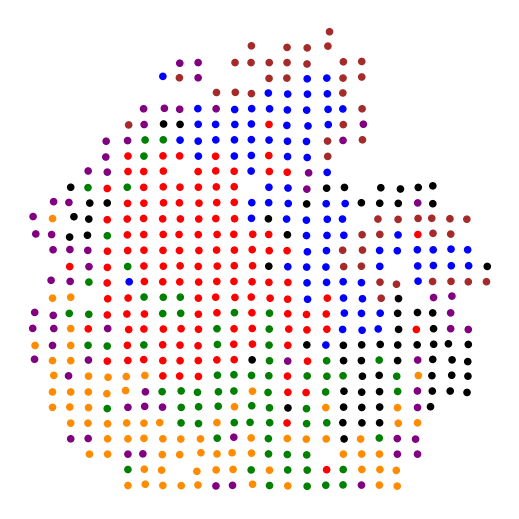

In [128]:
plt.rcParams["figure.figsize"] = (5,5)
plot_clusters(adata_z6, grouped_pcw6, 'scanpy')
plot_clusters(adata_z6, grouped_pcw6, 'leiden')

In [60]:
#sc.settings.verbosity = 2  # reduce the verbosity
sc.pp.normalize_total(grouped_pcw6)
# find marker genes
sc.tl.rank_genes_groups(grouped_pcw6, 'leiden', method='wilcoxon', key_added='rank_genes_groups_scanpy')
#sc.pl.rank_genes_groups(grouped_pcw6, n_genes=25, sharey=False)

grouped_pcw6.obs["vae"] = adata_z6.obs['leiden']
sc.tl.rank_genes_groups(grouped_pcw6, 'vae', method='wilcoxon', key_added='rank_genes_groups_vae')
#sc.pl.rank_genes_groups(grouped_pcw6, n_genes=25, sharey=False)

# get top 100 ranked genes per cluster
top_markers_scanpy6 = pd.DataFrame(grouped_pcw6.uns['rank_genes_groups_scanpy']['names']).head(100)
top_markers_vae6 = pd.DataFrame(grouped_pcw6.uns['rank_genes_groups_vae']['names']).head(100)

# convert gene names
def fix(name):
    return name.split(".")[0]
fixed_markers_scanpy = top_markers_scanpy6.apply(np.vectorize(fix))
fixed_markers_vae = top_markers_vae6.apply(np.vectorize(fix))

for column in fixed_markers_scanpy:
    out = mg.querymany(fixed_markers_scanpy[column], scopes="ensemblgene", fields="symbol", species='human', as_dataframe=True)
    out["ensemblgene"] = out.index.to_series()
    #out["symbol"].fillna(out["ensemblgene"], inplace=True)
    print(out.head(5))
    top_markers_scanpy6[column+"_symbol"] = out["symbol"].values
    #top_markers_scanpy6[column+"_spatial score"] = grouped_pcw6.var["spatial_score"].loc[top_markers_scanpy6[column]].values
    
for column in fixed_markers_vae:
    out = mg.querymany(fixed_markers_vae[column], scopes="ensemblgene", fields="symbol", species='human', as_dataframe=True)
    out["ensemblgene"] = out.index.to_series()
    #out["symbol"].fillna(out["ensemblgene"], inplace=True)
    print(out.head(5))
    top_markers_vae6[column+"_symbol"] = out["symbol"].values
    #top_markers_vae6[column+"_spatial score"] = grouped_pcw6.var["spatial_score"].loc[top_markers_vae6[column]].values
    
# output
top_markers_scanpy6.to_csv("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/pcw6_scanpy_markers.csv")
top_markers_vae6.to_csv("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/pcw6_vae_markers.csv")

normalizing counts per cell
    finished (0:00:00)
ranking genes


KeyError: 'base'

                    0                   1                   2  \
0  ENSG00000188343.12   ENSG00000241685.8   ENSG00000265972.5   
1   ENSG00000146250.6  ENSG00000111237.18  ENSG00000132780.16   
2  ENSG00000180776.15  ENSG00000174099.10  ENSG00000101182.14   
3  ENSG00000188153.12  ENSG00000111799.20  ENSG00000196565.12   
4  ENSG00000091164.12  ENSG00000113140.10   ENSG00000131143.8   

                    3                   4                   5  \
0  ENSG00000111665.11  ENSG00000100129.17   ENSG00000206172.8   
1  ENSG00000173269.13  ENSG00000006007.11   ENSG00000184983.9   
2  ENSG00000184752.12   ENSG00000172399.5  ENSG00000175206.10   
3  ENSG00000142910.15  ENSG00000156709.13  ENSG00000196565.12   
4  ENSG00000115307.16  ENSG00000118418.14   ENSG00000213931.5   

                    6 0_symbol 1_symbol 2_symbol 3_symbol 4_symbol 5_symbol  \
0  ENSG00000185298.12   CIBAR1   ARPC1A    TXNIP    CDCA3    EIF3L     HBA1   
1  ENSG00000221823.10   PRSS35    VPS29     NASP    MMRN2   

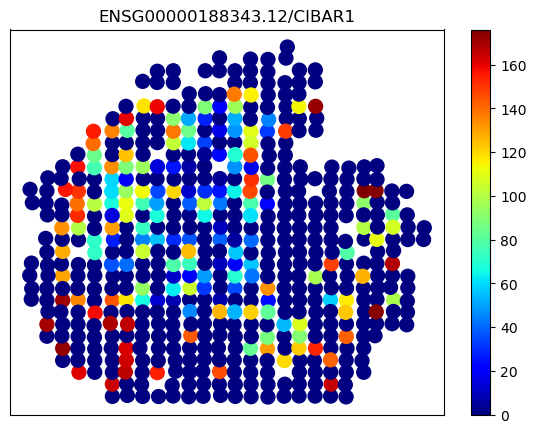

PRSS35


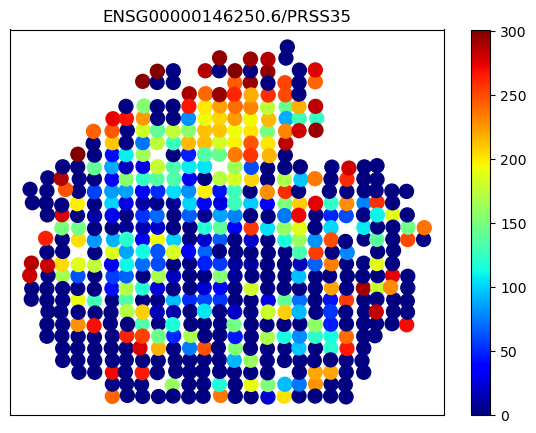

ZDHHC20


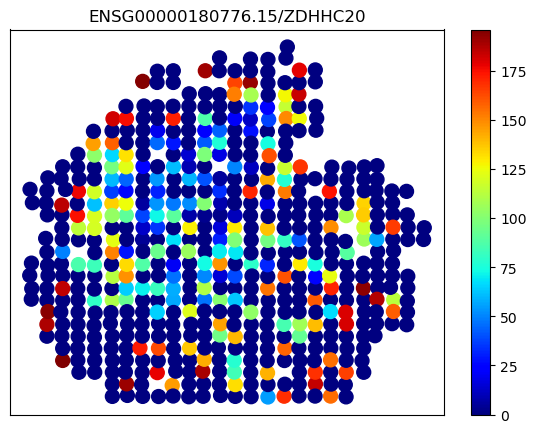

COL4A5


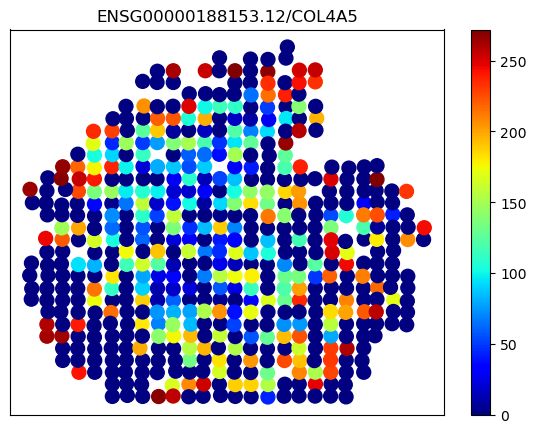

TXNL1


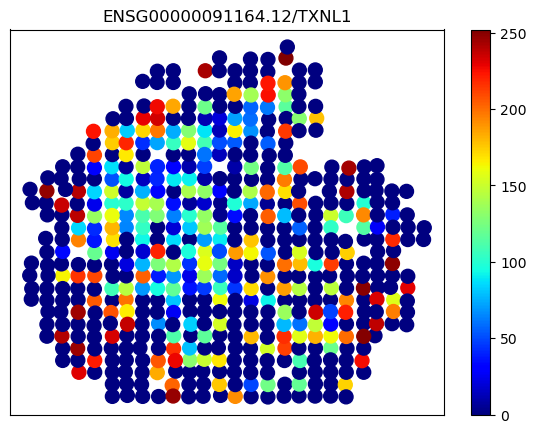

cluster 1
ARPC1A


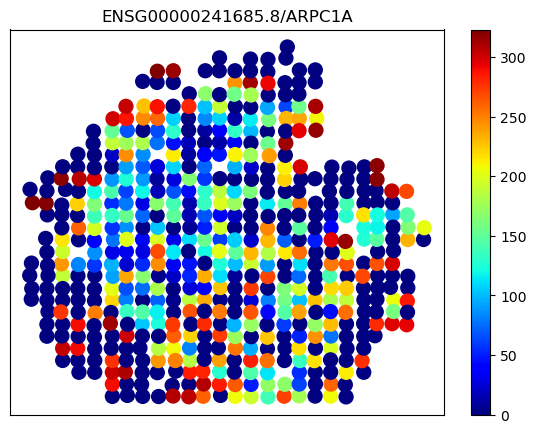

VPS29


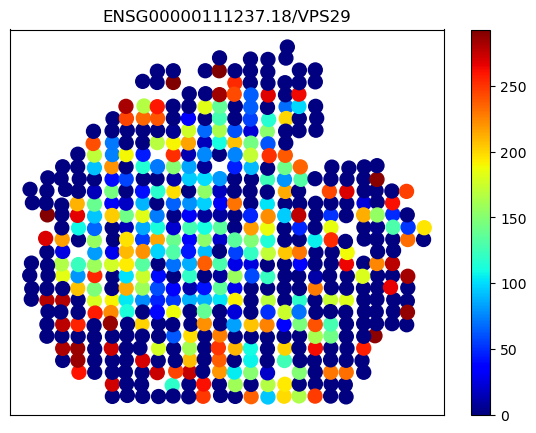

MSRB3


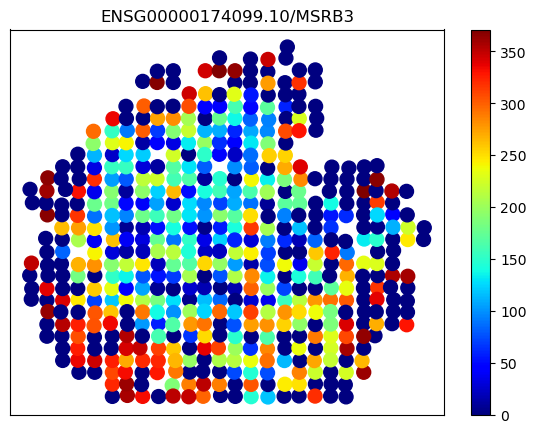

COL12A1


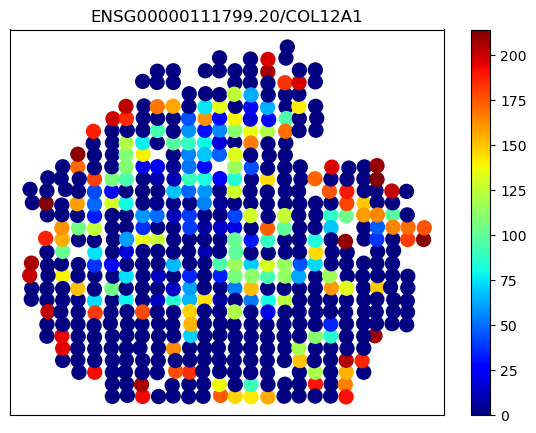

SPARC


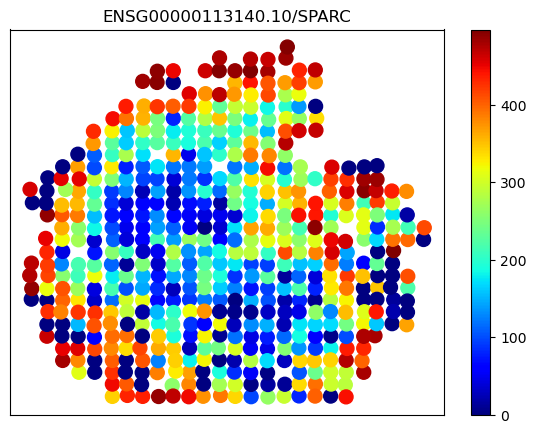

cluster 2
TXNIP


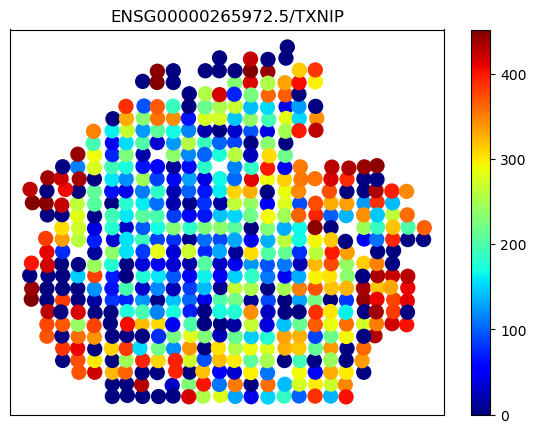

NASP


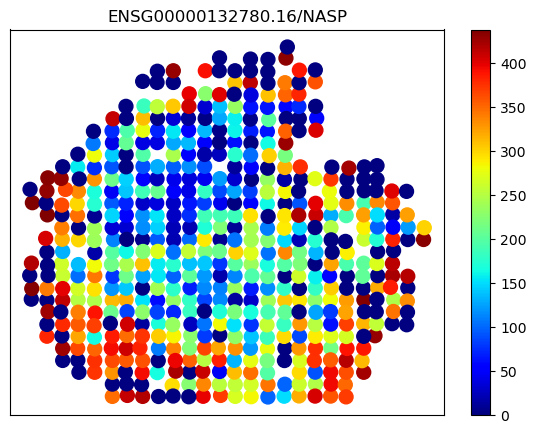

PSMA7


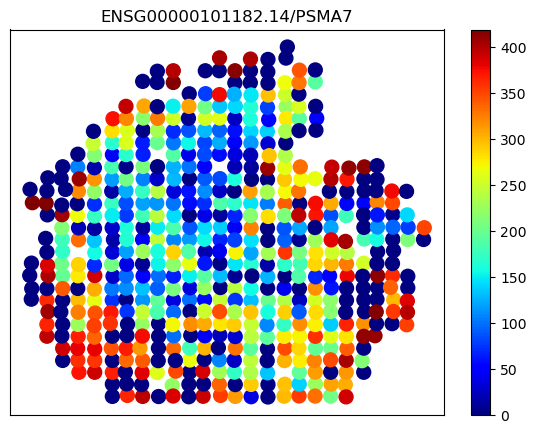

HBG2


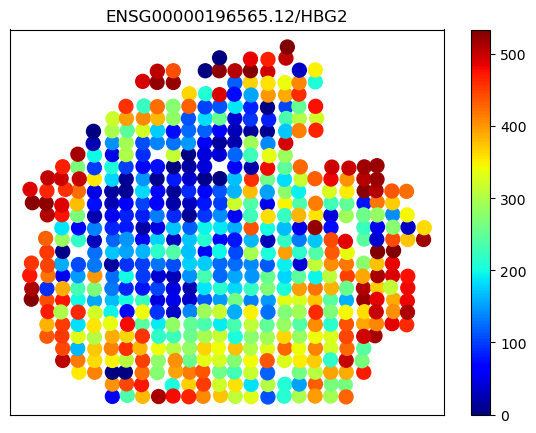

COX4I1


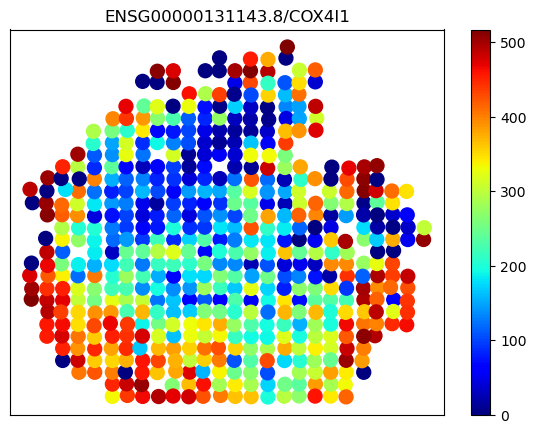

cluster 3
CDCA3


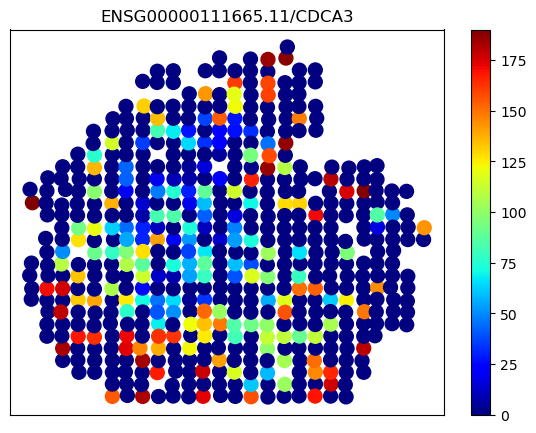

MMRN2


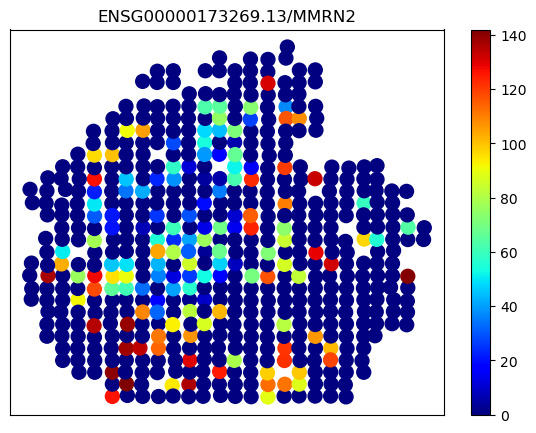

NDUFA12


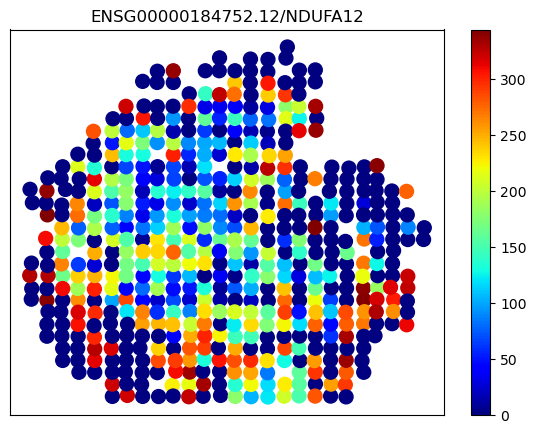

TINAGL1


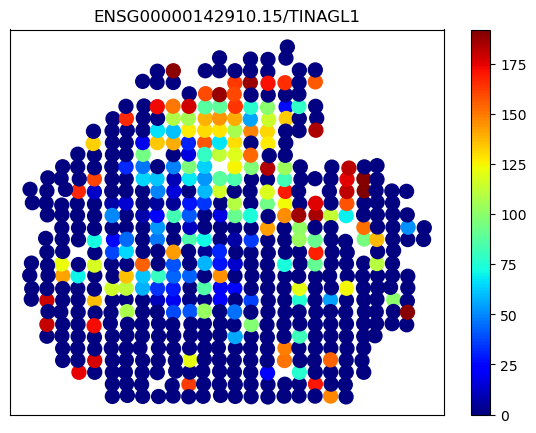

AUP1


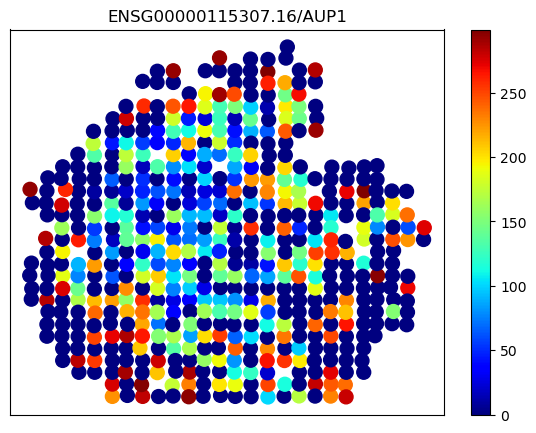

cluster 4
EIF3L


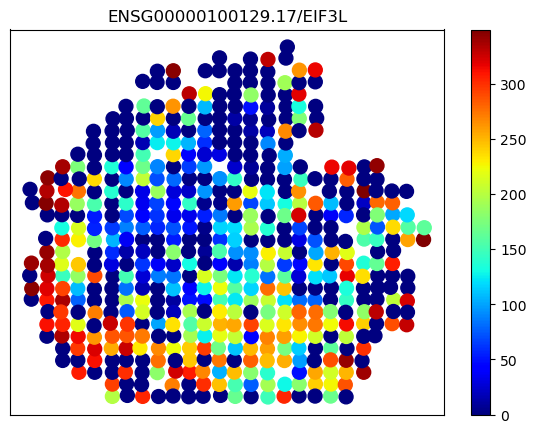

GDE1


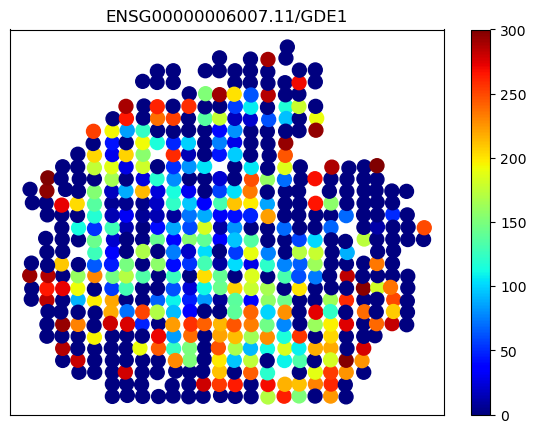

MYOZ2


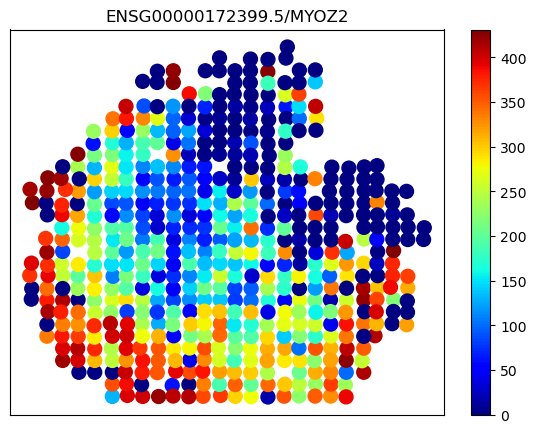

AIFM1


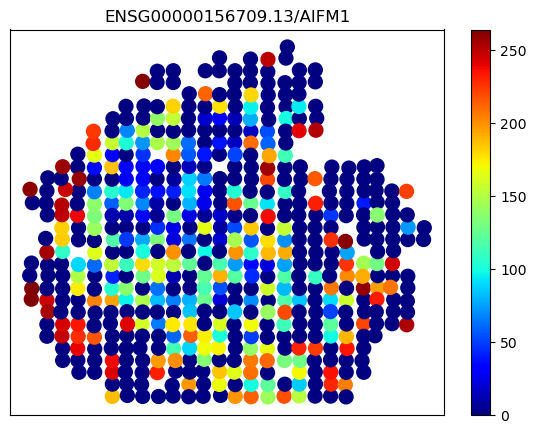

HMGN3


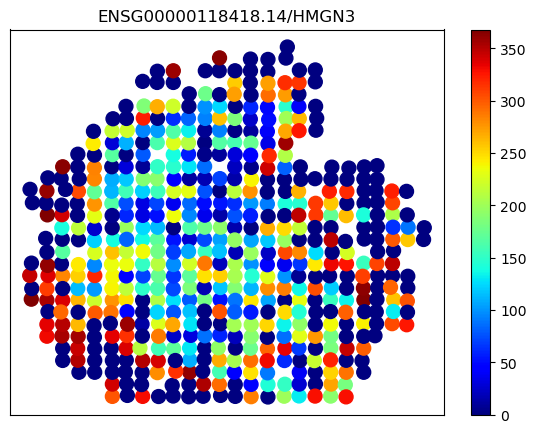

cluster 5
HBA1


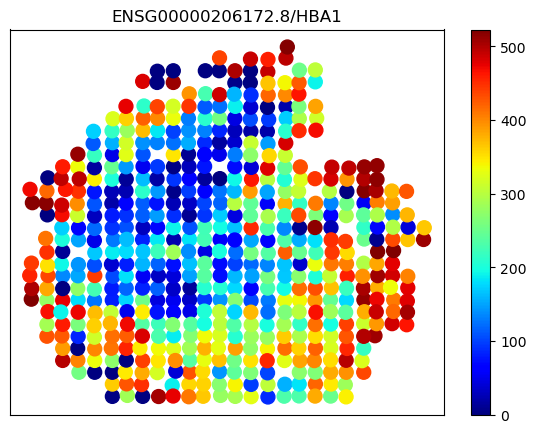

NDUFA6


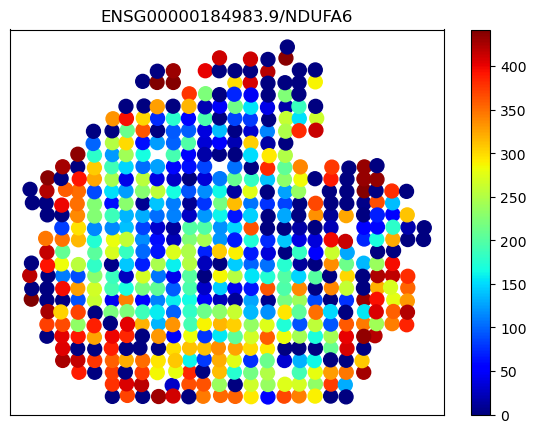

NPPA


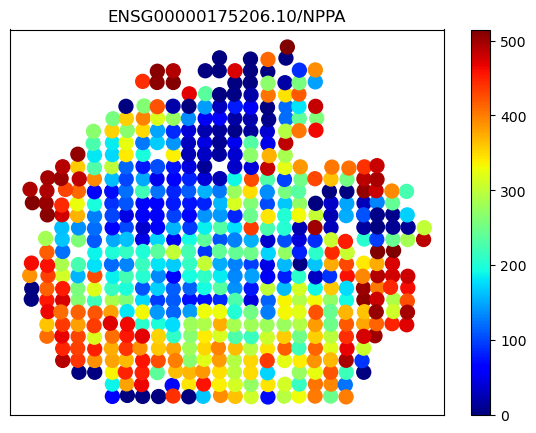

HBG2


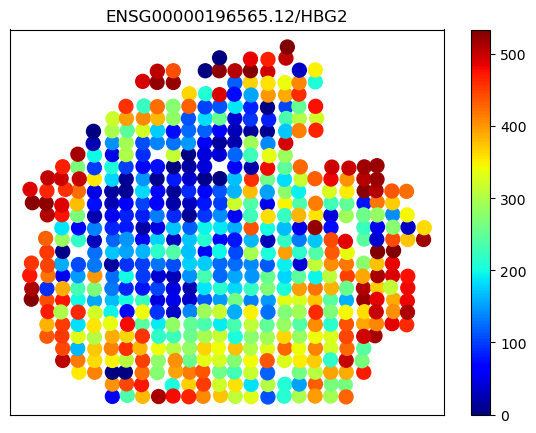

HBE1


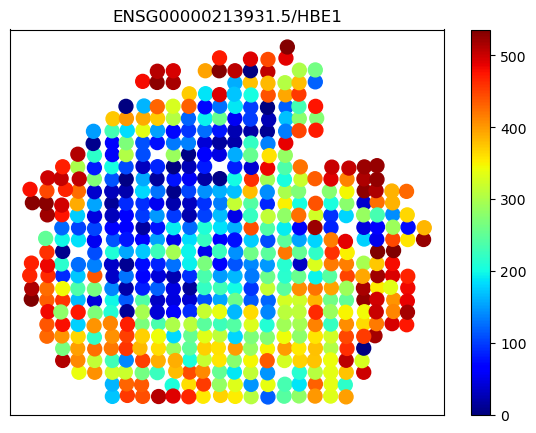

cluster 6
CCDC137


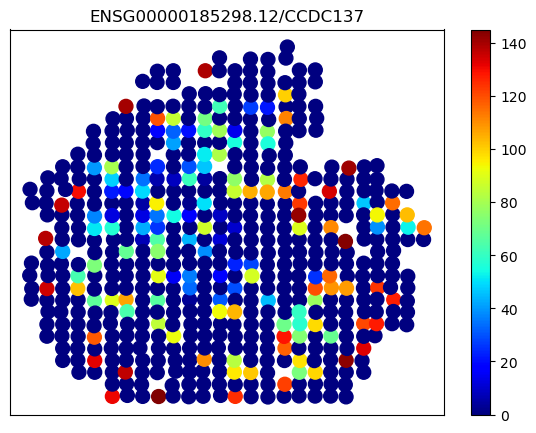

PPP3R1


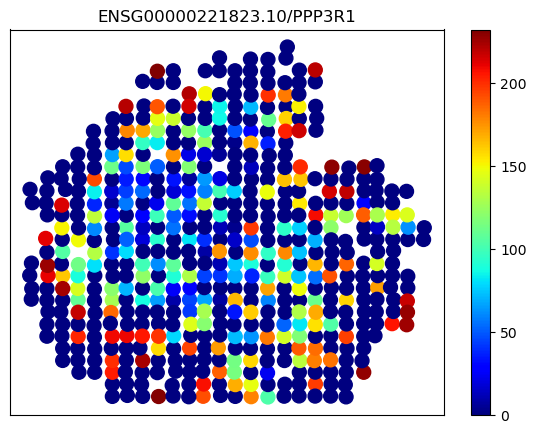

AMPH


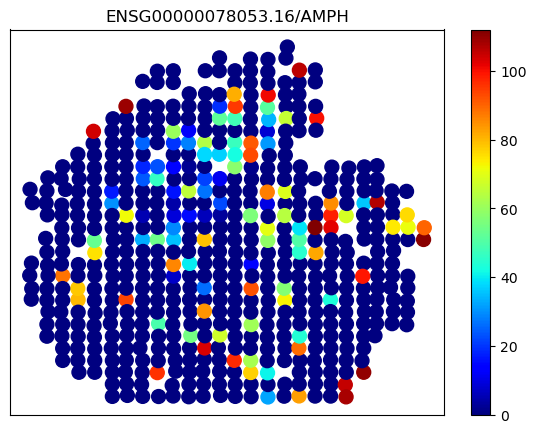

HAGH


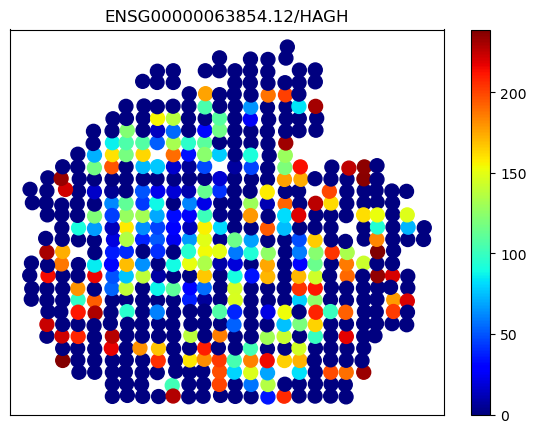

DHTKD1


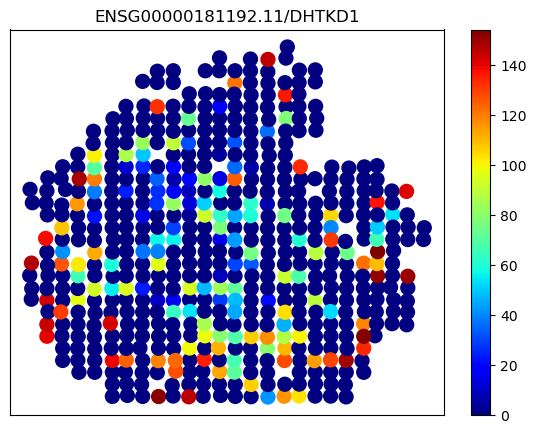

cluster 0_symbol


ValueError: invalid literal for int() with base 10: '0_symbol'

In [130]:
print(top_markers_vae6.head(5))
plt.rcParams["figure.figsize"] = (7,5)

for cluster in top_markers_vae6.iloc[:, :8]:
    print("cluster " + cluster)
    for num in range(5):
        plot_genemap(grouped_pcw6, top_markers_vae6.iloc[num, int(cluster)])


[epoch 000] average training loss: 358770459.5272
[epoch 001] average training loss: 29642734.8373
[epoch 002] average training loss: 580392.4960
[epoch 003] average training loss: 328275.4444
[epoch 004] average training loss: 130309.1589
[epoch 005] average training loss: 82965.0423
[epoch 006] average training loss: 37521.9597
[epoch 007] average training loss: 28636.5242
[epoch 008] average training loss: 24683.4987
[epoch 009] average training loss: 22257.6354
[epoch 010] average training loss: 20180.8655
[epoch 011] average training loss: 18459.5086
[epoch 012] average training loss: 17309.0891
[epoch 013] average training loss: 16306.9646
[epoch 014] average training loss: 15216.6717
[epoch 015] average training loss: 14530.9574
[epoch 016] average training loss: 13783.0587
[epoch 017] average training loss: 13130.3213
[epoch 018] average training loss: 12534.7968
[epoch 019] average training loss: 12080.1999
[epoch 020] average training loss: 11548.8764
[epoch 021] average trai

/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_1675/4093510013.py:74: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_z9 = anndata.AnnData(TZ)
/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


    finished (0:00:01)


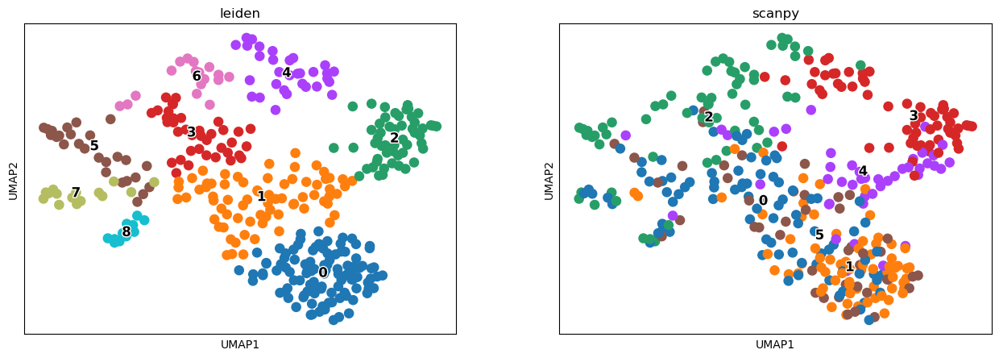

ARI: 0.23771843031990622  NMI: 0.3826277531591342


In [131]:
class H5ADataSet(Dataset):
    def __init__(self, adata):
        self.data = adata

    def __len__(self):
        return self.data.X.shape[0]

    def __getitem__(self, idx):
        x = csc_matrix(self.data.X[idx])[0].toarray()[0]
        x_tensor = x.astype(np.float32)
        return x_tensor

    
def load_data(adata):
    adj = adata.obsp["agg_knn_connectivity"]  # 154x154 for pcw4
    features = grouped_pcw4.obsm['X_pca'].copy() #154x50
    return adj, features

dataset = grouped_pcw9
adj, features = load_data(dataset)

celldata = H5ADataSet(dataset)
adata = grouped_pcw9

NUMGENS = grouped_pcw4.n_vars
#NUMGENS = 50
dimZ = 72
dimG = 128
BATCHSIZE = 366
LEARN_RATE = 1.0e-4
USE_CUDA = False
NUM_EPOCHS = 1000
nclusters = 10
cell_loader = DataLoader(celldata, batch_size=BATCHSIZE)


pyro.clear_param_store()

vae = VAE(NUMGENS, dimZ, dimG,nclusters, 0.5)
if USE_CUDA:
    vae.cuda()
adam_args ={"lr":LEARN_RATE}
optimizer = ClippedAdam(adam_args)

elbo = Trace_ELBO(strict_enumeration_warning=False)
svi = SVI(vae.model, vae.guide, optimizer, loss=elbo)

gc.collect()
torch.cuda.empty_cache()

train_elbo = []
test_elbo = []

adj = torch.FloatTensor(adj)


for epoch in range(NUM_EPOCHS):
    total_epoch_loss_train = train(svi, cell_loader,adj, use_cuda=USE_CUDA)
    train_elbo.append(-total_epoch_loss_train)
    print("[epoch %03d] average training loss: %.4f" % (epoch, total_epoch_loss_train))

torch.save(vae,'./vae.pkl')

TZ = []
for x in cell_loader:
    if USE_CUDA:
        x = x.cuda()
        adj = adj.cuda()
    z = vae.getZ(x,adj)
    zz = z.cpu().detach().numpy().tolist()
    TZ+=zz
TZ = np.array(TZ)
TZ = pd.DataFrame(TZ)
adata_z9 = anndata.AnnData(TZ)
#scanpy.pp.neighbors(adata_z)
sc.pp.neighbors(adata_z9, n_neighbors=10, n_pcs=50)
scanpy.tl.leiden(adata_z9,resolution=1)
#sc.tl.paga(adata_z)
#sc.pl.paga(adata_z, plot=False)
scanpy.tl.umap(adata_z9)
#sc.tl.umap(adata_z, init_pos='paga')

adata_z9.obs['scanpy'] = list(adata.obs['leiden'])
scanpy.pl.umap(adata_z9,color=['leiden','scanpy'], palette=scanpy.pl.palettes.default_20,  legend_loc = 'on data',legend_fontsize = 12,legend_fontoutline=2)
ARI = adjusted_rand_score(adata.obs['leiden'], adata_z9.obs['leiden'])
NMI = normalized_mutual_info_score(adata.obs['leiden'],adata_z9.obs['leiden'])
print("ARI: "+str(ARI)+"  "+"NMI: "+str(NMI))

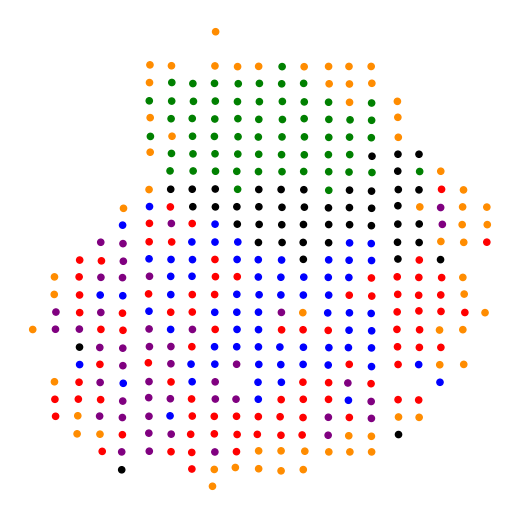

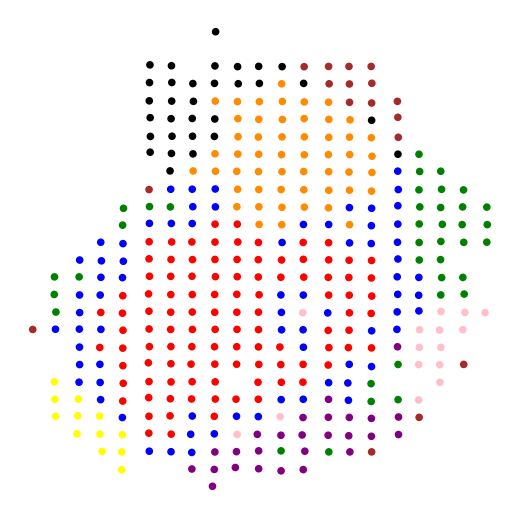

In [132]:
plt.rcParams["figure.figsize"] = (5,5)
plot_clusters(adata_z9, grouped_pcw9, 'scanpy')
plot_clusters(adata_z9, grouped_pcw9, 'leiden')

In [59]:
#sc.settings.verbosity = 2  # reduce the verbosity
print(grouped_pcw9.uns['log1p'])
sc.pp.normalize_total(grouped_pcw9)
# find marker genes
sc.tl.rank_genes_groups(grouped_pcw9, 'leiden', method='wilcoxon', key_added='rank_genes_groups_scanpy')
#sc.pl.rank_genes_groups(grouped_pcw9, n_genes=25, sharey=False)

grouped_pcw9.obs["vae"] = adata_z9.obs['leiden']
sc.tl.rank_genes_groups(grouped_pcw9, 'vae', method='wilcoxon', key_added='rank_genes_groups_vae')
#sc.pl.rank_genes_groups(grouped_pcw9, n_genes=25, sharey=False)

# get top 100 ranked genes per cluster
top_markers_scanpy9 = pd.DataFrame(grouped_pcw9.uns['rank_genes_groups_scanpy']['names']).head(100)
top_markers_vae9 = pd.DataFrame(grouped_pcw9.uns['rank_genes_groups_vae']['names']).head(100)

# convert gene names
def fix(name):
    return name.split(".")[0]
fixed_markers_scanpy = top_markers_scanpy9.apply(np.vectorize(fix))
fixed_markers_vae = top_markers_vae9.apply(np.vectorize(fix))

for column in fixed_markers_scanpy:
    out = mg.querymany(fixed_markers_scanpy[column], scopes="ensemblgene", fields="symbol", species='human', as_dataframe=True)
    out["ensemblgene"] = out.index.to_series()
    #out["symbol"].fillna(out["ensemblgene"], inplace=True)
    #print(out.head(5))
    top_markers_scanpy9[column+"_symbol"] = out["symbol"].values
    #top_markers_scanpy9[column+"_spatial score"] = grouped_pcw9.var["spatial_score"].loc[top_markers_scanpy9[column]].values
    
for column in fixed_markers_vae:
    out = mg.querymany(fixed_markers_vae[column], scopes="ensemblgene", fields="symbol", species='human', as_dataframe=True)
    out["ensemblgene"] = out.index.to_series()
    #out["symbol"].fillna(out["ensemblgene"], inplace=True)
    #print(out.head(5))
    top_markers_vae9[column+"_symbol"] = out["symbol"].values
    #top_markers_vae9[column+"_spatial score"] = grouped_pcw9.var["spatial_score"].loc[top_markers_vae9[column]].values
    
# output
top_markers_scanpy9.to_csv("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/pcw9_scanpy_markers.csv")
top_markers_vae9.to_csv("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/pcw9_vae_markers.csv")

{}
normalizing counts per cell
    finished (0:00:00)
ranking genes


KeyError: 'base'

In [6]:
print(top_markers_vae9.head(5))
plt.rcParams["figure.figsize"] = (7,5)

plt.rcParams["figure.figsize"] = (7,5)
print(top_markers_vae9.head(5))

for cluster in top_markers_vae9.iloc[:, :6]:
    print("cluster " + cluster)
    for num in range(5):
        plot_genemap(grouped_pcw9, top_markers_vae9.iloc[num, int(cluster)])

NameError: name 'top_markers_vae9' is not defined

In [250]:
print(grouped_pcw9)
grouped_pcw4.obsm['spatial_coord-new_x'] = grouped_pcw4.obsm['spatial_coord-new_x'].to_numpy()
grouped_pcw4.obsm['spatial_coord-new_y'] = grouped_pcw4.obsm['spatial_coord-new_y'].to_numpy()
grouped_pcw6.obsm['spatial_coord-new_x'] = grouped_pcw6.obsm['spatial_coord-new_x'].to_numpy()
grouped_pcw6.obsm['spatial_coord-new_y'] = grouped_pcw6.obsm['spatial_coord-new_y'].to_numpy()
grouped_pcw9.obsm['spatial_coord-new_x'] = grouped_pcw9.obsm['spatial_coord-new_x'].to_numpy()
grouped_pcw9.obsm['spatial_coord-new_y'] = grouped_pcw9.obsm['spatial_coord-new_y'].to_numpy()
grouped_pcw4.write("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/grouped_pcw4.h5ad")
grouped_pcw6.write("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/grouped_pcw6.h5ad")
grouped_pcw9.write("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/grouped_pcw9.h5ad")

adata_z4.write("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/adata_z4.h5ad")
adata_z6.write("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/adata_z6.h5ad")
adata_z9.write("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/adata_z9.h5ad")

AnnData object with n_obs × n_vars = 366 × 12088
    obs: 'n_genes_by_counts', 'total_counts', 'leiden', 'vae'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors', 'rank_genes_groups_scanpy', 'rank_genes_groups_vae'
    obsm: 'spatial_coord-new_x', 'spatial_coord-new_y', 'spatial_coord', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'spa_distances', 'gau_spa_distances', 'gene_distances', 'aff_matrix', 'agg_matrix', 'agg_knn_connectivity', 'distances', 'connectivities'


In [3]:
grouped_pcw4 = sc.read_h5ad("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/grouped_pcw4.h5ad")
grouped_pcw6 = sc.read_h5ad("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/grouped_pcw6.h5ad")
grouped_pcw9 = sc.read_h5ad("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/grouped_pcw9.h5ad")

adata_z4 = sc.read_h5ad("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/adata_z4.h5ad")
adata_z6 = sc.read_h5ad("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/adata_z6.h5ad")
adata_z9 = sc.read_h5ad("/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mbvhhf8m62-2/Filtered/filtered_ST_matrix_and_meta_data/adata_z9.h5ad")

In [4]:
def fix(name):
    return name.split(".")[0]

grouped_pcw4.var_names = np.vectorize(fix)(grouped_pcw4.var_names.values)
grouped_pcw6.var_names = np.vectorize(fix)(grouped_pcw6.var_names.values)
grouped_pcw9.var_names = np.vectorize(fix)(grouped_pcw9.var_names.values)

The entropy $E_{j}$ of cell $j$ is computed as
$$ E_j = -\sum^N_{i=1}{p_{i,j} log_N p_{i,j}} $$

where $$ p_{i,j} = n_{i,j}/N $$ and $n_{i,j}$ equals the number of transcripts of gene $i$ in cell $j$. N equals
the total number of transcripts in each cell, which is the same for all cells due to the
downsampling (or median-normalization)

In [6]:
### reference ###
def score_spatial(grouped_pcw):
    print(grouped_pcw.var)
    score_list = []
    for gene in grouped_pcw.var_names:
        #total_count = grouped_pcw[:,gene].obs['total_counts'].sum()
        #flat = [item for items in grouped_pcw[:,gene].X for item in items if item!=0.0]
        #print(flat)
        spot_list = []
        coord_list = []
        #print(grouped_pcw.obsm['spatial_coord'])
        for spot in grouped_pcw.obs_names:
            if grouped_pcw[spot,gene].X[0][0] != 0.0:
                spot_list.append(spot)
                coord_list.append((grouped_pcw.obsm['spatial_coord-new_x'][spot], grouped_pcw.obsm['spatial_coord-new_y'][spot]))
            
        #print(coord_list)
        if coord_list:
            dist_matrix = distance_matrix(coord_list, coord_list)
            score = np.mean(dist_matrix)
        else:
            score = None
        score_list.append(score)

    return score_list
#grouped_pcw4.var["spatial_score"] = score_spatial(grouped_pcw4)

In [7]:
import math
import numpy as np
# single cell entropy
# from https://doi.org/10.1016/j.stem.2016.05.010
# see supplemental figure S1
def entropy(n_array):
        n = np.array(n_array)
        N = np.sum(n)
        p = n_array/N
        return np.multiply(p, np.log(p)/np.log(N))

def sc_entropy(adata):  # adata is an AnnData object with n_obs(cells) x n_vars(genes)
    entropy_list = []
    
    for spot in adata.obs_names:
        E = -1*sum(np.nan_to_num(entropy(adata[spot].X[0]))) 
        entropy_list.append(E)
    
    # return index of max entropy cell and list of entropies for each cell
    return np.argmax(entropy_list), entropy_list


In [8]:
root, entropies = sc_entropy(grouped_pcw4)
adata_z4.obs['entropy'] = entropies
adata_z4.uns['iroot'] = root

root, entropies = sc_entropy(grouped_pcw6)
adata_z6.obs['entropy'] = entropies
adata_z6.uns['iroot'] = root

root, entropies = sc_entropy(grouped_pcw9)
adata_z9.obs['entropy'] = entropies
adata_z9.uns['iroot'] = root


/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_831/1627362914.py:10: RuntimeWarning: divide by zero encountered in log
  return np.multiply(p, np.log(p)/np.log(N))
/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_831/1627362914.py:10: RuntimeWarning: invalid value encountered in multiply
  return np.multiply(p, np.log(p)/np.log(N))


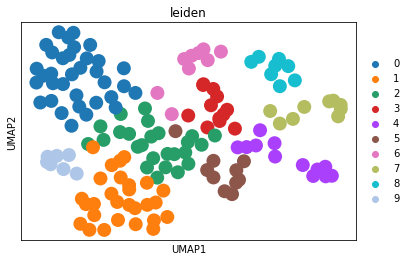

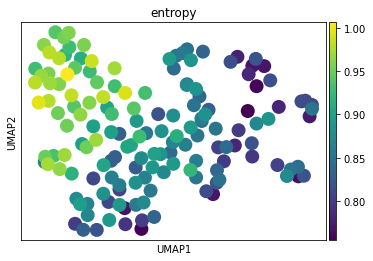

/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_831/1627362914.py:10: RuntimeWarning: divide by zero encountered in log
  return np.multiply(p, np.log(p)/np.log(N))
/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_831/1627362914.py:10: RuntimeWarning: invalid value encountered in multiply
  return np.multiply(p, np.log(p)/np.log(N))


Lineages: [Lineage[0, 2, 1, 9], Lineage[0, 2, 5], Lineage[0, 2, 3, 4], Lineage[0, 2, 3, 6], Lineage[0, 2, 3, 7, 8]]


  0%|          | 0/1 [00:00<?, ?it/s]

Reversing from leaf to root
Averaging branch @3 with lineages: [2, 3, 4] [<pcurve.pcurve.PrincipalCurve object at 0x7fbdb2ee4100>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb2ee4310>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb2ee49a0>]
Averaging branch @2 with lineages: [0, 1, 2, 3, 4] [<pcurve.pcurve.PrincipalCurve object at 0x7fbdcc7b1e20>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb2edf4c0>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb2ee47f0>]
Shrinking branch @2 with curves: [<pcurve.pcurve.PrincipalCurve object at 0x7fbdcc7b1e20>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb2edf4c0>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb2ee47f0>]
Shrinking branch @3 with curves: [<pcurve.pcurve.PrincipalCurve object at 0x7fbdb2ee4100>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb2ee4310>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb2ee49a0>]


100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


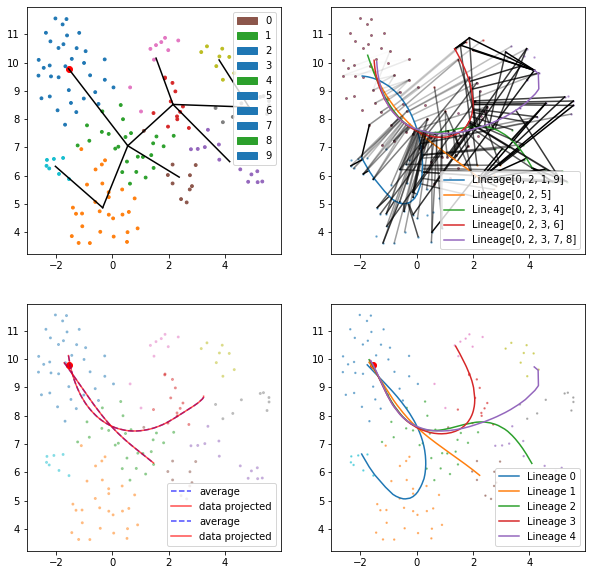

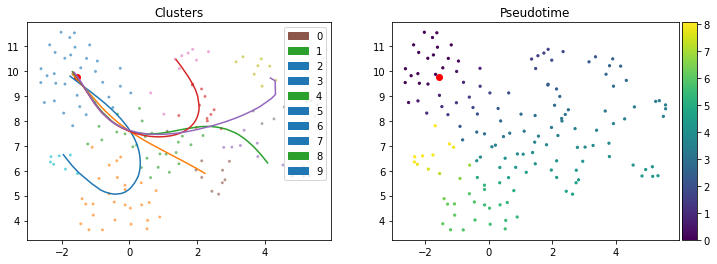

In [9]:
cluster_labels = adata_z4.obs['leiden']
#print(adata_z9)
#print(adata_z9.obs['leiden'])
#print(adata_z9.obs['leiden'][2])
sc.pl.umap(adata_z4, color='leiden')
sc.pl.umap(adata_z4, color='entropy')
cluster_labels_onehot = np.zeros(( adata_z4.n_obs, 10))
#print(adata_z9.obs['leiden'][1])

for i in range(adata_z4.n_obs):
    c = adata_z4.obs['leiden'][i]
    #print(c)
    cluster_labels_onehot[i][int(c)] = 1

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
custom_xlim = (-12, 12)
custom_ylim = (-12, 12)
# plt.setp(axes, xlim=custom_xlim, ylim=custom_ylim)

root, _ = sc_entropy(grouped_pcw4)
root_cluster = int(adata_z4.obs['leiden'][root])
slingshot = Slingshot(adata_z4.obsm['X_umap'], cluster_labels_onehot, start_node=root_cluster, debug_level='verbose')

slingshot.fit(num_epochs=1, debug_axes=axes)

fig, axes = plt.subplots(ncols=2, figsize=(12, 4))
axes[0].set_title('Clusters')
axes[1].set_title('Pseudotime')
slingshot.plotter.curves(axes[0], slingshot.curves)
slingshot.plotter.clusters(axes[0], labels=np.arange(slingshot.num_clusters), s=4, alpha=0.5)
slingshot.plotter.clusters(axes[1], color_mode='pseudotime', s=5)

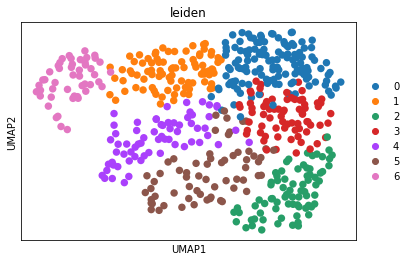

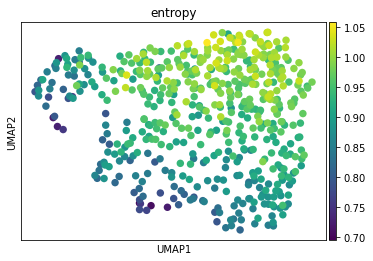

0


/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_831/1627362914.py:10: RuntimeWarning: divide by zero encountered in log
  return np.multiply(p, np.log(p)/np.log(N))
/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_831/1627362914.py:10: RuntimeWarning: invalid value encountered in multiply
  return np.multiply(p, np.log(p)/np.log(N))


Lineages: [Lineage[0, 1, 6], Lineage[0, 3, 5, 2], Lineage[0, 3, 5, 4]]


  0%|          | 0/1 [00:00<?, ?it/s]

Reversing from leaf to root
Averaging branch @5 with lineages: [1, 2] [<pcurve.pcurve.PrincipalCurve object at 0x7fbdb71d9eb0>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb71d9b50>]
Averaging branch @0 with lineages: [0, 1, 2] [<pcurve.pcurve.PrincipalCurve object at 0x7fbdb778e130>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb71d5ee0>]
Shrinking branch @0 with curves: [<pcurve.pcurve.PrincipalCurve object at 0x7fbdb778e130>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb71d5ee0>]
Shrinking branch @5 with curves: [<pcurve.pcurve.PrincipalCurve object at 0x7fbdb71d9eb0>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb71d9b50>]


100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


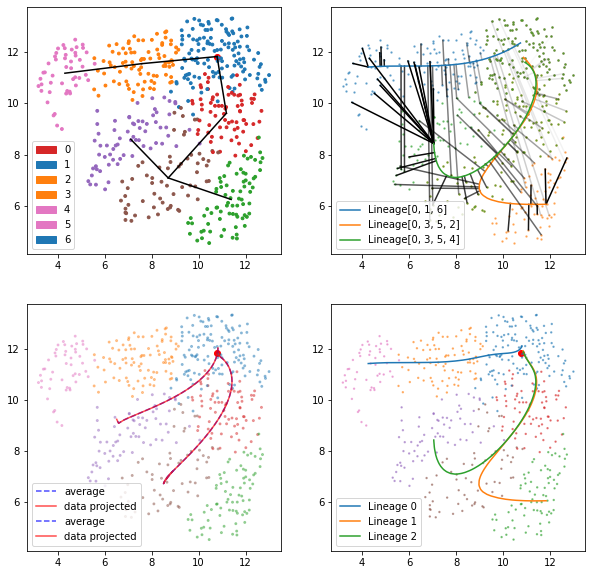

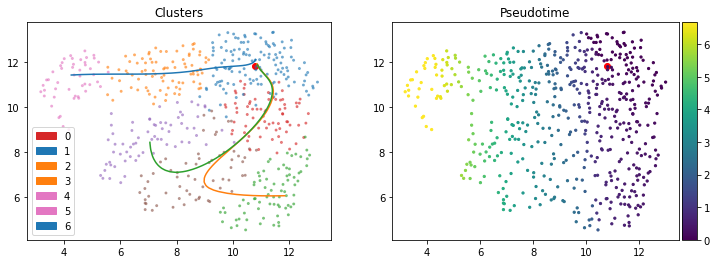

In [10]:
from slingshot import Slingshot

cluster_labels = adata_z6.obs['leiden']

sc.pl.umap(adata_z6, color='leiden')
sc.pl.umap(adata_z6, color='entropy')

cluster_labels_onehot = np.zeros(( adata_z6.n_obs, 7))
print(adata_z6.obs['leiden'][1])

for i in range(adata_z6.n_obs):
    c = adata_z6.obs['leiden'][i]
    #print(c)
    cluster_labels_onehot[i][int(c)] = 1

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
custom_xlim = (-12, 12)
custom_ylim = (-12, 12)
# plt.setp(axes, xlim=custom_xlim, ylim=custom_ylim)

root, _ = sc_entropy(grouped_pcw6)
root_cluster = int(adata_z6.obs['leiden'][root])
slingshot = Slingshot(adata_z6.obsm['X_umap'], cluster_labels_onehot, start_node=root_cluster, debug_level='verbose')

slingshot.fit(num_epochs=1, debug_axes=axes)

fig, axes = plt.subplots(ncols=2, figsize=(12, 4))
axes[0].set_title('Clusters')
axes[1].set_title('Pseudotime')
slingshot.plotter.curves(axes[0], slingshot.curves)
slingshot.plotter.clusters(axes[0], labels=np.arange(slingshot.num_clusters), s=4, alpha=0.5)
slingshot.plotter.clusters(axes[1], color_mode='pseudotime', s=5)

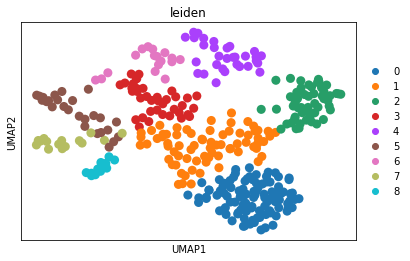

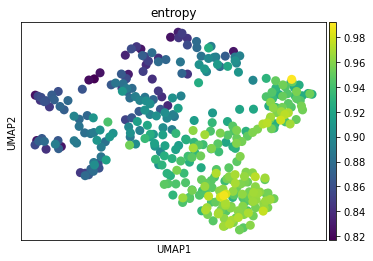

/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_831/1627362914.py:10: RuntimeWarning: divide by zero encountered in log
  return np.multiply(p, np.log(p)/np.log(N))
/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_831/1627362914.py:10: RuntimeWarning: invalid value encountered in multiply
  return np.multiply(p, np.log(p)/np.log(N))


Lineages: [Lineage[2, 1, 0], Lineage[2, 1, 5, 7], Lineage[2, 1, 8], Lineage[2, 1, 3, 6, 4]]


  0%|          | 0/1 [00:00<?, ?it/s]

Reversing from leaf to root
Averaging branch @1 with lineages: [0, 1, 2, 3] [<pcurve.pcurve.PrincipalCurve object at 0x7fbdb87a4970>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb8788bb0>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb8788d60>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb8788970>]
Shrinking branch @1 with curves: [<pcurve.pcurve.PrincipalCurve object at 0x7fbdb87a4970>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb8788bb0>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb8788d60>, <pcurve.pcurve.PrincipalCurve object at 0x7fbdb8788970>]


100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


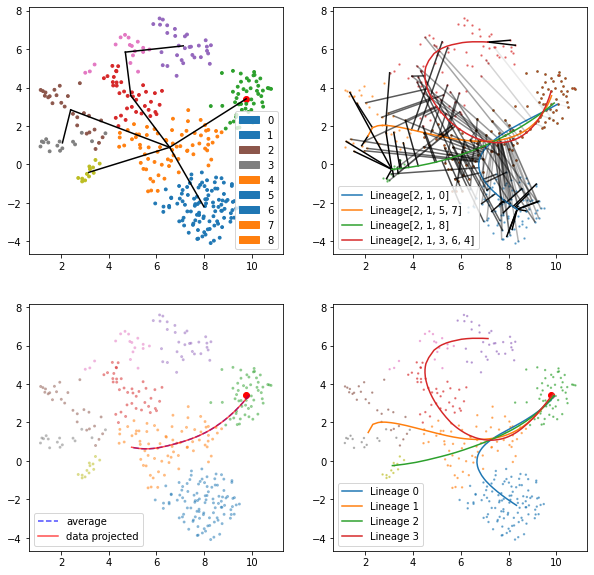

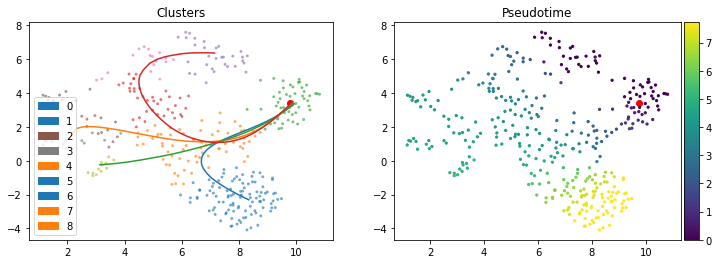

In [11]:
cluster_labels = adata_z9.obs['leiden']
#print(adata_z9)
#print(adata_z9.obs['leiden'])
#print(adata_z9.obs['leiden'][2])
sc.pl.umap(adata_z9, color='leiden')
sc.pl.umap(adata_z9, color='entropy')

cluster_labels_onehot = np.zeros(( adata_z9.n_obs, 9))  # change to num clusters+1
#print(adata_z9.obs['leiden'][1])

for i in range(adata_z9.n_obs):
    c = adata_z9.obs['leiden'][i]
    #print(c)
    cluster_labels_onehot[i][int(c)] = 1

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
custom_xlim = (-12, 12)
custom_ylim = (-12, 12)
# plt.setp(axes, xlim=custom_xlim, ylim=custom_ylim)

### FIX START NODE ###
root, _ = sc_entropy(grouped_pcw9)
root_cluster = int(adata_z9.obs['leiden'][root])
slingshot = Slingshot(adata_z9.obsm['X_umap'], cluster_labels_onehot, start_node=root_cluster, debug_level='verbose')

slingshot.fit(num_epochs=1, debug_axes=axes)

fig, axes = plt.subplots(ncols=2, figsize=(12, 4))
axes[0].set_title('Clusters')
axes[1].set_title('Pseudotime')
slingshot.plotter.curves(axes[0], slingshot.curves)
slingshot.plotter.clusters(axes[0], labels=np.arange(slingshot.num_clusters), s=4, alpha=0.5)
slingshot.plotter.clusters(axes[1], color_mode='pseudotime', s=5)

In [12]:
from itertools import combinations
import bottleneck as bn
from scipy import interpolate
from collections import defaultdict
import statsmodels.api as sm
import statsmodels as sm


#print(grouped_pcw9)

#help(Slingshot) maybe revise: take average of pseudotimes
def unified_pseudotime(sling):
    pseudotime = np.zeros_like(sling.curves[0].pseudotimes_interp)  # zero array size=num of cells
    for l_idx, lineage in enumerate(sling.lineages):
        curve = sling.curves[l_idx]
        # boolean array num_lineages x num_cells, reduced to array of length num_cells
        cell_mask = np.logical_or.reduce(
            np.array([sling.cluster_labels == k for k in lineage]))  
        pseudotime[cell_mask] = curve.pseudotimes_interp[cell_mask]
    return pseudotime
    
#print(unified_pseudotime(slingshot))

print(slingshot.lineages)  # list of Lineages
print(slingshot.cluster_lineages)  # lineages belonging to each cluster
print(slingshot.cluster_labels)
#print(slingshot.curves)   # list of principle curves len = #lineages

#print(slingshot.cell_weights)  # weights indicating cluster assignments?
#print(len(slingshot.cell_weights))

BIN_NUM = 100
WINDOW = 10
OFFSET = 5
nan2zero = True
i = 2

def bin_expression(sling, adata, permute=False):
    expression = []
    counts = []
    cluster_assignment = sling.cluster_labels
    pseudotimes = unified_pseudotime(sling)
    exp_df = adata.X
    
    #if permute:
        #c, t = generate_permutation(cluster_assignment, pseudotimes, i, permute_time=True)
        #cluster_assignment = c
        #pseudotimes = t
        
    for cluster in np.unique(sling.cluster_labels):
        #print(cluster)
        # boolean array num_lineages x num_cells, reduced to array of length num_cells
        cell_mask = np.logical_or.reduce(np.array([cluster_assignment == cluster]))
        cell_express = pd.DataFrame(exp_df[cell_mask])
        cell_times = pseudotimes[cell_mask]
        
        if permute:
            cell_express["pseudotime"] = cell_times
            cell_express = permute_cells(cell_express, i)
            cell_times = cell_express["pseudotime"]
            cell_express.drop(['pseudotime'], axis=1, inplace=True)
        
        bins = np.histogram_bin_edges(cell_times, BIN_NUM)
        bins[0] = -0.1  # so that 0.0 pseudotime values get included in the 1st bin
        bin_assign = np.digitize(cell_times, bins, right=True)
        #print(np.unique(bin_assign))
        cell_express["bins"] = bin_assign

        # inspect how many cells assigned to each location(time on path)
        count_bin = cell_express.groupby('bins').count()
        count_bin.reset_index(inplace=True)
        # get sum expression per gene per bin/time
        sum_bin = cell_express.groupby('bins').sum()
        sum_bin.reset_index(inplace=True)

        df_at = pd.DataFrame(np.arange(1, BIN_NUM+1, 1))  # all values has 2 digits in the dataframe
        df_at.columns = ['bins']

        # get full set of counts per bins; assign np.nan if no cells
        count_full = count_bin.merge(df_at, on='bins', how='right')
        count_full.sort_values('bins', inplace=True)
        count_full.reset_index(inplace=True, drop=True)
        count_full.drop(['bins'], axis=1, inplace=True)
        #count_full['time'] = bins
        
        # get full set of expression for all bins; assign np.nan if no cells
        sum_full = sum_bin.merge(df_at, on='bins', how='right')
        sum_full.sort_values('bins', inplace=True)
        sum_full.reset_index(inplace=True, drop=True)
        sum_full.drop(['bins'], axis=1, inplace=True)
        #sum_full["time"] = bins

        n_lap = WINDOW
        if WINDOW > 1:
            smaller_n_lap = int(WINDOW / 2)
        else:
            smaller_n_lap = 1

        # calculate move mean for a smaller window size
        
        _exp_sum = bn.move_sum(sum_full, window=smaller_n_lap, min_count=1, axis=0)
        _count_sum = bn.move_sum(count_full, window=smaller_n_lap, min_count=1, axis=0)
        exp_smaller = _exp_sum / _count_sum
        if nan2zero:
            exp_smaller = np.nan_to_num(exp_smaller)
        exp_smaller = exp_smaller[::OFFSET, :]  # slice to keep every OFFSETth point
        # get expressions over a window
        # still hold the space for the first few elements where window size is not large enough
        # min_count=1: still calculate for the first few elements even though the length is small than n_lap
        # also, np.nan is ignored as long as 1 element is not nan
        _exp_sum = bn.move_sum(sum_full, window=n_lap, min_count=1, axis=0)
        _count_sum = bn.move_sum(count_full, window=n_lap, min_count=1, axis=0)
        exp = _exp_sum / _count_sum
        if nan2zero:
            exp = np.nan_to_num(exp)
        exp = exp[::OFFSET, :]  # slice to keep every OFFSETth point
        exp = exp[int(n_lap/OFFSET):, :]
        exp = np.concatenate([exp_smaller[int(n_lap/OFFSET):n_lap, :], exp], axis=0)
             
        expression.append(exp, )
        counts.append(_count_sum)

        #print(expression)
    return expression, counts
    
def paired_dot(S, R, normalized=True):
        """
        Calculate dot product for each column in S and its paired column
        (same index) in R.
        Parameters
        ----------
            S: numpy array, number of time points x number of interaction pairs
                values in the sender
            R: numpy array, number of time points x number of interaction pairs
                values in the receiver
            normalized: boolean
                normalize by number of time points
        """
        if normalized:
            return np.einsum('ij,ij->j', S, R) / S.shape[0]
        else:
            return np.einsum('ij,ij->j', S, R)

def generate_permutation(cell_clusters, cell_times, i, permute_time=False):
        """
        Generate ith permutation by permutating the cluster labels and the cell time assignment while
        keeping the original distribution of time conditional on label and the marginal distribution
        of labels (i.e. the fraction of each time in a label and the fraction of a label) unchanged.
        """
        np.random.seed(i)

        # generate a permutated cell assignment (path & time)
        permutated_paths = np.random.permutation(cell_paths)
        permutated_times = cell_times # initialized as the original

        if permute_time:
            permuted_times = np.random.permutation(cell_times)
            #for i, cur_path in enumerate(self.unique_paths):
                # get original cell time assignment for the path
                #cur_times = self.cell_times_o[self.cell_paths_o == cur_path]
                #permutated_times[permutated_paths == cur_path] = np.random.permutation(cur_times)

        return permutated_paths, permutated_times
    
def permute_cells(adata, i):
        adata = adata.sample(frac=1, random_state=i).reset_index(drop=True)
        return adata
    
    
def fix(name):
        return name.split(".")[0]
    
def dot_product_clusters(c1, c2, sling, adata, lig_list, rec_list, permute=False):
    binned_exp, _ = bin_expression(sling, adata, permute)
    
    exp1 = pd.DataFrame(binned_exp[c1])
    exp2 = pd.DataFrame(binned_exp[c2])
    exp1.set_axis(np.vectorize(fix)(adata.var_names.values), axis=1, inplace=True)
    exp2.set_axis(np.vectorize(fix)(adata.var_names.values), axis=1, inplace=True)

    lig_exp12 = []
    rec_exp12 = []
    lig_exp21 = []
    rec_exp21 = []
    for lig, rec in zip(lig_list, rec_list):
        if lig in exp1.columns.values and rec in exp1.columns.values:
            lig_exp12.append(exp1[lig])
            rec_exp12.append(exp2[rec])

            lig_exp21.append(exp2[lig])
            rec_exp21.append(exp1[rec])
            
            print(lig, rec)
            fig, axes = plt.subplots(ncols=2, figsize=(12, 4))
            axes[0].set_title('cluster1-cluster2')
            axes[1].set_title('cluster2-cluster1')
            axes[0].plot(np.arange(0, len(exp1[lig])), exp1[lig], color="blue")
            axes[0].plot(np.arange(0, len(exp1[lig])), exp2[rec], color="orange")
            axes[1].plot(np.arange(0, len(exp1[lig])), exp1[rec], color="orange")
            axes[1].plot(np.arange(0, len(exp1[lig])), exp2[lig], color="blue")
            
            axes[0].scatter(np.arange(0, len(exp1[lig])), exp1[lig], color="blue")
            axes[0].scatter(np.arange(0, len(exp1[lig])), exp2[rec], color="orange")
            axes[1].scatter(np.arange(0, len(exp1[lig])), exp1[rec], color="orange")
            axes[1].scatter(np.arange(0, len(exp1[lig])), exp2[lig], color="blue")
            #axes[0].legend()
            #axes[1].legend()
            plt.show()
            
    L12 = np.array(lig_exp12)
    R12 = np.array(rec_exp12)
    dot12 = paired_dot(L12, R12)
    
    L21 = np.array(lig_exp21)
    R21 = np.array(rec_exp21)
    dot21 = paired_dot(L21, R21)
    return dot12, dot21

def get_splines(exp, interaction_list, degree=3):
        """
        Get splines for a cluster and per gene.
        Parameters
        ----------
        exp: numpy array,
            number of time points x number of genes, expression values
        T: integer,
            number of time points
        gene_names: list of strings,
            gene symbols
        degree: integer
            degree of splines, default 3
    
        Returns
        -------
        splines: dictionary with gene as the 1st level,
            fitted splines parameters (tuple)
        """
        timepoints = np.arange(len(exp))

        splines = defaultdict(dict)
        for i in interaction_list:
            ligand = i[0]
            receptor = i[1]
            _exp1 = exp[ligand]
            _exp2 = exp[receptor]
            tck1 = interpolate.splrep(timepoints, _exp1, k=degree)
            tck2 = interpolate.splrep(timepoints, _exp2, k=degree)
            splines[ligand] = tck1
            splines[receptor] = tck2

        return splines
    
def evaluate_splines_paths(S_spline, R_spline, T, interaction_list):

        """
        Estimate expression values using fitted splines.
        Parameters
        ----------
        time2path: dictionary
            time as key and list of edges / paths as value
        path2time: dictionary
            edge / path as key and time as value
        errors: dictionary
            f"{cur_path}_{other_path}" as key and a numpy array (umber of combinations of parameters x 1) as value,
            alignment errors for all pairs of edges
        align_params: list
            all combinations of possible parameter values, each element is a list [a, b, alpha, beta, overlap]
        unique_paths: numpy array,
            number of edges x 1
        interaction_list: list of tuples
            pairs of genes used for assessing interactions
        splines: dictionary with edge as the 1st level key and gene as the 2nd level,
            fitted splines parameters (tuple)
        NUM_SCORING: integer
            number of samples to take from the aligned time line
        Returns
        -------
        SS: numpy array, number of time points x number of pair of edges x number of interaction pairs
            values in the sender
        RR: numpy array, number of time points x number of pair of edges x number of interaction pairs
            values in the receiver
        """
        
        s = []
        r = []
        timepoints = np.arange(T)

        # for each ligand - receptor pair
        for i in interaction_list:
            ligand = i[0]
            receptor = i[1]

            spl = S_spline[ligand]
            _s = interpolate.splev(timepoints, spl)

            spl = R_spline[receptor]
            _r = interpolate.splev(timepoints, spl)

            s.append(_s[:, None])
            r.append(_r[:, None])

        S = np.concatenate(s, axis=1)
        R = np.concatenate(r, axis=1)

        return S, R
       

def p_value(params, dot_score):
    a = params[0]
    loc = params[1]
    scale = params[2]
   
    pval = scipy.stats.gamma.sf(dot_score, a, loc, scale)
    return pval
        
def compare_clusters(c1, c2, sling, adata, lig_list, rec_list, params, permute=False, round_values=True, integ_spatial=False):
    binned_exp, _ = bin_expression(sling, adata, permute)
    
    exp1 = pd.DataFrame(binned_exp[c1])
    exp2 = pd.DataFrame(binned_exp[c2])
    exp1.set_axis(np.vectorize(fix)(adata.var_names.values), axis=1, inplace=True)
    exp2.set_axis(np.vectorize(fix)(adata.var_names.values), axis=1, inplace=True)
    
    T = len(exp1)
    interaction_list = []
    for lig, rec in zip(lig_list, rec_list):
        if lig in exp1.columns.values and rec in exp1.columns.values:
            interaction_list.append((lig, rec))         

    spline1 = get_splines(exp1, interaction_list, degree=3)
    spline2 = get_splines(exp2, interaction_list, degree=3)
    
    lig_exp_12, rec_ex_12 = evaluate_splines_paths(spline1, spline2, T, interaction_list)
    lig_exp_21, rec_exp_21 = evaluate_splines_paths(spline2, spline1, T, interaction_list)
    
    score_dot12 = paired_dot(lig_exp_12, rec_ex_12)
    score_dot21 = paired_dot(lig_exp_21, rec_exp_21)
    
    if round_values:
        score_dot12 = np.round(score_dot12, 10)
        score_dot21 = np.round(score_dot21, 10)
        
    if integ_spatial:
        cluster_assignment = sling.cluster_labels
        cell_mask_1 = np.logical_or.reduce(np.array([cluster_assignment == c1]))
        cell_mask_2 = np.logical_or.reduce(np.array([cluster_assignment == c2]))
        weights_1 = adata.obsp['gau_spa_distances'][cell_mask_1][:, cell_mask_2]
        weights_2 = adata.obsp['gau_spa_distances'][cell_mask_2][:, cell_mask_1]
        score_dot12 = score_dot12*np.mean(weights_1)
        score_dot21 = score_dot21*np.mean(weights_2)

    a = params[0]
    loc = params[1]
    scale = params[2]
   
    pval_12 = scipy.stats.gamma.sf(score_dot12, a, loc, scale)
    pval_21 = scipy.stats.gamma.sf(score_dot21, a, loc, scale)
    
    '''
    #  BH procedure to control the FDR rate
    _p = results[f"cluster{c1}_{c2}_pvalue"].values.copy()

    for pair in results['lr_pair']: 
        condition = np.where(results['lr_pair'] == pair)[0]
        adjusted = sm.stats.multitest.fdrcorrection(results[f"cluster{c1}_{c2}_pvalue"].values[condition])
        _p[condition] = adjusted[1]
    results[f"cluster{c1}_{c2}_pvalue_adjusted"] = _p

    _p = results[f"cluster{c2}_{c1}_pvalue"].values.copy()

    for pair in results['lr_pair']: 
        condition = np.where(results['lr_pair'] == pair)[0]
        adjusted = sm.stats.multitest.fdrcorrection(results[f"cluster{c2}_{c1}_pvalue"].values[condition])
        _p[condition] = adjusted[1]
    results[f"cluster{c2}_{c1}_pvalue_adjusted"] = _p

    print(results)
    '''
    
    pval_12_adj = sm.stats.multitest.fdrcorrection(pval_12)[1]
    pval_21_adj = sm.stats.multitest.fdrcorrection(pval_21)[1]
    
    return score_dot12, score_dot21, pval_12, pval_21, pval_12_adj, pval_21_adj
    
def compare_clusters_by_lr(c1, c2, sling, adata, lig_list, rec_list, params_list, permute=False, round_values=True):
    binned_exp, _ = bin_expression(sling, adata, permute)
    
    exp1 = pd.DataFrame(binned_exp[c1])
    exp2 = pd.DataFrame(binned_exp[c2])
    exp1.set_axis(np.vectorize(fix)(adata.var_names.values), axis=1, inplace=True)
    exp2.set_axis(np.vectorize(fix)(adata.var_names.values), axis=1, inplace=True)
    
    T = len(exp1)
    interaction_list = []
    for lig, rec in zip(lig_list, rec_list):
        if lig in exp1.columns.values and rec in exp1.columns.values:
            interaction_list.append((lig, rec))         

    spline1 = get_splines(exp1, interaction_list, degree=3)
    spline2 = get_splines(exp2, interaction_list, degree=3)
    
    lig_exp_12, rec_ex_12 = evaluate_splines_paths(spline1, spline2, T, interaction_list)
    lig_exp_21, rec_exp_21 = evaluate_splines_paths(spline2, spline1, T, interaction_list)
    
    score_dot12 = paired_dot(lig_exp_12, rec_ex_12)
    score_dot21 = paired_dot(lig_exp_21, rec_exp_21)
    
    if round_values:
        score_dot12 = np.round(score_dot12, 10)
        score_dot21 = np.round(score_dot21, 10)
        
        
    pval_12 = []
    pval_21 = []
    for i in range(len(score_dot12)):
        lr_params = params_list[i]
        a = lr_params[0]
        loc = lr_params[1]
        scale = lr_params[2]
        p_12 = scipy.stats.gamma.sf(score_dot12[i], a, loc, scale)
        p_21 = scipy.stats.gamma.sf(score_dot21[i], a, loc, scale)
        pval_12.append(p_12)
        pval_21.append(p_21)
    
    pval_12_adj = sm.stats.multitest.fdrcorrection(pval_12)[1]
    pval_21_adj = sm.stats.multitest.fdrcorrection(pval_21)[1]
    
    return score_dot12, score_dot21, pval_12, pval_21, pval_12_adj, pval_21_adj

# comparison of two clusters: normalize    
#dot_product_clusters(3,5,slingshot,grouped_pcw9, lig, rec)
#binned_exp, _ = bin_expression(slingshot, grouped_pcw9)



[Lineage[2, 1, 0], Lineage[2, 1, 5, 7], Lineage[2, 1, 8], Lineage[2, 1, 3, 6, 4]]
{0: [0], 1: [0, 1, 2, 3], 2: [0, 1, 2, 3], 3: [3], 4: [3], 5: [1], 6: [3], 7: [1], 8: [2]}
[0 0 5 7 1 0 0 1 1 7 1 0 0 0 0 1 2 2 2 2 2 5 5 0 5 5 1 0 0 0 0 1 0 0 0 0 0
 1 2 2 2 2 2 2 2 0 3 5 5 5 1 0 0 0 0 0 0 0 0 1 2 1 2 2 2 5 5 0 5 1 1 1 0 1
 0 0 0 0 0 1 1 1 2 2 2 2 6 5 5 0 3 3 1 5 1 1 1 1 1 1 0 1 1 1 1 4 6 5 5 3 3
 0 1 7 7 1 1 1 3 3 3 3 3 0 3 3 6 7 7 7 7 7 3 3 0 3 3 3 3 7 7 7 7 3 3 0 3 3
 3 3 6 7 3 3 3 0 0 1 0 1 1 1 1 0 0 1 1 0 1 1 0 0 0 1 0 0 1 0 0 1 1 0 1 1 4
 2 2 2 2 0 2 2 2 2 2 2 2 2 2 2 0 4 2 2 4 2 2 6 4 6 3 0 1 1 1 1 1 1 1 8 1 3
 0 0 3 3 6 4 1 3 1 4 4 4 0 4 1 2 4 4 4 2 2 4 4 5 2 4 4 2 4 4 6 6 6 1 1 3 3
 3 3 1 8 1 4 6 6 1 6 6 6 6 6 3 8 8 8 8 1 8 4 4 4 4 4 8 8 8 8 0 8 4 4 4 4 4
 4 0 0 0 0 0 0 0 0 0 0 5 5 5 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 5 5 7 1 0 0
 0 0 0 0 0 0 0 0 2 2 2 0 5 5 5 1 0 0 0 0 1 1 0 1 0 0 1 2 2 2 2 5 3]


In [ ]:
#compare_clusters(c1, c2, slingshot, grouped_pcw9, lig, rec, params, permute=False, integ_spatial=True)

In [13]:
def spatial_cluster_score(c1, c2, sling, adata, lig_list, rec_list, permute=False):
    
    cluster_assignment = sling.cluster_labels
    cell_exp = adata.copy()
    
    #print(cell_exp.X)
    if permute:
        arr = cell_exp.X
        #print(arr)
        np.random.shuffle(arr)
        cell_exp.X = arr
        #print(cell_exp.X)

        #print(cluster)
    # boolean array num_lineages x num_cells, reduced to array of length num_cells
    cell_mask_1 = np.logical_or.reduce(np.array([cluster_assignment == c1]))
    cell_exp_1 = cell_exp[cell_mask_1]
        
    cell_mask_2 = np.logical_or.reduce(np.array([cluster_assignment == c2]))
    cell_exp_2 = cell_exp[cell_mask_2]
    
    # obtain weight matrices for distances between each two cells
    weights_1 = cell_exp.obsp['gau_spa_distances'][cell_mask_1][:, cell_mask_2]
    #weights_2 = cell_exp.obsp['gau_spa_distances'][cell_mask_2][:, cell_mask_1]
    
    # obtain minimum lig_rec expression matrix for each two cells, for every lig_rec
    interaction_list = []
    min_lr_exp_list = []
    for lig, rec in zip(lig_list, rec_list):
        if lig in adata.var_names and rec in adata.var_names:
            interaction_list.append((lig, rec))  
            
            lig_vector = pd.DataFrame(cell_exp_1[:, lig].X[:, 0])
            rec_vector = pd.DataFrame(cell_exp_2[:, rec].X[:, 0])
            
            
            min_vector = lig_vector.combine(rec_vector, np.minimum)
            arr = np.minimum(lig_vector.values[:, None], rec_vector.values)
            #print(len(rec_vector.values))
            min_lr_exp_list.append(arr[:,:,0])  # num_cells x num_cells
    
    #print(min_lr_exp_list)
    #s_ij = np.mean(min_lr_exp_list, axis=0)
    
    # multiply weights and l_r exp matrices for each l_r and sum all
    score12 = [np.sum(np.multiply(weights_1, i)) for i in min_lr_exp_list]
    #print(len(score12))
    
    
    """
    # Other way around c2-c1
    interaction_list = []
    min_lr_exp_list = []
    for lig, rec in zip(lig_list, rec_list):
        if lig in adata.var_names and rec in adata.var_names:
            interaction_list.append((rec, lig))  
            
            lig_vector = pd.DataFrame(cell_exp_2[:, lig].X[:, 0])
            rec_vector = pd.DataFrame(cell_exp_1[:, rec].X[:, 0])
            
            
            min_vector = lig_vector.combine(rec_vector, np.minimum)
            arr = np.minimum(lig_vector.values[:, None], rec_vector.values)
            min_lr_exp_list.append(arr[:,:,0])  # num_cells x num_cells
    
    s_ji = np.mean(min_lr_exp_list, axis=0)
    
    score21 = np.sum(np.multiply(weights_2, s_ji))
    print(score21)
    """
    return score12


def spa_compare_clusters(c1, c2, sling, adata, lig_list, rec_list, params, permute=False):

    score_spa12 = spatial_cluster_score(c1, c2, sling, adata, lig_list, rec_list, permute)
    #print(score_spa12)
    score_spa21 = spatial_cluster_score(c2, c1, sling, adata, lig_list, rec_list, permute)
        
    a = params[0]
    loc = params[1]
    scale = params[2]
   
    pval_12 = scipy.stats.gamma.sf(score_spa12, a, loc, scale)
    pval_21 = scipy.stats.gamma.sf(score_spa21, a, loc, scale)
    
    pval_12_adj = sm.stats.multitest.fdrcorrection(pval_12)[1]
    pval_21_adj = sm.stats.multitest.fdrcorrection(pval_21)[1]
    
    return score_spa12, score_spa21, pval_12, pval_21, pval_12_adj, pval_21_adj
    


def spa_compare_clusters_by_lr(c1, c2, sling, adata, lig_list, rec_list, params_list, permute=False):

    score_spa12 = spatial_cluster_score(c1, c2, sling, adata, lig_list, rec_list, permute)
    score_spa21 = spatial_cluster_score(c2, c1, sling, adata, lig_list, rec_list, permute)

    pval_12 = []
    pval_21 = []
    for i in range(len(score_dot12)):
        lr_params = params_list[i]
        a = lr_params[0]
        loc = lr_params[1]
        scale = lr_params[2]
        p_12 = scipy.stats.gamma.sf(score_spa12[i], a, loc, scale)
        p_21 = scipy.stats.gamma.sf(score_spa21[i], a, loc, scale)
        pval_12.append(p_12)
        pval_21.append(p_21)
        
    pval_12_adj = sm.stats.multitest.fdrcorrection(pval_12)[1]
    pval_21_adj = sm.stats.multitest.fdrcorrection(pval_21)[1]
    
    return score_spa12, score_spa21, pval_12, pval_21, pval_12_adj, pval_21_adj
    



lr_data = pd.read_csv('/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_lr_pair.tsv', sep='\t')
#print(lr_data)
lig = lr_data['ligand_ensembl_gene_id']
rec = lr_data['receptor_ensembl_gene_id']

path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/random_dot_scores_1000.npy"
rand_scores = np.load(path)
params = scipy.stats.gamma.fit(rand_scores)

def gen_rand_scores(c1, c2, sling, adata, lig_list, rec_list, NUM_PERMS=1000):
    scores = []
    num_clus = len(np.unique(sling.cluster_labels))
    for i in range(NUM_PERMS):
        print(i)
        c1 = np.random.randint(num_clus)
        c2 = np.random.randint(num_clus)
        score_spa12, score_spa21, _, _, _, _ = spa_compare_clusters(c1, c2, sling, adata, lig_list, rec_list, params, permute=True)
        scores.append(score_spa12)
        scores.append(score_spa21)
    return scores

#do=False
#for c1, c2 in combinations(np.unique(slingshot.cluster_labels), 2):
    #print(c1, c2)
    #do=True
    #if c1==0 and c2==5:
        #do=True
    #if do:

#c1=0
#c2=5
#scores = gen_rand_scores(c1, c2, slingshot, grouped_pcw9, lig, rec, NUM_PERMS=10000)
#scores_flat = np.array(scores).flatten()
#path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/random_spa_scores_10000"
#np.save(path, scores_flat)
#np.save(path, scores)


In [18]:
#spatial_cluster_score(0, 1, slingshot, grouped_pcw9, lig, rec, permute=False)
#spa_compare_clusters(0, 1, slingshot, grouped_pcw9, lig, rec, (1,1,1), permute=False)

In [14]:
import gc
gc.collect()

59441

In [146]:

BIN_NUM = 100
WINDOW = 10
OFFSET = 5
nan2zero = True
i = 2

def bin_expression(sling, adata, permute=True):
    expression = []
    counts = []
    cluster_assignment = sling.cluster_labels
    pseudotimes = unified_pseudotime(sling)
    exp_df = adata.X
    
    #if permute:
        #c, t = generate_permutation(cluster_assignment, pseudotimes, i, permute_time=True)
        #cluster_assignment = c
        #pseudotimes = t
        
    cell_express = pd.DataFrame(exp_df)
    cell_times = pseudotimes
    
    if permute:
        cell_express["pseudotime"] = cell_times
        cell_exp = permute_cells(cell_express, i)
        cell_times = cell_express["pseudotime"]
        cell_exp.drop(['pseudotime'], axis=1, inplace=True)

    for cluster in np.unique(sling.cluster_labels):
        #print(cluster)
        # boolean array num_lineages x num_cells, reduced to array of length num_cells
        cell_mask = np.logical_or.reduce(np.array([cluster_assignment == cluster]))
        cell_express = pd.DataFrame(cell_exp[cell_mask])
        cell_times = pseudotimes[cell_mask]
        
        bins = np.histogram_bin_edges(cell_times, BIN_NUM)
        bins[0] = -0.1  # so that 0.0 pseudotime values get included in the 1st bin
        bin_assign = np.digitize(cell_times, bins, right=True)
        #print(np.unique(bin_assign))
        cell_express["bins"] = bin_assign

        # inspect how many cells assigned to each location(time on path)
        count_bin = cell_express.groupby('bins').count()
        count_bin.reset_index(inplace=True)
        # get sum expression per gene per bin/time
        sum_bin = cell_express.groupby('bins').sum()
        sum_bin.reset_index(inplace=True)

        df_at = pd.DataFrame(np.arange(1, BIN_NUM+1, 1))  # all values has 2 digits in the dataframe
        df_at.columns = ['bins']

        # get full set of counts per bins; assign np.nan if no cells
        count_full = count_bin.merge(df_at, on='bins', how='right')
        count_full.sort_values('bins', inplace=True)
        count_full.reset_index(inplace=True, drop=True)
        count_full.drop(['bins'], axis=1, inplace=True)
        #count_full['time'] = bins
        
        # get full set of expression for all bins; assign np.nan if no cells
        sum_full = sum_bin.merge(df_at, on='bins', how='right')
        sum_full.sort_values('bins', inplace=True)
        sum_full.reset_index(inplace=True, drop=True)
        sum_full.drop(['bins'], axis=1, inplace=True)
        #sum_full["time"] = bins

        n_lap = WINDOW
        if WINDOW > 1:
            smaller_n_lap = int(WINDOW / 2)
        else:
            smaller_n_lap = 1

        # calculate move mean for a smaller window size
        
        _exp_sum = bn.move_sum(sum_full, window=smaller_n_lap, min_count=1, axis=0)
        _count_sum = bn.move_sum(count_full, window=smaller_n_lap, min_count=1, axis=0)
        exp_smaller = _exp_sum / _count_sum
        if nan2zero:
            exp_smaller = np.nan_to_num(exp_smaller)
        exp_smaller = exp_smaller[::OFFSET, :]  # slice to keep every OFFSETth point
        # get expressions over a window
        # still hold the space for the first few elements where window size is not large enough
        # min_count=1: still calculate for the first few elements even though the length is small than n_lap
        # also, np.nan is ignored as long as 1 element is not nan
        _exp_sum = bn.move_sum(sum_full, window=n_lap, min_count=1, axis=0)
        _count_sum = bn.move_sum(count_full, window=n_lap, min_count=1, axis=0)
        exp = _exp_sum / _count_sum
        if nan2zero:
            exp = np.nan_to_num(exp)
        exp = exp[::OFFSET, :]  # slice to keep every OFFSETth point
        exp = exp[int(n_lap/OFFSET):, :]
        exp = np.concatenate([exp_smaller[int(n_lap/OFFSET):n_lap, :], exp], axis=0)
             
        expression.append(exp, )
        counts.append(_count_sum)


    #print(expression)
    return expression, counts


lr_data = pd.read_csv('/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_lr_pair.tsv', sep='\t')
#print(lr_data)
lig = lr_data['ligand_ensembl_gene_id']
rec = lr_data['receptor_ensembl_gene_id']
print(lr_data)

path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/random_dot_scores_1000.npy"
rand_scores = np.load(path)
params = scipy.stats.gamma.fit(rand_scores)

def get_rand_scores(sling, adata, lig_list, rec_list, NUM_PERMS=1000):
    scores = []
    for i in range(NUM_PERMS):
        #print(i)
        score_dot12, score_dot21, _, _, _, _ = compare_clusters(c1, c2, sling, adata, lig_list, rec_list, params, permute=True)
        scores.append(score_dot12)
        scores.append(score_dot21)
    return scores

def generate_rand_scores(c1, c2, sling, adata, lig_list, rec_list, NUM_PERMS=1000):
    scores = []
    for i in range(NUM_PERMS):
        print(i)
        c1 = np.random.choice(np.unique(sling.cluster_labels))
        c2 = np.random.choice(np.unique(sling.cluster_labels))
        score_dot12, score_dot21, _, _, _, _ = compare_clusters(c1, c2, sling, adata, lig_list, rec_list, params, permute=True)
        scores.append(score_dot12)
        scores.append(score_dot21)
    return scores

#for c1, c2 in combinations(np.unique(slingshot.cluster_labels), 2):
for c1, c2 in [(0,1)]:
    print(c1, c2)
    scores = generate_rand_scores(c1, c2, slingshot, grouped_pcw9, lig, rec, NUM_PERMS=10000)
    #scores_flat = np.array(scores).flatten()
    path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mixed_random_dot_scores_10000"
    #np.save(path, scores_flat)
    np.save(path, scores)
    
#####


            lr_pair ligand_gene_symbol receptor_gene_symbol  ligand_gene_id  \
0     SEMA3F_PLXNA3             SEMA3F               PLXNA3            6405   
1     SEMA3F_PLXNA1             SEMA3F               PLXNA1            6405   
2       SEMA3F_NRP1             SEMA3F                 NRP1            6405   
3       SEMA3F_NRP2             SEMA3F                 NRP2            6405   
4     CX3CL1_CX3CR1             CX3CL1               CX3CR1            6376   
...             ...                ...                  ...             ...   
3393      CGA_GPR84                CGA                GPR84            1081   
3394      ASIP_MC1R               ASIP                 MC1R             434   
3395    VEGFA_ITGB3              VEGFA                ITGB3            7422   
3396    APELA_APLNR              APELA                APLNR       100506013   
3397   VEGFA_GRIN2B              VEGFA               GRIN2B            7422   

      receptor_gene_id ligand_ensembl_protein_id re

In [15]:
lr_data = pd.read_csv('/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_lr_pair.tsv', sep='\t')
#print(lr_data)
lig = lr_data['ligand_ensembl_gene_id']
rec = lr_data['receptor_ensembl_gene_id']
print(lr_data)

path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/random_dot_scores_1000.npy"
rand_scores = np.load(path)
params = scipy.stats.gamma.fit(rand_scores)
'''
def generate_rand_scores(c1, c2, sling, adata, lig_list, rec_list, NUM_PERMS=10000):
    scores = []
    for i in range(NUM_PERMS):
        #print(i)
        score_dot12, score_dot21, _, _, _, _ = compare_clusters(c1, c2, sling, adata, lig_list, rec_list, params, permute=True)
        scores.append(score_dot12)
        scores.append(score_dot21)
    return scores
'''
def generate_rand_scores(c1, c2, sling, adata, lig_list, rec_list, NUM_PERMS=1000):
    scores = []
    for i in range(NUM_PERMS):
        print(i)
        c1 = np.random.choice(np.unique(sling.cluster_labels))
        c2 = np.random.choice(np.unique(sling.cluster_labels))
        score_dot12, score_dot21, _, _, _, _ = compare_clusters(c1, c2, sling, adata, lig_list, rec_list, params, permute=True)
        scores.append(score_dot12)
        scores.append(score_dot21)
    return scores
#do=False
"""
for c1, c2 in combinations(np.unique(slingshot.cluster_labels), 2):
    print(c1, c2)
    #if c1==1 and c2==5:
        #do=True
    #if do:
    scores = generate_rand_scores(c1, c2, slingshot, grouped_pcw9, lig, rec)
    scores_flat = np.array(scores).flatten()
    path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/random_dot_scores_{c1}_{c2}_10000"
    np.save(path, scores_flat)
"""

            lr_pair ligand_gene_symbol receptor_gene_symbol  ligand_gene_id  \
0     SEMA3F_PLXNA3             SEMA3F               PLXNA3            6405   
1     SEMA3F_PLXNA1             SEMA3F               PLXNA1            6405   
2       SEMA3F_NRP1             SEMA3F                 NRP1            6405   
3       SEMA3F_NRP2             SEMA3F                 NRP2            6405   
4     CX3CL1_CX3CR1             CX3CL1               CX3CR1            6376   
...             ...                ...                  ...             ...   
3393      CGA_GPR84                CGA                GPR84            1081   
3394      ASIP_MC1R               ASIP                 MC1R             434   
3395    VEGFA_ITGB3              VEGFA                ITGB3            7422   
3396    APELA_APLNR              APELA                APLNR       100506013   
3397   VEGFA_GRIN2B              VEGFA               GRIN2B            7422   

      receptor_gene_id ligand_ensembl_protein_id re

'\nfor c1, c2 in combinations(np.unique(slingshot.cluster_labels), 2):\n    print(c1, c2)\n    #if c1==1 and c2==5:\n        #do=True\n    #if do:\n    scores = generate_rand_scores(c1, c2, slingshot, grouped_pcw9, lig, rec)\n    scores_flat = np.array(scores).flatten()\n    path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/random_dot_scores_{c1}_{c2}_10000"\n    np.save(path, scores_flat)\n'

In [104]:
print(len(scores))
s = generate_rand_scores(c1, c2, slingshot, grouped_pcw9, lig, rec, NUM_PERMS=100)
sc = scores + s
print(len(sc))

2000
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
2200


In [115]:
ss = generate_rand_scores(c1, c2, slingshot, grouped_pcw9, lig, rec, NUM_PERMS=100)
sc += ss
path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mixed_random_dot_scores_1010"
np.save(path, sc)
print(len(sc))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
2800


/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


bruhhh
sheeesh


/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


reeeee


/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_831/4138641786.py:80: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if ligand in genes and receptor in genes:


131
131
59
59
0
0
0
0
0
0
0
0
0
0
0
0
0
0
121
121
31
31
49
49
0
0
21
21
0
0
2
2
8
8
229
229
0
0
63
63
0
0
44
44
0
0
0
0
101
101
0
0
12
12
4
4
0
0
0
0
130
130
0
0
30
30
0
0
0
0
91
91
14
14
1
1
0
0
86
86
0
0
0
0
35
35
0
0
44
44
[[131.  59.   0.   0.   0.   0.   0.   0.   0.]
 [ 59. 121.  31.  49.   0.  21.   0.   2.   8.]
 [  0.  31. 229.   0.  63.   0.  44.   0.   0.]
 [  0.  49.   0. 101.   0.  12.   4.   0.   0.]
 [  0.   0.  63.   0. 130.   0.  30.   0.   0.]
 [  0.  21.   0.  12.   0.  91.  14.   1.   0.]
 [  0.   0.  44.   4.  30.  14.  86.   0.   0.]
 [  0.   2.   0.   0.   0.   1.   0.  35.   0.]
 [  0.   8.   0.   0.   0.   0.   0.   0.  44.]]


<AxesSubplot:>

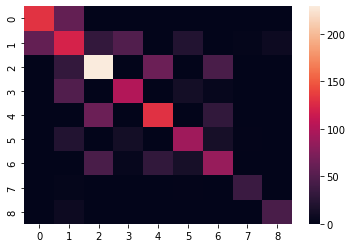

In [15]:
import scipy.stats
from itertools import combinations_with_replacement
from sklearn.preprocessing import normalize
pd.options.mode.chained_assignment = None  # default='warn'


cutoff =  0.05
alpha = 0.5

path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/mixed_random_dot_scores_10000.npy"
rand = np.load(path)
rand_flat = np.array(rand).flatten()
rand_scores = np.random.choice(rand_flat, size=20000, replace=False)
params = scipy.stats.gamma.fit(rand_scores)

###
params_list = []
#print(rand)
for i in range(len(rand[0])):
    #print(rand[:, i])
    #print(i)
    try:
        prm = scipy.stats.gamma.fit(rand[:, i])  ###
    except:
        prm = params
    #print(prm)
    params_list.append(prm)
#print(params_list)
#plt.hist(rand_scores)
print("bruhhh")
###


path2 = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/random_spa_scores_10000.npy"
rand2 = np.load(path)
rand_flat2 = np.array(rand2).flatten()
rand_scores2 = np.random.choice(rand_flat2, size=20000, replace=False)
params2 = scipy.stats.gamma.fit(rand_scores2)


###
params_list2 = []
for i in range(len(rand[0])):
    try:
        prm = scipy.stats.gamma.fit(rand2[:, i])   ###
    except:
        prm = params2
    params_list2.append(prm)
#plt.hist(rand_scores2)
print('sheeesh')
###


avg_rand_scores =  alpha*normalize([rand_scores])[0] + (1-alpha)*normalize([rand_scores2])[0]
#print(avg_rand_scores)
#plt.hist(avg_rand_scores)
avg_params = scipy.stats.gamma.fit(avg_rand_scores)


avg_rand =  alpha*normalize(rand) + (1-alpha)*normalize(rand2)
#print(avg_rand)
#plt.hist(avg_rand_scores)

###
avg_params_list  = []
for i in range(len(rand[0])):
    try:
        prm = scipy.stats.gamma.fit(avg_rand[:, i])   ###
    except:
        prm = avg_rand
    avg_params_list.append(prm)
    
print('reeeee')
###

genes = np.vectorize(fix)(grouped_pcw9.var_names.values)
ligand_list = []
receptor_list = []
for ligand, receptor in zip(lig, rec):
    if ligand in genes and receptor in genes:
        ligand_list.append(ligand)
        receptor_list.append(receptor)

df = lr_data[lr_data['ligand_ensembl_gene_id'].isin(ligand_list)]
results = df[df['receptor_ensembl_gene_id'].isin(receptor_list)]
results.reset_index(inplace=True)

num_clusters = len(np.unique(slingshot.cluster_labels))
counts = np.zeros((num_clusters, num_clusters))

for c1, c2 in combinations_with_replacement(np.unique(slingshot.cluster_labels), 2):
    #path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/random_dot_scores_{c1}_{c2}_1000.npy"
    #try:
        #rand_scores = np.load(path)
    #except:
        #path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/random_dot_scores_1000.npy"
        #rand_scores = np.load(path)
    #params = scipy.stats.gamma.fit(rand_scores)

    score_dot_12, score_dot_21, pval_12, pval_21, adj_12, adj_21 = compare_clusters(c1, c2, slingshot, grouped_pcw9, lig, rec, params, permute=False)
    #score_dot12, score_dot21, pval_12, pval_21, adj_12, adj_21 = compare_clusters_by_lr(c1, c2, slingshot, grouped_pcw9, lig, rec, params_list, permute=False)
    
    res = results.copy()
    res[f"cluster{c1}_{c2}_dot_score"] = score_dot_12
    res[f"cluster{c2}_{c1}_dot_score"] = score_dot_21

    res[f"cluster{c1}_{c2}_pvalue"] = pval_12
    res[f"cluster{c2}_{c1}_pvalue"] = pval_21
    
    res[f"cluster{c1}_{c2}_pvalue_adj"] = adj_12
    res[f"cluster{c2}_{c1}_pvalue_adj"] = adj_21
    
    
    score_spa_12, score_spa_21, spa_pval_12, spa_pval_21, spa_adj_12, spa_adj_21 = spa_compare_clusters(c1, c2, slingshot, grouped_pcw9, lig, rec, params2, permute=False)
    #score_spa12, score_spa21, spa_pval_12, spa_pval_21, spa_adj_12, spa_adj_21 = spa_compare_clusters_by_lr(c1, c2, slingshot, grouped_pcw9, lig, rec, params_list2, permute=False)
    
    res[f"cluster{c1}_{c2}_spa_score"] = score_spa_12
    res[f"cluster{c2}_{c1}_spa_score"] = score_spa_21

    res[f"cluster{c1}_{c2}_spa_pvalue"] = spa_pval_12
    res[f"cluster{c2}_{c1}_spa_pvalue"] = spa_pval_21
    
    res[f"cluster{c1}_{c2}_spa_pvalue_adj"] = spa_adj_12
    res[f"cluster{c2}_{c1}_spa_pvalue_adj"] = spa_adj_21
    
    
    avg_score_12 = alpha*normalize([score_dot_12])[0] + (1-alpha)*normalize([score_spa_12])[0]
    avg_score_21 = alpha*normalize([score_dot_21])[0] + (1-alpha)*normalize([score_spa_21])[0]
    avg_pval_12 = scipy.stats.gamma.sf(avg_score_12, avg_params[0], avg_params[1], avg_params[2])
    avg_pval_21 = scipy.stats.gamma.sf(avg_score_21, avg_params[0], avg_params[1], avg_params[2])
    avg_pval_adj_12 = sm.stats.multitest.fdrcorrection(avg_pval_12)[1]
    avg_pval_adj_21 = sm.stats.multitest.fdrcorrection(avg_pval_21)[1]
    
#     avg_score_12 = alpha*normalize([score_dot_12])[0] + (1-alpha)*normalize([score_spa_12])[0]
#     avg_score_21 = alpha*normalize([score_dot21])[0] + (1-alpha)*normalize([score_spa21])[0]
#     avg_pval_12 = scipy.stats.gamma.sf(avg_score12, avg_params[0], avg_params[1], avg_params[2])
#     avg_pval_21 = scipy.stats.gamma.sf(avg_score21, avg_params[0], avg_params[1], avg_params[2])
#     avg_pval_adj_12 = sm.stats.multitest.fdrcorrection(avg_pval_12)[1]
#     avg_pval_adj_21 = sm.stats.multitest.fdrcorrection(avg_pval_21)[1]
    
    avg_score_12, avg_score_21, avg_pval_12, avg_pval_21, avg_pval_adj_12, avg_pval_adj_21 = compare_clusters(c1, c2, slingshot, grouped_pcw9, lig, rec, avg_params, permute=False, integ_spatial=True)
    
    res[f"cluster{c1}_{c2}_avg_score"] = avg_score_12
    res[f"cluster{c2}_{c1}_avg_score"] = avg_score_21

    res[f"cluster{c1}_{c2}_avg_pvalue"] = avg_pval_12
    res[f"cluster{c2}_{c1}_avg_pvalue"] = avg_pval_21
    
    res[f"cluster{c1}_{c2}_avg_pvalue_adj"] = avg_pval_adj_12
    res[f"cluster{c2}_{c1}_avg_pvalue_adj"] = avg_pval_adj_21

    res.sort_values(by=[f"cluster{c1}_{c2}_avg_pvalue", f"cluster{c2}_{c1}_avg_pvalue"], inplace = True)
    
    ### FIX P_VALUE ADJUSTED ###
    
    # count significant genes
    #name_p = f"cluster{c1}_{c2}_avg_pvalue"
    name_p = f"cluster{c2}_{c1}_avg_pvalue"

    # subset only contains significant pairs
    condition = res[name_p] < cutoff
    df_sig = res[condition].copy()
    df_sig.reset_index(inplace=True)
    print(len(df_sig))
    counts[c1, c2] = len(df_sig)

    path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_results.csv"
    res.to_csv(path)
    path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_sig_results.csv"
    df_sig.to_csv(path)
    
    # count significant genes
    #name_p = f"cluster{c2}_{c1}_avg_pvalue"
    name_p = f"cluster{c2}_{c1}_avg_pvalue"

    # subset only contains significant pairs
    condition = res[name_p] < cutoff
    df_sig = res[condition].copy()
    df_sig.reset_index(inplace=True)
    print(len(df_sig))
    counts[c2, c1] = len(df_sig)

    path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_results.csv"
    res.to_csv(path)
    path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_sig_results.csv"
    df_sig.to_csv(path)
    
    #marker_genes = df_sig['ligand_ensembl_gene_id'].tolist() + df_sig['receptor_ensembl_gene_id'].tolist()
    #plt.fig.subplots_adjust() 
    #sc.pl.dotplot(grouped_pcw9, marker_genes, groupby='vae')
    
    
print(counts)
sns.heatmap(pd.DataFrame(counts))


/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_2678/2225791004.py:5: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if ligand in genes and receptor in genes:


369
369
378
378
374
374
298
298
231
231
237
237
186
186
82
82
141
141
400
400
395
395
300
300
235
235
249
249
190
190
103
103
130
130
399
399
291
291
248
248
237
237
199
199
93
93
136
136
216
216
162
162
174
174
122
122
59
59
84
84
153
153
167
167
129
129
45
45
99
99
115
115
96
96
48
48
62
62
109
109
5
5
49
49
35
35
28
28
44
44
[[369. 378. 374. 298. 231. 237. 186.  82. 141.]
 [378. 400. 395. 300. 235. 249. 190. 103. 130.]
 [374. 395. 399. 291. 248. 237. 199.  93. 136.]
 [298. 300. 291. 216. 162. 174. 122.  59.  84.]
 [231. 235. 248. 162. 153. 167. 129.  45.  99.]
 [237. 249. 237. 174. 167. 115.  96.  48.  62.]
 [186. 190. 199. 122. 129.  96. 109.   5.  49.]
 [ 82. 103.  93.  59.  45.  48.   5.  35.  28.]
 [141. 130. 136.  84.  99.  62.  49.  28.  44.]]


<AxesSubplot:>

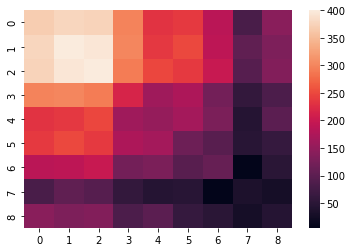

In [18]:
genes = np.vectorize(fix)(grouped_pcw9.var_names.values)
ligand_list = []
receptor_list = []
for ligand, receptor in zip(lig, rec):
    if ligand in genes and receptor in genes:
        ligand_list.append(ligand)
        receptor_list.append(receptor)

df = lr_data[lr_data['ligand_ensembl_gene_id'].isin(ligand_list)]
results = df[df['receptor_ensembl_gene_id'].isin(receptor_list)]
results.reset_index(inplace=True)

num_clusters = len(np.unique(slingshot.cluster_labels))
counts = np.zeros((num_clusters, num_clusters))

for c1, c2 in combinations_with_replacement(np.unique(slingshot.cluster_labels), 2):
    #path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/random_dot_scores_{c1}_{c2}_1000.npy"
    #try:
        #rand_scores = np.load(path)
    #except:
        #path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/random_dot_scores_1000.npy"
        #rand_scores = np.load(path)
    #params = scipy.stats.gamma.fit(rand_scores)

    #score_dot_12, score_dot_21, pval_12, pval_21, adj_12, adj_21 = compare_clusters(c1, c2, slingshot, grouped_pcw9, lig, rec, params, permute=False)
    score_dot_12, score_dot_21, pval_12, pval_21, adj_12, adj_21 = compare_clusters_by_lr(c1, c2, slingshot, grouped_pcw9, lig, rec, params_list, permute=False)
    
    res = results.copy()
    res[f"cluster{c1}_{c2}_dot_score"] = score_dot_12
    res[f"cluster{c2}_{c1}_dot_score"] = score_dot_21

    res[f"cluster{c1}_{c2}_pvalue"] = pval_12
    res[f"cluster{c2}_{c1}_pvalue"] = pval_21
    
    res[f"cluster{c1}_{c2}_pvalue_adj"] = adj_12
    res[f"cluster{c2}_{c1}_pvalue_adj"] = adj_21
    
    
    #score_spa_12, score_spa_21, spa_pval_12, spa_pval_21, spa_adj_12, spa_adj_21 = spa_compare_clusters(c1, c2, slingshot, grouped_pcw9, lig, rec, params2, permute=False)
    score_spa_12, score_spa_21, spa_pval_12, spa_pval_21, spa_adj_12, spa_adj_21 = spa_compare_clusters_by_lr(c1, c2, slingshot, grouped_pcw9, lig, rec, params_list2, permute=False)
    
    res[f"cluster{c1}_{c2}_spa_score"] = score_spa_12
    res[f"cluster{c2}_{c1}_spa_score"] = score_spa_21

    res[f"cluster{c1}_{c2}_spa_pvalue"] = spa_pval_12
    res[f"cluster{c2}_{c1}_spa_pvalue"] = spa_pval_21
    
    res[f"cluster{c1}_{c2}_spa_pvalue_adj"] = spa_adj_12
    res[f"cluster{c2}_{c1}_spa_pvalue_adj"] = spa_adj_21
    

    avg_score_12 = alpha*normalize([score_dot_12])[0] + (1-alpha)*normalize([score_spa_12])[0]
    avg_score_21 = alpha*normalize([score_dot_21])[0] + (1-alpha)*normalize([score_spa_21])[0]
    avg_pval_12 = scipy.stats.gamma.sf(avg_score_12, avg_params[0], avg_params[1], avg_params[2])
    avg_pval_21 = scipy.stats.gamma.sf(avg_score_21, avg_params[0], avg_params[1], avg_params[2])
    avg_pval_adj_12 = sm.stats.multitest.fdrcorrection(avg_pval_12)[1]
    avg_pval_adj_21 = sm.stats.multitest.fdrcorrection(avg_pval_21)[1]
    
#     avg_score_12 = alpha*normalize([score_dot_12])[0] + (1-alpha)*normalize([score_spa_12])[0]
#     avg_score_21 = alpha*normalize([score_dot21])[0] + (1-alpha)*normalize([score_spa21])[0]
#     avg_pval_12 = scipy.stats.gamma.sf(avg_score12, avg_params[0], avg_params[1], avg_params[2])
#     avg_pval_21 = scipy.stats.gamma.sf(avg_score21, avg_params[0], avg_params[1], avg_params[2])
#     avg_pval_adj_12 = sm.stats.multitest.fdrcorrection(avg_pval_12)[1]
#     avg_pval_adj_21 = sm.stats.multitest.fdrcorrection(avg_pval_21)[1]
    
    avg_score_12, avg_score_21, avg_pval_12, avg_pval_21, avg_pval_adj_12, avg_pval_adj_21 = compare_clusters(c1, c2, slingshot, grouped_pcw9, lig, rec, avg_params, permute=False, integ_spatial=False)
    
    res[f"cluster{c1}_{c2}_avg_score"] = avg_score_12
    res[f"cluster{c2}_{c1}_avg_score"] = avg_score_21

    res[f"cluster{c1}_{c2}_avg_pvalue"] = avg_pval_12
    res[f"cluster{c2}_{c1}_avg_pvalue"] = avg_pval_21
    
    res[f"cluster{c1}_{c2}_avg_pvalue_adj"] = avg_pval_adj_12
    res[f"cluster{c2}_{c1}_avg_pvalue_adj"] = avg_pval_adj_21

    res.sort_values(by=[f"cluster{c1}_{c2}_avg_pvalue", f"cluster{c2}_{c1}_avg_pvalue"], inplace = True)
    
    ### FIX P_VALUE ADJUSTED ###
    
    # count significant genes
    #name_p = f"cluster{c1}_{c2}_avg_pvalue"
    name_p = f"cluster{c2}_{c1}_avg_pvalue"

    # subset only contains significant pairs
    condition = res[name_p] < cutoff
    df_sig = res[condition].copy()
    df_sig.reset_index(inplace=True)
    print(len(df_sig))
    counts[c1, c2] = len(df_sig)

    path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_results.csv"
    res.to_csv(path)
    path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_sig_results.csv"
    df_sig.to_csv(path)
    
    # count significant genes
    #name_p = f"cluster{c2}_{c1}_avg_pvalue"
    name_p = f"cluster{c2}_{c1}_avg_pvalue"

    # subset only contains significant pairs
    condition = res[name_p] < cutoff
    df_sig = res[condition].copy()
    df_sig.reset_index(inplace=True)
    print(len(df_sig))
    counts[c2, c1] = len(df_sig)

    path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_results.csv"
    res.to_csv(path)
    path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_sig_results.csv"
    df_sig.to_csv(path)
    
    #marker_genes = df_sig['ligand_ensembl_gene_id'].tolist() + df_sig['receptor_ensembl_gene_id'].tolist()
    #plt.fig.subplots_adjust() 
    #sc.pl.dotplot(grouped_pcw9, marker_genes, groupby='vae')
    
    
print(counts)
sns.heatmap(pd.DataFrame(counts))


In [22]:
#scipy.stats.gamma.sf(0.24673816668454600, avg_params[0], avg_params[1], avg_params[2])
#normalize([score_dot12])[0]

[[401. 407. 400. 323. 256. 258. 197.  90. 143.]
 [407. 436. 415. 327. 253. 273. 196. 109. 143.]
 [400. 415. 421. 313. 255. 254. 204.  98. 139.]
 [323. 327. 313. 232. 163. 179. 122.  59.  84.]
 [256. 253. 255. 163. 156. 178. 129.  45.  99.]
 [258. 273. 254. 179. 178. 119.  98.  48.  68.]
 [197. 196. 204. 122. 129.  98. 109.   5.  49.]
 [ 90. 109.  98.  59.  45.  48.   5.  35.  28.]
 [143. 143. 139.  84.  99.  68.  49.  28.  44.]]


<AxesSubplot:>

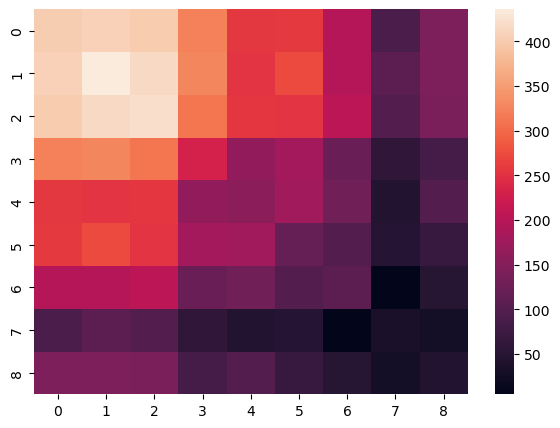

In [39]:
plt.rcParams["figure.figsize"] = (7, 5)
print(counts)
sns.heatmap(pd.DataFrame.from_dict(counts))

In [143]:
print(adata_z9)

AnnData object with n_obs × n_vars = 366 × 72
    obs: 'leiden', 'scanpy', 'entropy'
    uns: 'neighbors', 'leiden', 'umap', 'leiden_colors', 'scanpy_colors', 'iroot'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'


In [26]:
import statsmodels.api as sm
import statsmodels as sm

c1=0
c2=1

path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_results.csv"
r = pd.read_csv(path)

#  BH procedure to control the FDR rate
_p = r[f"cluster{c1}_{c2}_pvalue"].values.copy()

for pair in r['lr_pair']: 
    condition = np.where(r['lr_pair'] == pair)[0]
    adjusted = sm.stats.multitest.fdrcorrection(r[f"cluster{c1}_{c2}_pvalue"].values[condition])
    _p[condition] = adjusted[1]
#results[f"cluster{c1}_{c2}_pvalue_adjusted"] = _p
#print(_p)
#print("\n\n\n")

_p = r[f"cluster{c2}_{c1}_pvalue"].values.copy()

for pair in r['lr_pair']: 
    condition = np.where(r['lr_pair'] == pair)[0]
    adjusted = sm.stats.multitest.fdrcorrection(r[f"cluster{c2}_{c1}_pvalue"].values[condition])
    _p[condition] = adjusted[1]
#results[f"cluster{c2}_{c1}_pvalue_adjusted"] = _p
#print(_p)
#print("\n\n\n")

#print(results)

p_12_adj = sm.stats.multitest.fdrcorrection(r[f"cluster{c1}_{c2}_pvalue"].values.copy())[1]
p_21_adj = sm.stats.multitest.fdrcorrection(r[f"cluster{c2}_{c1}_pvalue"].values.copy())[1]
#print(p_12_adj)
#print("\n\n\n")
#print(p_21_adj)

'''
# count significant genes
cutoff =  0.05
name_p = f"cluster{c1}_{c2}_pvalue_adjusted"

'''
#_counts = []
#for p in results['lr_pair']:
    #condition = results['lr_pair'] == p
    #_counts.append((results[condition][name_p] < cutoff).sum())

#df_pool = pd.DataFrame(list(set(df['lr_pair'])))
#df_pool['counts'] = _counts
'''
# subset only contains significant pairs
condition = results[name_p] < cutoff
df_sig = results[condition].copy()
df_sig.reset_index(inplace=True)

path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_results.csv"
results.to_csv(path)
path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_sig_results.csv"
df_sig.to_csv(path)
'''

'\n# subset only contains significant pairs\ncondition = results[name_p] < cutoff\ndf_sig = results[condition].copy()\ndf_sig.reset_index(inplace=True)\n\npath = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_results.csv"\nresults.to_csv(path)\npath = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_sig_results.csv"\ndf_sig.to_csv(path)\n'

AnnData object with n_obs × n_vars = 366 × 12088
    obs: 'n_genes_by_counts', 'total_counts', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial_coord', 'spatial_coord-new_x', 'spatial_coord-new_y'
    varm: 'PCs'
    obsp: 'aff_matrix', 'agg_knn_connectivity', 'agg_matrix', 'connectivities', 'distances', 'gau_spa_distances', 'gene_distances', 'spa_distances'
                 n_cells_by_counts  mean_counts  pct_dropout_by_counts  \
ENSG00000000003                 78     0.106695              78.688525   
ENSG00000000005                  7     0.004252              98.087432   
ENSG00000000419                103     0.134307              71.857923   
ENSG00000000457                 47     0.048868              87.158470   
ENSG00000000460                 16     0.021034              95.628415   
...             

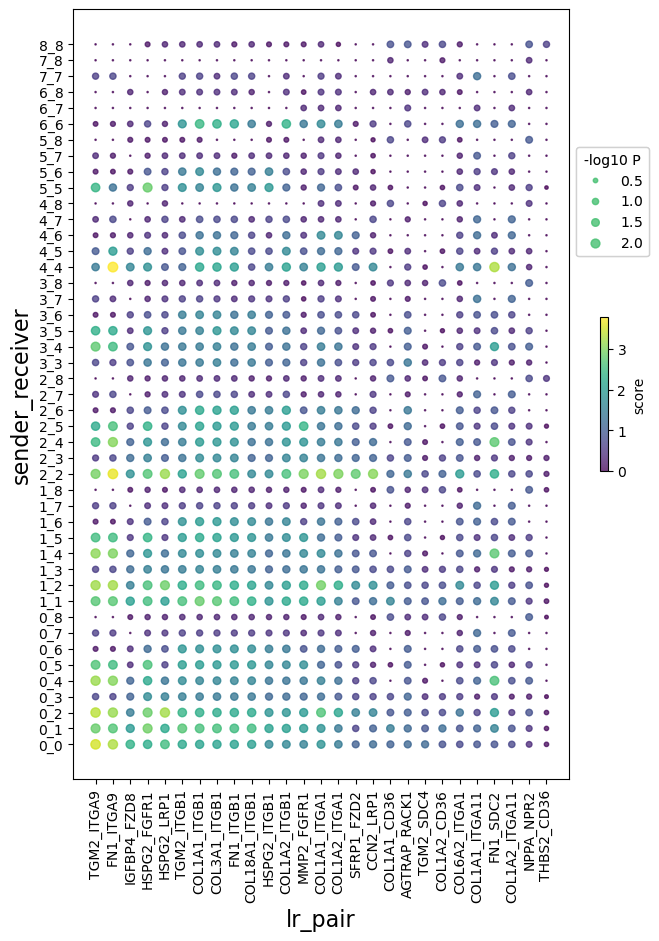

In [24]:
# visualize gene markers with dot plot
#print(top_markers)
plt.rcParams["figure.figsize"] = (10, 5)

grouped_pcw9.var_names = np.vectorize(fix)(grouped_pcw9.var_names.values)
print(grouped_pcw9)
print(grouped_pcw9.var)
#print(df_sig)


#sc.pl.DotPlot(grouped_pcw9, marker_genes, groupby='vae').show()
#sc.pl.dotplot(grouped_pcw9, marker_genes, groupby='vae', log=True)
lr_markers = []

for c1, c2 in combinations_with_replacement(np.unique(slingshot.cluster_labels), 2):
    path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_sig_results.csv"
    df_sig = pd.read_csv(path)
    for i in range(3):
        try: 
            lr_markers.append(df_sig['lr_pair'].loc[i])
        except:
            continue
    #marker_genes = df_sig['ligand_ensembl_gene_id'].tolist() + df_sig['receptor_ensembl_gene_id'].tolist()
    #dot_df = grouped_pcw9[:, marker_genes]

print(lr_markers)
#lr_markers = pd.Series(lr_markers) 
df_list = []

for c1, c2 in combinations_with_replacement(np.unique(slingshot.cluster_labels), 2):
#for c in np.unique(slingshot.cluster_labels):
    #c1 = c
    #c2 = c
    path = f"/Users/xueerding/Desktop/McGill/Winter 2022/BIOL 396/human_heart_dataset/cluster{c1}_{c2}_results.csv"
    df_res = pd.read_csv(path)
    lr_mask = np.logical_or.reduce(np.array([df_res['lr_pair'].isin(lr_markers)]))
    df_filtered = pd.DataFrame(df_res[lr_mask])
    X = df_filtered['lr_pair']
    Y = [str(c1) + '_' + str(c2)]*len(X)
    bubble_size = -np.log10(df_filtered[f"cluster{c1}_{c2}_pvalue"])*20
    color = df_filtered[f"cluster{c1}_{c2}_dot_score"]
    #colors = mean
    df = pd.DataFrame({
    'lr_pair': X,
    'sender_receiver': Y,
    "p_value":bubble_size,
    'score':color})
    df_list.append(df)

result = pd.concat(df_list)
print(result)
plt.style.use('default')
plt.rcParams["figure.figsize"] = (8, 10)

fig, ax = plt.subplots()
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

scatter = ax.scatter('lr_pair', 'sender_receiver', s='p_value', c='score', alpha=0.75, data=result)
plt.xlabel("lr_pair", size=16)
plt.xticks(rotation=90)
plt.ylabel("sender_receiver", size=16)


handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
kw = dict(prop="sizes", num=5, color=scatter.cmap(0.7),
          func=lambda s: s/20)
legend1 = ax.legend(*scatter.legend_elements(**kw), loc="center left", title="-log10 P", ncol=1, bbox_to_anchor=(1, 0.75))
ax.add_artist(legend1)
#legend2 = ax.legend(*scatter.legend_elements(num=6), loc="center left", title="score", ncol=1, bbox_to_anchor=(1, 0.75))

fig.colorbar(scatter, label='score', shrink=.2)

#plt.close()

In [44]:
from chord import Chord

print(counts)
print(np.unique(slingshot.cluster_labels))

Chord(counts.tolist(), np.unique(slingshot.cluster_labels).tolist()).show()

import holoviews as hv
from holoviews import opts, dim

# data set
clusters = np.unique(slingshot.cluster_labels).astype(str).tolist()
nodes = hv.Dataset(clusters, 'index')

source = []
target = []
count = []
for c1, c2 in combinations_with_replacement(np.unique(slingshot.cluster_labels), 2):
    source.append(c1)
    target.append(c2)
    count.append(counts[c1][c2])
    
dic = {'source': source, 'target': target, 'count':count}
print(count)
links = pd.DataFrame(dic)


# chord diagram
chord = hv.Chord(links)
#chord.opts(
#    opts.Chord(cmap='Category20', edge_cmap='Category20', edge_color=dim('source').str(), 
#               labels='source', node_color=dim('index').str()))


[[ 2.  8.  5.  2. 17. 11. 16.  0.  0.]
 [ 3. 13. 10.  8. 24. 12. 22.  0.  0.]
 [ 1.  6. 13.  5. 32. 10. 22.  0.  0.]
 [10. 16. 18. 15. 31. 13. 22.  2.  1.]
 [15. 29. 28. 20. 61. 20. 24. 11.  2.]
 [ 2.  7.  8.  6. 16. 13. 17.  0.  0.]
 [18. 23. 25. 20. 40. 23. 44.  0.  1.]
 [ 0.  0.  0.  0.  4.  0.  0.  1.  0.]
 [ 0.  0.  0.  5.  2.  2.  4.  0.  0.]]
[0 1 2 3 4 5 6 7 8]


[2.0, 8.0, 5.0, 2.0, 17.0, 11.0, 16.0, 0.0, 0.0, 13.0, 10.0, 8.0, 24.0, 12.0, 22.0, 0.0, 0.0, 13.0, 5.0, 32.0, 10.0, 22.0, 0.0, 0.0, 15.0, 31.0, 13.0, 22.0, 2.0, 1.0, 61.0, 20.0, 24.0, 11.0, 2.0, 13.0, 17.0, 0.0, 0.0, 44.0, 0.0, 1.0, 1.0, 0.0, 0.0]


/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/holoviews/element/graphs.py:660: RuntimeWarning: divide by zero encountered in double_scalars
  values = np.ceil(values*(1./values.min()))
/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/holoviews/element/graphs.py:660: RuntimeWarning: invalid value encountered in multiply
  values = np.ceil(values*(1./values.min()))


Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3369, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/v5/d5vcxjwx6mj_cx88pcqbz49c0000gn/T/ipykernel_47526/1216507187.py", line 29, in <cell line: 29>
    chord = hv.Chord(links)
  File "/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/holoviews/element/graphs.py", line 782, in __init__
    chord = layout_chords(self)
  File "/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/param/parameterized.py", line 3654, in __new__
    return inst.__call__(*args,**params)
  File "/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/holoviews/core/operation.py", line 220, in __call__
    return element.apply(self, **kwargs)
  File "/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/holoviews/core/accessors.py", line 45, in pipelined_call
 

In [ ]:
# scanpy requires annotation of root node
sc.pp.neighbors(adata_z4, n_neighbors=20, use_rep='X', method='gauss')  # default method to compute connectivity umap
sc.tl.diffmap(adata_z4)
sc.tl.dpt(adata_z4, n_branchings=1)
sc.pl.diffmap(adata_z4, color=['dpt_pseudotime', 'dpt_groups', 'leiden','entropy'])
sc.pl.dpt_groups_pseudotime(adata_z4)
sc.pl.dpt_timeseries(adata_z4)

computing neighbors
    finished (0:00:00)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9317715  0.9283413  0.89922625 0.80828595 0.77531123
     0.72735655 0.6407528  0.6180363  0.5853569  0.56438315 0.53476083
     0.5195806  0.50632405 0.48098963]
    finished (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished (0:00:00)


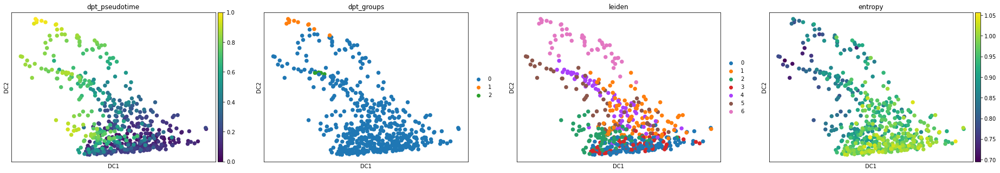

/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/scanpy/plotting/_utils.py:118: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  X = X[:, None]


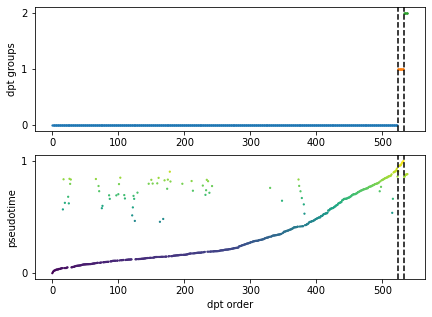

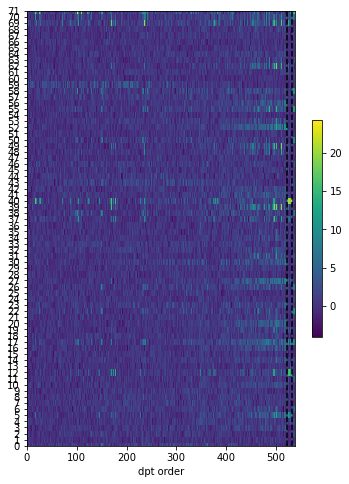

In [84]:
# scanpy requires annotation of root node

sc.pp.neighbors(adata_z6, n_neighbors=20, use_rep='X', method='gauss')  # default method to compute connectivity umap
sc.tl.diffmap(adata_z6)
sc.tl.dpt(adata_z6, n_branchings=1)
sc.pl.diffmap(adata_z6, color=['dpt_pseudotime', 'dpt_groups', 'leiden', 'entropy'])
sc.pl.dpt_groups_pseudotime(adata_z6)
sc.pl.dpt_timeseries(adata_z6)

computing neighbors
    finished (0:00:00)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.954071   0.94533736 0.89070934 0.83755857 0.821163
     0.7643621  0.7307185  0.711728   0.6447117  0.5768109  0.51329774
     0.5078612  0.3974109  0.38326716]
    finished (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished (0:00:00)


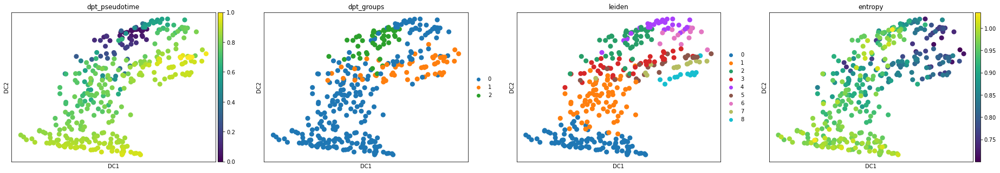

/Users/xueerding/opt/anaconda3/envs/gvae/lib/python3.8/site-packages/scanpy/plotting/_utils.py:118: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  X = X[:, None]


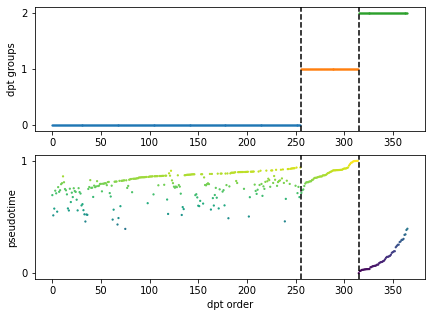

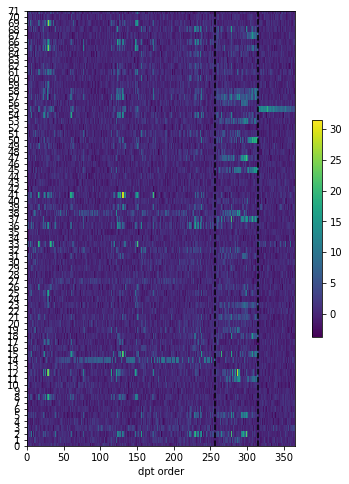

In [85]:
# scanpy requires annotation of root node

sc.pp.neighbors(adata_z9, n_neighbors=20, use_rep='X', method='gauss')  # default method to compute connectivity umap
sc.tl.diffmap(adata_z9)
sc.tl.dpt(adata_z9, n_branchings=1)
sc.pl.diffmap(adata_z9, color=['dpt_pseudotime', 'dpt_groups', 'leiden', 'entropy'])
sc.pl.dpt_groups_pseudotime(adata_z9)
sc.pl.dpt_timeseries(adata_z9)

In [86]:
#sc.pl.umap(grouped_pcw6, color='ENSG00000149925.17')
#plot_genemap(grouped_pcw6, 'ENSG00000149925.17')
#print(grouped_pcw6.var_names)
#ensembl = mg.query(q="symbol:ALDOA", fields="ensembl.gene", species='human')['hits'][0]["ensembl"]['gene']
#print(ensembl)
ensembl = 'ENSG00000001617'
for gene in list(data.obs_names):
    if ensembl in gene:
        print(gene)

ENSG00000001617.11


In [ ]:
#plot_genemap(grouped_pcw6, 'ENSG00000149925.17')

In [154]:
4*6*(11.25+135.25+5.75)+3285
print(grouped_pcw9)

AnnData object with n_obs × n_vars = 366 × 12088
    obs: 'n_genes_by_counts', 'total_counts', 'leiden', 'vae'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'spatial_score'
    uns: 'log1p', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors', 'rank_genes_groups_scanpy', 'rank_genes_groups_vae'
    obsm: 'spatial_coord-new_x', 'spatial_coord-new_y', 'spatial_coord', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'spa_distances', 'gau_spa_distances', 'gene_distances', 'aff_matrix', 'agg_matrix', 'agg_knn_connectivity', 'distances', 'connectivities'


In [25]:
#import dill
#dill.detect.trace(True)
#dill.dump_session('clustering_copy1.db')

AnnData object with n_obs × n_vars = 366 × 12088
    obs: 'n_genes_by_counts', 'total_counts', 'leiden', 'vae'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'spatial_score'
    uns: 'log1p', 'pca', 'neighbors', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors', 'rank_genes_groups_scanpy', 'rank_genes_groups_vae'
    obsm: 'spatial_coord-new_x', 'spatial_coord-new_y', 'spatial_coord', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'spa_distances', 'gau_spa_distances', 'gene_distances', 'aff_matrix', 'agg_matrix', 'agg_knn_connectivity', 'distances', 'connectivities'
